In [1]:
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import datetime
%matplotlib inline

In [2]:
n_sensors=16

In [3]:
x = np.linspace(0, 1, 101)
y = np.linspace(0, 1, 101)

In [4]:
t = np.linspace(0, 1, 41)

In [5]:
xrange = np.linspace(0, 1, 101)
yrange = np.linspace(0, 1, 101)
xmesh, ymesh = np.meshgrid(xrange, yrange)

In [6]:
from matplotlib.colors import LinearSegmentedColormap

cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
 [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
 [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
  0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
 [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
  0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
 [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
  0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
 [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
  0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
 [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
  0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
 [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
  0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
  0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
 [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
  0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
 [0.0589714286, 0.6837571429, 0.7253857143], 
 [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
 [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
  0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
 [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
  0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
 [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
  0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
 [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
  0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
 [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
 [0.7184095238, 0.7411333333, 0.3904761905], 
 [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
  0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
 [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
 [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
  0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
 [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
  0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
 [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
 [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
 [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
  0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
 [0.9763, 0.9831, 0.0538]]

parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

$$ f_1(x, y, t) = e^{-t}(cos2\pi xcos2\pi y + sin2\pi xsin2\pi y) $$
$$ f_2(x, y, t) = x + y + t $$
$$ f_3(x, y, t) = e^{-t}(2sin2\pi x + sin2\pi xcos2\pi y) $$

Case 1: f1

In [7]:
out1 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out1[i, j, k] = np.exp(-t[i])*(np.cos(2*np.pi*x[j])*np.cos(2*np.pi*y[k])
                                           + np.sin(2*np.pi*x[j])*np.sin(2*np.pi*y[k]))

In [8]:
out1[0, :, :]

array([[1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ],
       [0.99802673, 1.        , 0.99802673, ..., 0.98228725, 0.9921147 ,
        0.99802673],
       [0.9921147 , 0.99802673, 1.        , ..., 0.96858316, 0.98228725,
        0.9921147 ],
       ...,
       [0.9921147 , 0.98228725, 0.96858316, ..., 1.        , 0.99802673,
        0.9921147 ],
       [0.99802673, 0.9921147 , 0.98228725, ..., 0.99802673, 1.        ,
        0.99802673],
       [1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ]])

In [9]:
sensor1 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor1[i, j, k] = out1[i, 20*(j+1)+1, 20*(k+1)+1]

In [10]:
sensor1.shape

(41, 4, 4)

In [11]:
sensor1 = sensor1.reshape(41, 16, 1)

In [12]:
sensor1.shape

(41, 16, 1)

In [13]:
x_train1, x_test1, y_train1, y_test1, t_train, t_test = train_test_split(sensor1, out1, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [14]:
t_train

array([[0.725],
       [0.15 ],
       [0.65 ],
       [0.3  ],
       [0.425],
       [0.225],
       [0.375],
       [0.8  ],
       [0.4  ],
       [0.875],
       [0.85 ],
       [0.   ],
       [0.675],
       [0.125],
       [0.275],
       [0.025],
       [0.75 ],
       [0.525],
       [0.05 ],
       [0.775],
       [0.925],
       [0.075],
       [0.9  ],
       [0.575],
       [0.825],
       [0.25 ],
       [0.55 ],
       [0.45 ],
       [0.5  ],
       [0.175],
       [0.35 ],
       [0.7  ],
       [0.95 ]])

In [15]:
x_train1

array([[[ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457]],

       [[ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798]],

       [[ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
       

In [16]:
x_test1

array([[[ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164]],

       [[ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735]],

       [[ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
       

In [17]:
input_time = tf.keras.Input(shape=(1))
reshape = tf.keras.layers.Reshape((1,))(input_time)

x_ = tf.keras.layers.Dense(units=5, activation='relu', name='firstHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=5, activation='relu', name='secondHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=5, activation='relu', name='thirdHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=5, activation='relu', name='fourthHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=16, activation=None, name='outputLayerSensor')(x_)
output_sensor = tf.keras.layers.Reshape((16, 1))(output_data)
# MLP
sensor_pred1 = tf.keras.Model(input_time, output_sensor)
sensor_pred2 = tf.keras.Model(input_time, output_sensor)
sensor_pred3 = tf.keras.Model(input_time, output_sensor)

In [18]:
sensor_pred1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1)]               0         
                                                                 
 reshape (Reshape)           (None, 1)                 0         
                                                                 
 firstHiddenLayerSensor (Den  (None, 5)                10        
 se)                                                             
                                                                 
 batch_normalization (BatchN  (None, 5)                20        
 ormalization)                                                   
                                                                 
 secondHiddenLayerSensor (De  (None, 5)                30        
 nse)                                                            
                                                             

In [19]:
sensor_pred1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [20]:
start1 = datetime.datetime.now()
history1 = sensor_pred1.fit(t_train, x_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 8ms/step - loss: 0.6563 - rmse: 0.8003
Epoch 2/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6554 - rmse: 0.7998
Epoch 3/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6525 - rmse: 0.7980
Epoch 4/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6539 - rmse: 0.7988
Epoch 5/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.6511 - rmse: 0.7971
Epoch 6/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6502 - rmse: 0.7965
Epoch 7/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6485 - rmse: 0.7954
Epoch 8/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6491 - rmse: 0.7958
Epoch 9/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6455 - rmse: 0.7935
Epoch 10/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6441 - rmse: 0.7927
Epoch 11/10000
2/2 [============================

2/2 [==============================] - 0s 8ms/step - loss: 0.5359 - rmse: 0.7215
Epoch 87/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5340 - rmse: 0.7201
Epoch 88/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5385 - rmse: 0.7232
Epoch 89/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5294 - rmse: 0.7169
Epoch 90/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5323 - rmse: 0.7189
Epoch 91/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5379 - rmse: 0.7228
Epoch 92/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5329 - rmse: 0.7193
Epoch 93/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5318 - rmse: 0.7186
Epoch 94/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5310 - rmse: 0.7180
Epoch 95/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5264 - rmse: 0.7148
Epoch 96/10000
2/2 [==============================] - 

2/2 [==============================] - 0s 8ms/step - loss: 0.4651 - rmse: 0.6708
Epoch 171/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4643 - rmse: 0.6702
Epoch 172/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4574 - rmse: 0.6651
Epoch 173/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4611 - rmse: 0.6678
Epoch 174/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4651 - rmse: 0.6708
Epoch 175/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4594 - rmse: 0.6665
Epoch 176/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4615 - rmse: 0.6681
Epoch 177/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4600 - rmse: 0.6670
Epoch 178/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4613 - rmse: 0.6680
Epoch 179/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4594 - rmse: 0.6666
Epoch 180/10000
2/2 [====================

2/2 [==============================] - 0s 13ms/step - loss: 0.3875 - rmse: 0.6105
Epoch 255/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3853 - rmse: 0.6087
Epoch 256/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3835 - rmse: 0.6072
Epoch 257/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3862 - rmse: 0.6094
Epoch 258/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3863 - rmse: 0.6094
Epoch 259/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3855 - rmse: 0.6088
Epoch 260/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3839 - rmse: 0.6075
Epoch 261/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3806 - rmse: 0.6047
Epoch 262/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3832 - rmse: 0.6069
Epoch 263/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3841 - rmse: 0.6077
Epoch 264/10000
2/2 [====================

2/2 [==============================] - 0s 14ms/step - loss: 0.3368 - rmse: 0.5676
Epoch 339/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3407 - rmse: 0.5710
Epoch 340/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3402 - rmse: 0.5706
Epoch 341/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3355 - rmse: 0.5665
Epoch 342/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3373 - rmse: 0.5681
Epoch 343/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3350 - rmse: 0.5660
Epoch 344/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3331 - rmse: 0.5644
Epoch 345/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3348 - rmse: 0.5658
Epoch 346/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3325 - rmse: 0.5639
Epoch 347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3373 - rmse: 0.5681
Epoch 348/10000
2/2 [===================

2/2 [==============================] - 0s 13ms/step - loss: 0.2937 - rmse: 0.5285
Epoch 423/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2893 - rmse: 0.5243
Epoch 424/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2877 - rmse: 0.5228
Epoch 425/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2887 - rmse: 0.5238
Epoch 426/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2871 - rmse: 0.5222
Epoch 427/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2865 - rmse: 0.5217
Epoch 428/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2860 - rmse: 0.5212
Epoch 429/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2856 - rmse: 0.5208
Epoch 430/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2852 - rmse: 0.5205
Epoch 431/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2853 - rmse: 0.5205
Epoch 432/10000
2/2 [====================

2/2 [==============================] - 0s 9ms/step - loss: 0.2527 - rmse: 0.4884
Epoch 507/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2515 - rmse: 0.4872
Epoch 508/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2556 - rmse: 0.4914
Epoch 509/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2520 - rmse: 0.4878
Epoch 510/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2487 - rmse: 0.4843
Epoch 511/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2536 - rmse: 0.4894
Epoch 512/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2503 - rmse: 0.4860
Epoch 513/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2491 - rmse: 0.4847
Epoch 514/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2515 - rmse: 0.4872
Epoch 515/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2471 - rmse: 0.4827
Epoch 516/10000
2/2 [====================

2/2 [==============================] - 0s 10ms/step - loss: 0.2211 - rmse: 0.4552
Epoch 591/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2205 - rmse: 0.4545
Epoch 592/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2201 - rmse: 0.4541
Epoch 593/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2206 - rmse: 0.4546
Epoch 594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2200 - rmse: 0.4539
Epoch 595/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2197 - rmse: 0.4536
Epoch 596/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2239 - rmse: 0.4583
Epoch 597/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2243 - rmse: 0.4587
Epoch 598/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2190 - rmse: 0.4529
Epoch 599/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2234 - rmse: 0.4578
Epoch 600/10000
2/2 [===================

2/2 [==============================] - 0s 11ms/step - loss: 0.1952 - rmse: 0.4260
Epoch 675/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1951 - rmse: 0.4259
Epoch 676/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1951 - rmse: 0.4259
Epoch 677/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1939 - rmse: 0.4245
Epoch 678/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1941 - rmse: 0.4248
Epoch 679/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1943 - rmse: 0.4250
Epoch 680/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1918 - rmse: 0.4221
Epoch 681/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1932 - rmse: 0.4237
Epoch 682/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1928 - rmse: 0.4233
Epoch 683/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1902 - rmse: 0.4202
Epoch 684/10000
2/2 [==================

2/2 [==============================] - 0s 13ms/step - loss: 0.1711 - rmse: 0.3971
Epoch 759/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1757 - rmse: 0.4027
Epoch 760/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1703 - rmse: 0.3960
Epoch 761/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1715 - rmse: 0.3975
Epoch 762/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1696 - rmse: 0.3952
Epoch 763/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1730 - rmse: 0.3995
Epoch 764/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1691 - rmse: 0.3945
Epoch 765/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1713 - rmse: 0.3972
Epoch 766/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1714 - rmse: 0.3974
Epoch 767/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1714 - rmse: 0.3974
Epoch 768/10000
2/2 [===================

Epoch 842/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1529 - rmse: 0.3736
Epoch 843/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1528 - rmse: 0.3736
Epoch 844/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1518 - rmse: 0.3722
Epoch 845/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1522 - rmse: 0.3728
Epoch 846/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1560 - rmse: 0.3779
Epoch 847/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1515 - rmse: 0.3718
Epoch 848/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1534 - rmse: 0.3743
Epoch 849/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1520 - rmse: 0.3725
Epoch 850/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1513 - rmse: 0.3715
Epoch 851/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1510 - rmse: 0.3711
Epoch 852/10000
2/2 [=

2/2 [==============================] - 0s 14ms/step - loss: 0.1347 - rmse: 0.3488
Epoch 926/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1342 - rmse: 0.3480
Epoch 927/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1376 - rmse: 0.3528
Epoch 928/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1339 - rmse: 0.3476
Epoch 929/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1348 - rmse: 0.3489
Epoch 930/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1338 - rmse: 0.3475
Epoch 931/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1322 - rmse: 0.3451
Epoch 932/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1340 - rmse: 0.3478
Epoch 933/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1327 - rmse: 0.3459
Epoch 934/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1315 - rmse: 0.3441
Epoch 935/10000
2/2 [=================

2/2 [==============================] - 0s 9ms/step - loss: 0.1198 - rmse: 0.3270
Epoch 1009/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1191 - rmse: 0.3259
Epoch 1010/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1194 - rmse: 0.3264
Epoch 1011/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1187 - rmse: 0.3254
Epoch 1012/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1180 - rmse: 0.3243
Epoch 1013/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1183 - rmse: 0.3248
Epoch 1014/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1182 - rmse: 0.3245
Epoch 1015/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1180 - rmse: 0.3242
Epoch 1016/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1196 - rmse: 0.3267
Epoch 1017/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1175 - rmse: 0.3235
Epoch 1018/10000
2/2 [======

2/2 [==============================] - 0s 14ms/step - loss: 0.1051 - rmse: 0.3041
Epoch 1092/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1060 - rmse: 0.3055
Epoch 1093/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1057 - rmse: 0.3051
Epoch 1094/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1045 - rmse: 0.3031
Epoch 1095/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1051 - rmse: 0.3040
Epoch 1096/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1059 - rmse: 0.3054
Epoch 1097/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1045 - rmse: 0.3030
Epoch 1098/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1055 - rmse: 0.3048
Epoch 1099/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1050 - rmse: 0.3039
Epoch 1100/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1037 - rmse: 0.3018
Epoch 1101/10000
2/2 [======

2/2 [==============================] - 0s 13ms/step - loss: 0.0926 - rmse: 0.2832
Epoch 1175/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0944 - rmse: 0.2863
Epoch 1176/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0990 - rmse: 0.2942
Epoch 1177/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0942 - rmse: 0.2860
Epoch 1178/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0914 - rmse: 0.2810
Epoch 1179/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0960 - rmse: 0.2890
Epoch 1180/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0933 - rmse: 0.2843
Epoch 1181/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0925 - rmse: 0.2829
Epoch 1182/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0929 - rmse: 0.2836
Epoch 1183/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0926 - rmse: 0.2832
Epoch 1184/10000
2/2 [========

2/2 [==============================] - 0s 13ms/step - loss: 0.0836 - rmse: 0.2671
Epoch 1258/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0825 - rmse: 0.2651
Epoch 1259/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0818 - rmse: 0.2637
Epoch 1260/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0842 - rmse: 0.2682
Epoch 1261/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0825 - rmse: 0.2651
Epoch 1262/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0824 - rmse: 0.2649
Epoch 1263/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0822 - rmse: 0.2645
Epoch 1264/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0832 - rmse: 0.2664
Epoch 1265/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0836 - rmse: 0.2671
Epoch 1266/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0818 - rmse: 0.2638
Epoch 1267/10000
2/2 [======

2/2 [==============================] - 0s 14ms/step - loss: 0.0732 - rmse: 0.2474
Epoch 1341/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0740 - rmse: 0.2488
Epoch 1342/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0723 - rmse: 0.2454
Epoch 1343/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0725 - rmse: 0.2459
Epoch 1344/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0714 - rmse: 0.2437
Epoch 1345/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0774 - rmse: 0.2557
Epoch 1346/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0736 - rmse: 0.2481
Epoch 1347/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0753 - rmse: 0.2515
Epoch 1348/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0734 - rmse: 0.2477
Epoch 1349/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0722 - rmse: 0.2452
Epoch 1350/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0642 - rmse: 0.2287
Epoch 1424/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0635 - rmse: 0.2272
Epoch 1425/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0646 - rmse: 0.2297
Epoch 1426/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0670 - rmse: 0.2348
Epoch 1427/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0668 - rmse: 0.2344
Epoch 1428/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0642 - rmse: 0.2289
Epoch 1429/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0656 - rmse: 0.2319
Epoch 1430/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0643 - rmse: 0.2290
Epoch 1431/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0643 - rmse: 0.2289
Epoch 1432/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0630 - rmse: 0.2262
Epoch 1433/10000
2/2 [=======

2/2 [==============================] - 0s 14ms/step - loss: 0.0564 - rmse: 0.2115
Epoch 1507/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0574 - rmse: 0.2139
Epoch 1508/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0575 - rmse: 0.2141
Epoch 1509/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0589 - rmse: 0.2173
Epoch 1510/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0573 - rmse: 0.2137
Epoch 1511/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0606 - rmse: 0.2213
Epoch 1512/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0572 - rmse: 0.2135
Epoch 1513/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0575 - rmse: 0.2142
Epoch 1514/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0615 - rmse: 0.2233
Epoch 1515/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0582 - rmse: 0.2157
Epoch 1516/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 0.0570 - rmse: 0.2133
Epoch 1590/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0511 - rmse: 0.1989
Epoch 1591/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0512 - rmse: 0.1994
Epoch 1592/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0522 - rmse: 0.2018
Epoch 1593/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0563 - rmse: 0.2118
Epoch 1594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0515 - rmse: 0.2000
Epoch 1595/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0506 - rmse: 0.1978
Epoch 1596/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0541 - rmse: 0.2066
Epoch 1597/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0497 - rmse: 0.1955
Epoch 1598/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0516 - rmse: 0.2002
Epoch 1599/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 0.0460 - rmse: 0.1863
Epoch 1673/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0484 - rmse: 0.1926
Epoch 1674/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0450 - rmse: 0.1836
Epoch 1675/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0456 - rmse: 0.1852
Epoch 1676/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0470 - rmse: 0.1888
Epoch 1677/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0522 - rmse: 0.2023
Epoch 1678/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0466 - rmse: 0.1879
Epoch 1679/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0456 - rmse: 0.1853
Epoch 1680/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0473 - rmse: 0.1897
Epoch 1681/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0452 - rmse: 0.1842
Epoch 1682/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 0.0421 - rmse: 0.1761
Epoch 1756/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0415 - rmse: 0.1742
Epoch 1757/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0413 - rmse: 0.1737
Epoch 1758/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0419 - rmse: 0.1753
Epoch 1759/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0419 - rmse: 0.1754
Epoch 1760/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0426 - rmse: 0.1774
Epoch 1761/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0421 - rmse: 0.1760
Epoch 1762/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0411 - rmse: 0.1731
Epoch 1763/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0405 - rmse: 0.1714
Epoch 1764/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0444 - rmse: 0.1825
Epoch 1765/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0388 - rmse: 0.1668
Epoch 1839/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0385 - rmse: 0.1659
Epoch 1840/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0424 - rmse: 0.1774
Epoch 1841/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0380 - rmse: 0.1646
Epoch 1842/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0382 - rmse: 0.1650
Epoch 1843/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0379 - rmse: 0.1641
Epoch 1844/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0378 - rmse: 0.1639
Epoch 1845/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0423 - rmse: 0.1771
Epoch 1846/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0388 - rmse: 0.1670
Epoch 1847/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0370 - rmse: 0.1615
Epoch 1848/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0345 - rmse: 0.1542
Epoch 1922/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0369 - rmse: 0.1616
Epoch 1923/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0349 - rmse: 0.1553
Epoch 1924/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0350 - rmse: 0.1557
Epoch 1925/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0349 - rmse: 0.1553
Epoch 1926/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0340 - rmse: 0.1524
Epoch 1927/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0348 - rmse: 0.1549
Epoch 1928/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0340 - rmse: 0.1524
Epoch 1929/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0338 - rmse: 0.1520
Epoch 1930/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0352 - rmse: 0.1563
Epoch 1931/10000
2/2 [========

2/2 [==============================] - 0s 14ms/step - loss: 0.0333 - rmse: 0.1507
Epoch 2005/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0316 - rmse: 0.1450
Epoch 2006/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0335 - rmse: 0.1513
Epoch 2007/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0317 - rmse: 0.1454
Epoch 2008/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0309 - rmse: 0.1424
Epoch 2009/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0361 - rmse: 0.1597
Epoch 2010/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0313 - rmse: 0.1438
Epoch 2011/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0316 - rmse: 0.1451
Epoch 2012/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0316 - rmse: 0.1450
Epoch 2013/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0348 - rmse: 0.1556
Epoch 2014/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0298 - rmse: 0.1392
Epoch 2088/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0288 - rmse: 0.1355
Epoch 2089/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0287 - rmse: 0.1352
Epoch 2090/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0286 - rmse: 0.1348
Epoch 2091/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0287 - rmse: 0.1353
Epoch 2092/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0281 - rmse: 0.1329
Epoch 2093/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0288 - rmse: 0.1355
Epoch 2094/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0293 - rmse: 0.1376
Epoch 2095/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0284 - rmse: 0.1340
Epoch 2096/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0333 - rmse: 0.1512
Epoch 2097/10000
2/2 [========

2/2 [==============================] - 0s 13ms/step - loss: 0.0263 - rmse: 0.1268
Epoch 2171/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0265 - rmse: 0.1275
Epoch 2172/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0261 - rmse: 0.1257
Epoch 2173/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0293 - rmse: 0.1380
Epoch 2174/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0263 - rmse: 0.1268
Epoch 2175/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0259 - rmse: 0.1252
Epoch 2176/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0286 - rmse: 0.1354
Epoch 2177/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0265 - rmse: 0.1273
Epoch 2178/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0264 - rmse: 0.1270
Epoch 2179/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0268 - rmse: 0.1288
Epoch 2180/10000
2/2 [========

2/2 [==============================] - 0s 13ms/step - loss: 0.0249 - rmse: 0.1215
Epoch 2254/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0242 - rmse: 0.1188
Epoch 2255/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0238 - rmse: 0.1169
Epoch 2256/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0241 - rmse: 0.1185
Epoch 2257/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0252 - rmse: 0.1228
Epoch 2258/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0240 - rmse: 0.1180
Epoch 2259/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0266 - rmse: 0.1286
Epoch 2260/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0244 - rmse: 0.1199
Epoch 2261/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0245 - rmse: 0.1203
Epoch 2262/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0245 - rmse: 0.1201
Epoch 2263/10000
2/2 [=======

2/2 [==============================] - 0s 14ms/step - loss: 0.0231 - rmse: 0.1150
Epoch 2337/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0224 - rmse: 0.1116
Epoch 2338/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0222 - rmse: 0.1109
Epoch 2339/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0221 - rmse: 0.1104
Epoch 2340/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0227 - rmse: 0.1132
Epoch 2341/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0218 - rmse: 0.1093
Epoch 2342/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0223 - rmse: 0.1114
Epoch 2343/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0222 - rmse: 0.1109
Epoch 2344/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0227 - rmse: 0.1133
Epoch 2345/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0224 - rmse: 0.1117
Epoch 2346/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 0.0213 - rmse: 0.1077
Epoch 2420/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0209 - rmse: 0.1059
Epoch 2421/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0261 - rmse: 0.1279
Epoch 2422/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0222 - rmse: 0.1115
Epoch 2423/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0209 - rmse: 0.1058
Epoch 2424/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0206 - rmse: 0.1045
Epoch 2425/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0205 - rmse: 0.1039
Epoch 2426/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0210 - rmse: 0.1064
Epoch 2427/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0242 - rmse: 0.1204
Epoch 2428/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0210 - rmse: 0.1063
Epoch 2429/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0197 - rmse: 0.1007
Epoch 2503/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0190 - rmse: 0.0969
Epoch 2504/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0246 - rmse: 0.1228
Epoch 2505/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0195 - rmse: 0.0995
Epoch 2506/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0211 - rmse: 0.1072
Epoch 2507/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0195 - rmse: 0.0997
Epoch 2508/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0202 - rmse: 0.1030
Epoch 2509/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0202 - rmse: 0.1030
Epoch 2510/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0189 - rmse: 0.0968
Epoch 2511/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0195 - rmse: 0.0996
Epoch 2512/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0164 - rmse: 0.0836
Epoch 2586/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0163 - rmse: 0.0829
Epoch 2587/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0157 - rmse: 0.0797
Epoch 2588/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0155 - rmse: 0.0780
Epoch 2589/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0168 - rmse: 0.0860
Epoch 2590/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0170 - rmse: 0.0875
Epoch 2591/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0160 - rmse: 0.0814
Epoch 2592/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0172 - rmse: 0.0887
Epoch 2593/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0158 - rmse: 0.0800
Epoch 2594/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0191 - rmse: 0.0986
Epoch 2595/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0138 - rmse: 0.0678
Epoch 2669/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0181 - rmse: 0.0941
Epoch 2670/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0140 - rmse: 0.0693
Epoch 2671/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0144 - rmse: 0.0721
Epoch 2672/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0142 - rmse: 0.0703
Epoch 2673/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0141 - rmse: 0.0702
Epoch 2674/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0151 - rmse: 0.0768
Epoch 2675/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0167 - rmse: 0.0864
Epoch 2676/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0140 - rmse: 0.0692
Epoch 2677/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0136 - rmse: 0.0664
Epoch 2678/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0137 - rmse: 0.0681
Epoch 2752/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0129 - rmse: 0.0620
Epoch 2753/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0132 - rmse: 0.0646
Epoch 2754/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0128 - rmse: 0.0613
Epoch 2755/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0128 - rmse: 0.0615
Epoch 2756/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0128 - rmse: 0.0611
Epoch 2757/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0125 - rmse: 0.0587
Epoch 2758/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0136 - rmse: 0.0677
Epoch 2759/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0126 - rmse: 0.0593
Epoch 2760/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0165 - rmse: 0.0865
Epoch 2761/10000
2/2 [=======

Epoch 2834/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0128 - rmse: 0.0621
Epoch 2835/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0128 - rmse: 0.0621
Epoch 2836/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0121 - rmse: 0.0570
Epoch 2837/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0119 - rmse: 0.0546
Epoch 2838/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0128 - rmse: 0.0622
Epoch 2839/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0127 - rmse: 0.0619
Epoch 2840/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0119 - rmse: 0.0551
Epoch 2841/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0120 - rmse: 0.0562
Epoch 2842/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0128 - rmse: 0.0623
Epoch 2843/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0117 - rmse: 0.0532
Epoch 2844/

2/2 [==============================] - 0s 9ms/step - loss: 0.0120 - rmse: 0.0573
Epoch 2917/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0113 - rmse: 0.0510
Epoch 2918/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0112 - rmse: 0.0498
Epoch 2919/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0112 - rmse: 0.0498
Epoch 2920/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0119 - rmse: 0.0565
Epoch 2921/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0117 - rmse: 0.0544
Epoch 2922/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0121 - rmse: 0.0582
Epoch 2923/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0121 - rmse: 0.0581
Epoch 2924/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0121 - rmse: 0.0585
Epoch 2925/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0111 - rmse: 0.0485
Epoch 2926/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0105 - rmse: 0.0444
Epoch 3000/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0105 - rmse: 0.0444
Epoch 3001/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0108 - rmse: 0.0474
Epoch 3002/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0116 - rmse: 0.0550
Epoch 3003/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0105 - rmse: 0.0441
Epoch 3004/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0107 - rmse: 0.0463
Epoch 3005/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0107 - rmse: 0.0457
Epoch 3006/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0105 - rmse: 0.0440
Epoch 3007/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0105 - rmse: 0.0446
Epoch 3008/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0108 - rmse: 0.0470
Epoch 3009/10000
2/2 [======

Epoch 3082/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0108 - rmse: 0.0491
Epoch 3083/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0102 - rmse: 0.0423
Epoch 3084/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0103 - rmse: 0.0437
Epoch 3085/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0104 - rmse: 0.0446
Epoch 3086/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0134 - rmse: 0.0708
Epoch 3087/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0103 - rmse: 0.0432
Epoch 3088/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0110 - rmse: 0.0511
Epoch 3089/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0131 - rmse: 0.0687
Epoch 3090/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0109 - rmse: 0.0501
Epoch 3091/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0102 - rmse: 0.0423
Epoch 3092/

2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0425
Epoch 3165/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0096 - rmse: 0.0374
Epoch 3166/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0425
Epoch 3167/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0096 - rmse: 0.0372
Epoch 3168/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0104 - rmse: 0.0466
Epoch 3169/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0105 - rmse: 0.0474
Epoch 3170/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0096 - rmse: 0.0374
Epoch 3171/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.0462
Epoch 3172/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0097 - rmse: 0.0379
Epoch 3173/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0122 - rmse: 0.0628
Epoch 3174/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0101 - rmse: 0.0456
Epoch 3248/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0093 - rmse: 0.0347
Epoch 3249/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0354
Epoch 3250/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0095 - rmse: 0.0377
Epoch 3251/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0119 - rmse: 0.0618
Epoch 3252/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0097 - rmse: 0.0409
Epoch 3253/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0118 - rmse: 0.0608
Epoch 3254/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0445
Epoch 3255/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0097 - rmse: 0.0410
Epoch 3256/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0102 - rmse: 0.0459
Epoch 3257/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.0093 - rmse: 0.0379
Epoch 3331/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0097 - rmse: 0.0419
Epoch 3332/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0097 - rmse: 0.0418
Epoch 3333/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0091 - rmse: 0.0349
Epoch 3334/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0093 - rmse: 0.0377
Epoch 3335/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0089 - rmse: 0.0320
Epoch 3336/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0099 - rmse: 0.0443
Epoch 3337/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0320
Epoch 3338/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0096 - rmse: 0.0408
Epoch 3339/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0319
Epoch 3340/10000
2/2 [=======

2/2 [==============================] - 0s 14ms/step - loss: 0.0108 - rmse: 0.0554
Epoch 3414/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0088 - rmse: 0.0318
Epoch 3415/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0087 - rmse: 0.0312
Epoch 3416/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0310
Epoch 3417/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0087 - rmse: 0.0304
Epoch 3418/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0315
Epoch 3419/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0089 - rmse: 0.0336
Epoch 3420/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0086 - rmse: 0.0295
Epoch 3421/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0095 - rmse: 0.0425
Epoch 3422/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0097 - rmse: 0.0442
Epoch 3423/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0343
Epoch 3497/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0089 - rmse: 0.0360
Epoch 3498/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0303
Epoch 3499/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0105 - rmse: 0.0539
Epoch 3500/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0297
Epoch 3501/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0085 - rmse: 0.0299
Epoch 3502/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0094 - rmse: 0.0424
Epoch 3503/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0084 - rmse: 0.0287
Epoch 3504/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0092 - rmse: 0.0406
Epoch 3505/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0390
Epoch 3506/10000
2/2 [========

2/2 [==============================] - 0s 14ms/step - loss: 0.0091 - rmse: 0.0404
Epoch 3580/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0090 - rmse: 0.0393
Epoch 3581/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0091 - rmse: 0.0404
Epoch 3582/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0084 - rmse: 0.0319
Epoch 3583/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0100 - rmse: 0.0505
Epoch 3584/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0298
Epoch 3585/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0085 - rmse: 0.0335
Epoch 3586/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0083 - rmse: 0.0297
Epoch 3587/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0306
Epoch 3588/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0099 - rmse: 0.0499
Epoch 3589/10000
2/2 [=====

Epoch 3662/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0084 - rmse: 0.0330
Epoch 3663/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0079 - rmse: 0.0254
Epoch 3664/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0268
Epoch 3665/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0085 - rmse: 0.0346
Epoch 3666/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0081 - rmse: 0.0286
Epoch 3667/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0083 - rmse: 0.0325
Epoch 3668/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0098 - rmse: 0.0505
Epoch 3669/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0083 - rmse: 0.0319
Epoch 3670/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0087 - rmse: 0.0381
Epoch 3671/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0114 - rmse: 0.0645
Epoch 3672

2/2 [==============================] - 0s 14ms/step - loss: 0.0077 - rmse: 0.0233
Epoch 3745/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0085 - rmse: 0.0377
Epoch 3746/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0272
Epoch 3747/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0085 - rmse: 0.0376
Epoch 3748/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0076 - rmse: 0.0230
Epoch 3749/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0080 - rmse: 0.0298
Epoch 3750/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0357
Epoch 3751/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0079 - rmse: 0.0287
Epoch 3752/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0096 - rmse: 0.0495
Epoch 3753/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0307
Epoch 3754/10000
2/2 [=====

Epoch 3827/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0307
Epoch 3828/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0080 - rmse: 0.0318
Epoch 3829/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0081 - rmse: 0.0335
Epoch 3830/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0075 - rmse: 0.0225
Epoch 3831/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0075 - rmse: 0.0234
Epoch 3832/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0080 - rmse: 0.0316
Epoch 3833/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0282
Epoch 3834/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0082 - rmse: 0.0351
Epoch 3835/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0085 - rmse: 0.0393
Epoch 3836/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0273
Epoch 3837/

2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0300
Epoch 3910/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0094 - rmse: 0.0504
Epoch 3911/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0075 - rmse: 0.0265
Epoch 3912/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0074 - rmse: 0.0248
Epoch 3913/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0103 - rmse: 0.0591
Epoch 3914/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0079 - rmse: 0.0330
Epoch 3915/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0080 - rmse: 0.0339
Epoch 3916/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0081 - rmse: 0.0357
Epoch 3917/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0075 - rmse: 0.0271
Epoch 3918/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0080 - rmse: 0.0348
Epoch 3919/10000
2/2 [=====

Epoch 3992/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0082 - rmse: 0.0393
Epoch 3993/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0074 - rmse: 0.0279
Epoch 3994/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0360
Epoch 3995/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0080 - rmse: 0.0360
Epoch 3996/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0073 - rmse: 0.0261
Epoch 3997/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0075 - rmse: 0.0292
Epoch 3998/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0387
Epoch 3999/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0080 - rmse: 0.0365
Epoch 4000/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0082 - rmse: 0.0396
Epoch 4001/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0099 - rmse: 0.0573
Epoch 4002/

2/2 [==============================] - 0s 14ms/step - loss: 0.0072 - rmse: 0.0258
Epoch 4075/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0362
Epoch 4076/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0212
Epoch 4077/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0220
Epoch 4078/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0079 - rmse: 0.0370
Epoch 4079/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0213
Epoch 4080/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0073 - rmse: 0.0284
Epoch 4081/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0071 - rmse: 0.0250
Epoch 4082/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0214
Epoch 4083/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0104 - rmse: 0.0621
Epoch 4084/10000
2/2 [=====

Epoch 4157/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0251
Epoch 4158/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0069 - rmse: 0.0226
Epoch 4159/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0216
Epoch 4160/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0074 - rmse: 0.0321
Epoch 4161/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0213
Epoch 4162/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0373
Epoch 4163/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0071 - rmse: 0.0271
Epoch 4164/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0074 - rmse: 0.0315
Epoch 4165/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0091 - rmse: 0.0517
Epoch 4166/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0101 - rmse: 0.0608
Epoch 4167/

2/2 [==============================] - 0s 10ms/step - loss: 0.0088 - rmse: 0.0506
Epoch 4240/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0207
Epoch 4241/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0067 - rmse: 0.0210
Epoch 4242/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0211
Epoch 4243/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0069 - rmse: 0.0246
Epoch 4244/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0096 - rmse: 0.0576
Epoch 4245/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0378
Epoch 4246/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0073 - rmse: 0.0318
Epoch 4247/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0077 - rmse: 0.0377
Epoch 4248/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0262
Epoch 4249/10000
2/2 [======

2/2 [==============================] - 0s 14ms/step - loss: 0.0095 - rmse: 0.0585
Epoch 4323/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0449
Epoch 4324/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0065 - rmse: 0.0199
Epoch 4325/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0211
Epoch 4326/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0065 - rmse: 0.0205
Epoch 4327/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0073 - rmse: 0.0351
Epoch 4328/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0065 - rmse: 0.0188
Epoch 4329/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0073 - rmse: 0.0345
Epoch 4330/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0069 - rmse: 0.0284
Epoch 4331/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0064 - rmse: 0.0179
Epoch 4332/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0068 - rmse: 0.0278
Epoch 4406/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0065 - rmse: 0.0236
Epoch 4407/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0090 - rmse: 0.0549
Epoch 4408/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0497
Epoch 4409/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0071 - rmse: 0.0333
Epoch 4410/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0072 - rmse: 0.0345
Epoch 4411/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0335
Epoch 4412/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0069 - rmse: 0.0300
Epoch 4413/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0063 - rmse: 0.0189
Epoch 4414/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0281
Epoch 4415/10000
2/2 [======

Epoch 4488/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0275
Epoch 4489/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0063 - rmse: 0.0195
Epoch 4490/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0066 - rmse: 0.0273
Epoch 4491/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0172
Epoch 4492/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0062 - rmse: 0.0177
Epoch 4493/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0062 - rmse: 0.0172
Epoch 4494/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0230
Epoch 4495/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0066 - rmse: 0.0273
Epoch 4496/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0069 - rmse: 0.0327
Epoch 4497/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0503
Epoch 4498/

2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0168
Epoch 4571/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0071 - rmse: 0.0367
Epoch 4572/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0071 - rmse: 0.0367
Epoch 4573/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0067 - rmse: 0.0316
Epoch 4574/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0234
Epoch 4575/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0248
Epoch 4576/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0187
Epoch 4577/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0177
Epoch 4578/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0322
Epoch 4579/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0321
Epoch 4580/10000
2/2 [=====

Epoch 4653/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0208
Epoch 4654/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0259
Epoch 4655/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0371
Epoch 4656/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0277
Epoch 4657/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0317
Epoch 4658/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0376
Epoch 4659/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0345
Epoch 4660/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0375
Epoch 4661/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0060 - rmse: 0.0187
Epoch 4662/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0080 - rmse: 0.0493
Epoch 4663/

2/2 [==============================] - 0s 14ms/step - loss: 0.0060 - rmse: 0.0230
Epoch 4736/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0279
Epoch 4737/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0059 - rmse: 0.0206
Epoch 4738/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0088 - rmse: 0.0571
Epoch 4739/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0372
Epoch 4740/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0063 - rmse: 0.0278
Epoch 4741/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0062 - rmse: 0.0259
Epoch 4742/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0251
Epoch 4743/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0060 - rmse: 0.0230
Epoch 4744/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0059 - rmse: 0.0201
Epoch 4745/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0243
Epoch 4819/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0371
Epoch 4820/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0081 - rmse: 0.0521
Epoch 4821/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0244
Epoch 4822/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0062 - rmse: 0.0281
Epoch 4823/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0066 - rmse: 0.0354
Epoch 4824/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0062 - rmse: 0.0286
Epoch 4825/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0065 - rmse: 0.0329
Epoch 4826/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0086 - rmse: 0.0564
Epoch 4827/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0348
Epoch 4828/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0060 - rmse: 0.0275
Epoch 4902/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0060 - rmse: 0.0274
Epoch 4903/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0170
Epoch 4904/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0058 - rmse: 0.0216
Epoch 4905/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0352
Epoch 4906/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0362
Epoch 4907/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0167
Epoch 4908/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0247
Epoch 4909/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0057 - rmse: 0.0208
Epoch 4910/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0065 - rmse: 0.0353
Epoch 4911/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 0.0065 - rmse: 0.0363
Epoch 4985/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0065 - rmse: 0.0362
Epoch 4986/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0337
Epoch 4987/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0234
Epoch 4988/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0234
Epoch 4989/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0342
Epoch 4990/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0063 - rmse: 0.0329
Epoch 4991/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0219
Epoch 4992/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0266
Epoch 4993/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0164
Epoch 4994/10000
2/2 [=====

Epoch 5067/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0062 - rmse: 0.0343
Epoch 5068/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0184
Epoch 5069/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0353
Epoch 5070/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0055 - rmse: 0.0210
Epoch 5071/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0186
Epoch 5072/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0169
Epoch 5073/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0058 - rmse: 0.0266
Epoch 5074/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0058 - rmse: 0.0280
Epoch 5075/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0239
Epoch 5076/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0064 - rmse: 0.0371
Epoch 5077

2/2 [==============================] - 0s 13ms/step - loss: 0.0081 - rmse: 0.0564
Epoch 5150/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0055 - rmse: 0.0231
Epoch 5151/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0512
Epoch 5152/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0059 - rmse: 0.0305
Epoch 5153/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0060 - rmse: 0.0329
Epoch 5154/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0374
Epoch 5155/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0067 - rmse: 0.0424
Epoch 5156/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0376
Epoch 5157/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0275
Epoch 5158/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0270
Epoch 5159/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 0.0060 - rmse: 0.0333
Epoch 5233/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0055 - rmse: 0.0245
Epoch 5234/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0249
Epoch 5235/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0074 - rmse: 0.0510
Epoch 5236/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0228
Epoch 5237/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0279
Epoch 5238/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0078 - rmse: 0.0543
Epoch 5239/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0055 - rmse: 0.0254
Epoch 5240/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0334
Epoch 5241/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0055 - rmse: 0.0256
Epoch 5242/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0170
Epoch 5316/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0061 - rmse: 0.0366
Epoch 5317/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0053 - rmse: 0.0241
Epoch 5318/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0303
Epoch 5319/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0054 - rmse: 0.0253
Epoch 5320/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0361
Epoch 5321/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0288
Epoch 5322/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0306
Epoch 5323/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0312
Epoch 5324/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0287
Epoch 5325/10000
2/2 [=====

Epoch 5398/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0052 - rmse: 0.0242
Epoch 5399/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0338
Epoch 5400/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0278
Epoch 5401/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0052 - rmse: 0.0227
Epoch 5402/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0366
Epoch 5403/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0053 - rmse: 0.0264
Epoch 5404/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0053 - rmse: 0.0264
Epoch 5405/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0158
Epoch 5406/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0053 - rmse: 0.0263
Epoch 5407/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0055 - rmse: 0.0300
Epoch 5408

2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0180
Epoch 5481/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0049 - rmse: 0.0176
Epoch 5482/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0049 - rmse: 0.0191
Epoch 5483/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0183
Epoch 5484/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0052 - rmse: 0.0261
Epoch 5485/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0059 - rmse: 0.0365
Epoch 5486/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0161
Epoch 5487/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0050 - rmse: 0.0221
Epoch 5488/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0059 - rmse: 0.0366
Epoch 5489/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0329
Epoch 5490/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0054 - rmse: 0.0304
Epoch 5564/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0055 - rmse: 0.0323
Epoch 5565/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0171
Epoch 5566/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0053 - rmse: 0.0287
Epoch 5567/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0052 - rmse: 0.0272
Epoch 5568/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0294
Epoch 5569/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0310
Epoch 5570/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0047 - rmse: 0.0176
Epoch 5571/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0174
Epoch 5572/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0055 - rmse: 0.0328
Epoch 5573/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0311
Epoch 5647/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0051 - rmse: 0.0275
Epoch 5648/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0049 - rmse: 0.0236
Epoch 5649/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0463
Epoch 5650/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0046 - rmse: 0.0154
Epoch 5651/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0219
Epoch 5652/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0203
Epoch 5653/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0049 - rmse: 0.0240
Epoch 5654/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0049 - rmse: 0.0232
Epoch 5655/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0315
Epoch 5656/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0174
Epoch 5730/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0053 - rmse: 0.0323
Epoch 5731/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0045 - rmse: 0.0149
Epoch 5732/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0511
Epoch 5733/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0047 - rmse: 0.0222
Epoch 5734/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0232
Epoch 5735/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0356
Epoch 5736/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0047 - rmse: 0.0210
Epoch 5737/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0045 - rmse: 0.0165
Epoch 5738/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0324
Epoch 5739/10000
2/2 [======

2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0256
Epoch 5813/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0302
Epoch 5814/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0047 - rmse: 0.0231
Epoch 5815/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0163
Epoch 5816/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0229
Epoch 5817/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0147
Epoch 5818/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0174
Epoch 5819/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0345
Epoch 5820/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0050 - rmse: 0.0296
Epoch 5821/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0046 - rmse: 0.0220
Epoch 5822/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0215
Epoch 5896/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0277
Epoch 5897/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0149
Epoch 5898/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0231
Epoch 5899/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0047 - rmse: 0.0259
Epoch 5900/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0356
Epoch 5901/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0069 - rmse: 0.0536
Epoch 5902/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0047 - rmse: 0.0258
Epoch 5903/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0153
Epoch 5904/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0147
Epoch 5905/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0335
Epoch 5979/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0046 - rmse: 0.0249
Epoch 5980/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0179
Epoch 5981/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0217
Epoch 5982/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0178
Epoch 5983/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0046 - rmse: 0.0250
Epoch 5984/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0249
Epoch 5985/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0297
Epoch 5986/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0189
Epoch 5987/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0045 - rmse: 0.0244
Epoch 5988/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0247
Epoch 6062/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0225
Epoch 6063/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0050 - rmse: 0.0331
Epoch 6064/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0141
Epoch 6065/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0152
Epoch 6066/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0044 - rmse: 0.0225
Epoch 6067/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0225
Epoch 6068/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0307
Epoch 6069/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0041 - rmse: 0.0150
Epoch 6070/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0354
Epoch 6071/10000
2/2 [=====

Epoch 6144/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0203
Epoch 6145/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0429
Epoch 6146/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0195
Epoch 6147/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0356
Epoch 6148/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0046 - rmse: 0.0295
Epoch 6149/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0050 - rmse: 0.0352
Epoch 6150/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0173
Epoch 6151/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0233
Epoch 6152/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0309
Epoch 6153/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0156
Epoch 6154/1

2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0146
Epoch 6227/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0417
Epoch 6228/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0414
Epoch 6229/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0049 - rmse: 0.0352
Epoch 6230/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0201
Epoch 6231/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0164
Epoch 6232/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0442
Epoch 6233/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0193
Epoch 6234/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0169
Epoch 6235/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0225
Epoch 6236/10000
2/2 [=====

Epoch 6309/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0140
Epoch 6310/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0484
Epoch 6311/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0041 - rmse: 0.0227
Epoch 6312/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0268
Epoch 6313/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0253
Epoch 6314/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0135
Epoch 6315/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0451
Epoch 6316/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0339
Epoch 6317/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0291
Epoch 6318/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0160
Epoch 6319/

2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0278
Epoch 6392/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0137
Epoch 6393/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0195
Epoch 6394/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0183
Epoch 6395/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0300
Epoch 6396/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0275
Epoch 6397/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0046 - rmse: 0.0335
Epoch 6398/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0260
Epoch 6399/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0193
Epoch 6400/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0272
Epoch 6401/10000
2/2 [======

Epoch 6474/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0476
Epoch 6475/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0046 - rmse: 0.0352
Epoch 6476/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0243
Epoch 6477/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0230
Epoch 6478/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0406
Epoch 6479/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0145
Epoch 6480/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0160
Epoch 6481/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0304
Epoch 6482/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0278
Epoch 6483/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0236
Epoch 6484/

2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0195
Epoch 6557/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0207
Epoch 6558/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0147
Epoch 6559/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0143
Epoch 6560/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0335
Epoch 6561/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0319
Epoch 6562/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0041 - rmse: 0.0286
Epoch 6563/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0143
Epoch 6564/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0045 - rmse: 0.0346
Epoch 6565/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0259
Epoch 6566/10000
2/2 [======

Epoch 6639/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0504
Epoch 6640/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0137
Epoch 6641/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0220
Epoch 6642/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0132
Epoch 6643/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0404
Epoch 6644/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0340
Epoch 6645/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0405
Epoch 6646/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0405
Epoch 6647/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0155
Epoch 6648/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0309
Epoch 6649/

2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0160
Epoch 6722/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0450
Epoch 6723/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0225
Epoch 6724/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0162
Epoch 6725/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0334
Epoch 6726/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0044 - rmse: 0.0356
Epoch 6727/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0220
Epoch 6728/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0354
Epoch 6729/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0142
Epoch 6730/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0040 - rmse: 0.0294
Epoch 6731/10000
2/2 [=======

2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0254
Epoch 6805/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0506
Epoch 6806/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0291
Epoch 6807/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0349
Epoch 6808/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0161
Epoch 6809/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0128
Epoch 6810/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0032 - rmse: 0.0132
Epoch 6811/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0047 - rmse: 0.0412
Epoch 6812/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0299
Epoch 6813/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0035 - rmse: 0.0221
Epoch 6814/10000
2/2 [======

2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0337
Epoch 6888/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0209
Epoch 6889/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0336
Epoch 6890/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0346
Epoch 6891/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0246
Epoch 6892/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0143
Epoch 6893/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0201
Epoch 6894/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0284
Epoch 6895/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0242
Epoch 6896/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0182
Epoch 6897/10000
2/2 [======

Epoch 6970/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0363
Epoch 6971/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0035 - rmse: 0.0244
Epoch 6972/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0235
Epoch 6973/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0309
Epoch 6974/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0163
Epoch 6975/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0257
Epoch 6976/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0153
Epoch 6977/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0049 - rmse: 0.0452
Epoch 6978/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0238
Epoch 6979/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0312
Epoch 6980/

2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0247
Epoch 7053/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0287
Epoch 7054/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0299
Epoch 7055/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0192
Epoch 7056/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0223
Epoch 7057/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0134
Epoch 7058/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0284
Epoch 7059/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0309
Epoch 7060/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0231
Epoch 7061/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0444
Epoch 7062/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0147
Epoch 7136/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0300
Epoch 7137/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0118
Epoch 7138/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0257
Epoch 7139/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0344
Epoch 7140/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0314
Epoch 7141/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0197
Epoch 7142/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0320
Epoch 7143/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0307
Epoch 7144/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0122
Epoch 7145/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 0.0035 - rmse: 0.0295
Epoch 7219/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0343
Epoch 7220/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0051 - rmse: 0.0500
Epoch 7221/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0140
Epoch 7222/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0287
Epoch 7223/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0198
Epoch 7224/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0322
Epoch 7225/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0284
Epoch 7226/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0212
Epoch 7227/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0129
Epoch 7228/10000
2/2 [=======

Epoch 7301/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0276
Epoch 7302/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0264
Epoch 7303/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0289
Epoch 7304/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0504
Epoch 7305/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0051 - rmse: 0.0501
Epoch 7306/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0143
Epoch 7307/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0167
Epoch 7308/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0318
Epoch 7309/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0152
Epoch 7310/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0353
Epoch 7311/

2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0237
Epoch 7384/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0409
Epoch 7385/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0032 - rmse: 0.0259
Epoch 7386/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0214
Epoch 7387/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0467
Epoch 7388/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0035 - rmse: 0.0323
Epoch 7389/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0337
Epoch 7390/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0128
Epoch 7391/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0041 - rmse: 0.0401
Epoch 7392/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0221
Epoch 7393/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0134
Epoch 7467/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0035 - rmse: 0.0325
Epoch 7468/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0286
Epoch 7469/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0032 - rmse: 0.0286
Epoch 7470/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0433
Epoch 7471/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0152
Epoch 7472/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0338
Epoch 7473/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0195
Epoch 7474/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0134
Epoch 7475/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0192
Epoch 7476/10000
2/2 [==========

2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0180
Epoch 7550/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0291
Epoch 7551/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0046 - rmse: 0.0472
Epoch 7552/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0119
Epoch 7553/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0310
Epoch 7554/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0323
Epoch 7555/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0152
Epoch 7556/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0466
Epoch 7557/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0497
Epoch 7558/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0349
Epoch 7559/10000
2/2 [==========

2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0286
Epoch 7633/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0156
Epoch 7634/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0154
Epoch 7635/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0331
Epoch 7636/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0142
Epoch 7637/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0139
Epoch 7638/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0140
Epoch 7639/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0201
Epoch 7640/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0277
Epoch 7641/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0251
Epoch 7642/10000
2/2 [==========

2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0346
Epoch 7716/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0205
Epoch 7717/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0023 - rmse: 0.0119
Epoch 7718/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0501
Epoch 7719/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0032 - rmse: 0.0314
Epoch 7720/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0314
Epoch 7721/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0136
Epoch 7722/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0335
Epoch 7723/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0145
Epoch 7724/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0136
Epoch 7725/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0339
Epoch 7799/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0253
Epoch 7800/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0198
Epoch 7801/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0309
Epoch 7802/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0462
Epoch 7803/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0125
Epoch 7804/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0429
Epoch 7805/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0114
Epoch 7806/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0272
Epoch 7807/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0283
Epoch 7808/10000
2/2 [==========

2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0124
Epoch 7882/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0174
Epoch 7883/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0207
Epoch 7884/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0326
Epoch 7885/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0430
Epoch 7886/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0103
Epoch 7887/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0126
Epoch 7888/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0276
Epoch 7889/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0302
Epoch 7890/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0248
Epoch 7891/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0301
Epoch 7965/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0185
Epoch 7966/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0105
Epoch 7967/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0289
Epoch 7968/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0395
Epoch 7969/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0179
Epoch 7970/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0289
Epoch 7971/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0035 - rmse: 0.0393
Epoch 7972/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0107
Epoch 7973/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0099
Epoch 7974/10000
2/2 [======

Epoch 8047/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0305
Epoch 8048/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0211
Epoch 8049/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0291
Epoch 8050/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0097
Epoch 8051/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0327
Epoch 8052/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0137
Epoch 8053/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0186
Epoch 8054/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0337
Epoch 8055/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0096
Epoch 8056/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0024 - rmse: 0.0206
Epoch 8057

2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0165
Epoch 8130/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0132
Epoch 8131/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0278
Epoch 8132/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0324
Epoch 8133/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0026 - rmse: 0.0277
Epoch 8134/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0189
Epoch 8135/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0232
Epoch 8136/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0103
Epoch 8137/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0102
Epoch 8138/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0188
Epoch 8139/10000
2/2 [======

2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0128
Epoch 8213/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0238
Epoch 8214/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0275
Epoch 8215/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0160
Epoch 8216/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0100
Epoch 8217/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0422
Epoch 8218/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0123
Epoch 8219/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0315
Epoch 8220/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0339
Epoch 8221/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0193
Epoch 8222/10000
2/2 [======

2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0424
Epoch 8296/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0202
Epoch 8297/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0391
Epoch 8298/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0325
Epoch 8299/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0313
Epoch 8300/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0206
Epoch 8301/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0203
Epoch 8302/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0094
Epoch 8303/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0275
Epoch 8304/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0026 - rmse: 0.0300
Epoch 8305/10000
2/2 [======

2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0276
Epoch 8379/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0100
Epoch 8380/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0221
Epoch 8381/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0115
Epoch 8382/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0332
Epoch 8383/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0278
Epoch 8384/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0138
Epoch 8385/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0167
Epoch 8386/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0330
Epoch 8387/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0115
Epoch 8388/10000
2/2 [=====

Epoch 8461/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0418
Epoch 8462/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0094
Epoch 8463/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0275
Epoch 8464/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0122
Epoch 8465/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0180
Epoch 8466/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0287
Epoch 8467/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0107
Epoch 8468/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0233
Epoch 8469/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0302
Epoch 8470/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0174
Epoch 8471/

2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0451
Epoch 8544/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0259
Epoch 8545/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0092
Epoch 8546/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0163
Epoch 8547/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0202
Epoch 8548/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0098
Epoch 8549/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0205
Epoch 8550/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0106
Epoch 8551/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0116
Epoch 8552/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0103
Epoch 8553/10000
2/2 [======

Epoch 8626/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0174
Epoch 8627/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0174
Epoch 8628/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0229
Epoch 8629/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0200
Epoch 8630/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0388
Epoch 8631/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0199
Epoch 8632/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0320
Epoch 8633/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0123
Epoch 8634/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0480
Epoch 8635/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0169
Epoch 8636

2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0083
Epoch 8709/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0306
Epoch 8710/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0239
Epoch 8711/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0325
Epoch 8712/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0479
Epoch 8713/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0200
Epoch 8714/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0242
Epoch 8715/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0113
Epoch 8716/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0218
Epoch 8717/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0183
Epoch 8718/10000
2/2 [======

Epoch 8791/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0389
Epoch 8792/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0110
Epoch 8793/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0282
Epoch 8794/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0268
Epoch 8795/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0268
Epoch 8796/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0223
Epoch 8797/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0168
Epoch 8798/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0179
Epoch 8799/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0178
Epoch 8800/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0388
Epoch 8801

2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0055
Epoch 8874/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0218
Epoch 8875/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0102
Epoch 8876/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0190
Epoch 8877/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0480
Epoch 8878/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0281
Epoch 8879/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0475
Epoch 8880/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0168
Epoch 8881/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0246
Epoch 8882/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0296
Epoch 8883/10000
2/2 [======

Epoch 8956/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0103
Epoch 8957/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0235
Epoch 8958/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0079
Epoch 8959/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0054
Epoch 8960/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0053
Epoch 8961/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0087
Epoch 8962/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0170
Epoch 8963/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0082
Epoch 8964/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0318
Epoch 8965/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0073
Epoch 8966

2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0074
Epoch 9039/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0065
Epoch 9040/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0069
Epoch 9041/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0189
Epoch 9042/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0060
Epoch 9043/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0188
Epoch 9044/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0213
Epoch 9045/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0162
Epoch 9046/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0162
Epoch 9047/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0243
Epoch 9048/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0116
Epoch 9121/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0320
Epoch 9122/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0215
Epoch 9123/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0310
Epoch 9124/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0309
Epoch 9125/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0283
Epoch 9126/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0096
Epoch 9127/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0385
Epoch 9128/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0221
Epoch 9129/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0296
Epoch 9130/10000
2/2 [=======

Epoch 9203/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0211
Epoch 9204/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0291
Epoch 9205/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0216
Epoch 9206/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0242
Epoch 9207/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0444
Epoch 9208/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0255
Epoch 9209/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0072
Epoch 9210/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0331
Epoch 9211/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0292
Epoch 9212/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0295
Epoch 9213

2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0317
Epoch 9286/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0266
Epoch 9287/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0089
Epoch 9288/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0278
Epoch 9289/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0100
Epoch 9290/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0096
Epoch 9291/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0250
Epoch 9292/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0110
Epoch 9293/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0415
Epoch 9294/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0102
Epoch 9295/10000
2/2 [======

2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0305
Epoch 9369/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0318
Epoch 9370/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0442
Epoch 9371/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0441
Epoch 9372/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0087
Epoch 9373/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0124
Epoch 9374/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0440
Epoch 9375/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0167
Epoch 9376/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0256
Epoch 9377/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0227
Epoch 9378/10000
2/2 [======

Epoch 9451/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0104
Epoch 9452/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0476
Epoch 9453/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0277
Epoch 9454/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0189
Epoch 9455/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0279
Epoch 9456/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0208
Epoch 9457/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0221
Epoch 9458/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0110
Epoch 9459/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0157
Epoch 9460/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0446
Epoch 9461/

2/2 [==============================] - 0s 14ms/step - loss: 0.0032 - rmse: 0.0474
Epoch 9534/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0213
Epoch 9535/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0084
Epoch 9536/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0101
Epoch 9537/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0165
Epoch 9538/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0098
Epoch 9539/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0193
Epoch 9540/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0095
Epoch 9541/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0191
Epoch 9542/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0445
Epoch 9543/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0263
Epoch 9616/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0442
Epoch 9617/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0194
Epoch 9618/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0118
Epoch 9619/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0278
Epoch 9620/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0094
Epoch 9621/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.8738e-04 - rmse: 0.0062
Epoch 9622/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0173
Epoch 9623/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0276
Epoch 9624/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0172
Epoch 9625/10000
2/2 [==

2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0101
Epoch 9698/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.4615e-04 - rmse: 0.0055
Epoch 9699/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0304
Epoch 9700/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0142
Epoch 9701/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0304
Epoch 9702/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.3780e-04 - rmse: 0.0048
Epoch 9703/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0189
Epoch 9704/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0328
Epoch 9705/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0234
Epoch 9706/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0293
Epoch 9707/10000
2/

2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0161
Epoch 9780/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0292
Epoch 9781/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.0539e-04 - rmse: 0.0047
Epoch 9782/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0318
Epoch 9783/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0475
Epoch 9784/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0278
Epoch 9785/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0222
Epoch 9786/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0165
Epoch 9787/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.6372e-04 - rmse: 0.0091
Epoch 9788/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.1579e-04 - rmse: 0.0060
Epoch 9789/10000

2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0210
Epoch 9862/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0477
Epoch 9863/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0210
Epoch 9864/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.6175e-04 - rmse: 0.0105
Epoch 9865/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0183
Epoch 9866/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0319
Epoch 9867/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0410
Epoch 9868/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0264
Epoch 9869/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0291
Epoch 9870/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0291
Epoch 9871/10000
2/2 [=

2/2 [==============================] - 0s 13ms/step - loss: 9.2542e-04 - rmse: 0.0102
Epoch 9944/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0292
Epoch 9945/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0265
Epoch 9946/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.6676e-04 - rmse: 0.0068
Epoch 9947/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0158
Epoch 9948/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0262
Epoch 9949/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0188
Epoch 9950/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.3631e-04 - rmse: 0.0108
Epoch 9951/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0415
Epoch 9952/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0218
Epoch 9953/1000

In [21]:
time1_sensor = end1 - start1
print("Training time (Case 1, sensor prediction):", time1_sensor)

Training time (Case 1, sensor prediction): 0:04:31.600116


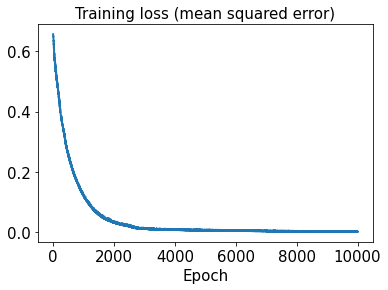

In [22]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

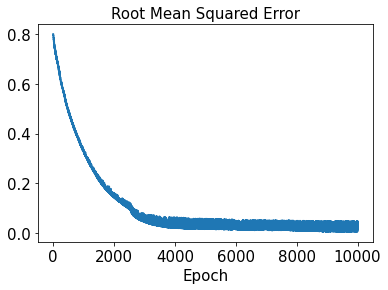

In [23]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [24]:
input_data = tf.keras.Input(shape=(n_sensors, 1))
reshape = tf.keras.layers.Reshape((n_sensors,))(input_data)

x_ = tf.keras.layers.Dense(units=128, activation='relu', name='firstHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='secondHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='thirdHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=101*101, activation=None, name='outputLayer')(x_)
output_img = tf.keras.layers.Reshape((101,101))(output_data)
# Shallow Decoder (SD)
sd1 = tf.keras.Model(input_data, output_img)
sd2 = tf.keras.Model(input_data, output_img)
sd3 = tf.keras.Model(input_data, output_img)

In [25]:
sd1.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 16, 1)]           0         
                                                                 
 reshape_2 (Reshape)         (None, 16)                0         
                                                                 
 firstHiddenLayer (Dense)    (None, 128)               2176      
                                                                 
 batch_normalization_4 (Batc  (None, 128)              512       
 hNormalization)                                                 
                                                                 
 secondHiddenLayer (Dense)   (None, 128)               16512     
                                                                 
 batch_normalization_5 (Batc  (None, 128)              512       
 hNormalization)                                           

In [26]:
sd1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [27]:
start1 = datetime.datetime.now()
history1 = sd1.fit(x_train1, y_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 16ms/step - loss: 0.5293 - rmse: 0.4941
Epoch 2/10000
2/2 [==============================] - 0s 33ms/step - loss: 0.5241 - rmse: 0.4898
Epoch 3/10000
2/2 [==============================] - 0s 24ms/step - loss: 0.5194 - rmse: 0.4860
Epoch 4/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5148 - rmse: 0.4823
Epoch 5/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.5108 - rmse: 0.4792
Epoch 6/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5072 - rmse: 0.4764
Epoch 7/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.5034 - rmse: 0.4735
Epoch 8/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4998 - rmse: 0.4708
Epoch 9/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.4967 - rmse: 0.4685
Epoch 10/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4947 - rmse: 0.4674
Epoch 11/10000
2/2 [====================

2/2 [==============================] - 0s 7ms/step - loss: 0.3976 - rmse: 0.4339
Epoch 87/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3943 - rmse: 0.4310
Epoch 88/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3932 - rmse: 0.4306
Epoch 89/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3924 - rmse: 0.4306
Epoch 90/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3916 - rmse: 0.4306
Epoch 91/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3909 - rmse: 0.4306
Epoch 92/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3898 - rmse: 0.4302
Epoch 93/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3880 - rmse: 0.4290
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3867 - rmse: 0.4283
Epoch 95/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3866 - rmse: 0.4291
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 8ms/step - loss: 0.2847 - rmse: 0.3615
Epoch 171/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2826 - rmse: 0.3594
Epoch 172/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2800 - rmse: 0.3565
Epoch 173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2789 - rmse: 0.3557
Epoch 174/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2779 - rmse: 0.3551
Epoch 175/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2754 - rmse: 0.3523
Epoch 176/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2735 - rmse: 0.3503
Epoch 177/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2726 - rmse: 0.3498
Epoch 178/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2698 - rmse: 0.3466
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2682 - rmse: 0.3450
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.1537 - rmse: 0.1967
Epoch 255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1531 - rmse: 0.1960
Epoch 256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1515 - rmse: 0.1931
Epoch 257/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1504 - rmse: 0.1910
Epoch 258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1499 - rmse: 0.1907
Epoch 259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1485 - rmse: 0.1880
Epoch 260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1470 - rmse: 0.1851
Epoch 261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1468 - rmse: 0.1857
Epoch 262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1451 - rmse: 0.1821
Epoch 263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1445 - rmse: 0.1814
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0938 - rmse: 0.0811
Epoch 339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0933 - rmse: 0.0796
Epoch 340/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0943 - rmse: 0.0872
Epoch 341/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0942 - rmse: 0.0882
Epoch 342/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0920 - rmse: 0.0770
Epoch 343/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0933 - rmse: 0.0865
Epoch 344/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0922 - rmse: 0.0815
Epoch 345/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0911 - rmse: 0.0763
Epoch 346/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0903 - rmse: 0.0731
Epoch 347/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0918 - rmse: 0.0843
Epoch 348/10000
2/2 [==================

2/2 [==============================] - 0s 8ms/step - loss: 0.0692 - rmse: 0.0457
Epoch 423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0682 - rmse: 0.0360
Epoch 424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0685 - rmse: 0.0424
Epoch 425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0679 - rmse: 0.0379
Epoch 426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0683 - rmse: 0.0446
Epoch 427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0671 - rmse: 0.0328
Epoch 428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0675 - rmse: 0.0408
Epoch 429/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0671 - rmse: 0.0377
Epoch 430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0672 - rmse: 0.0412
Epoch 431/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0663 - rmse: 0.0323
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0526 - rmse: 0.0230
Epoch 507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0533 - rmse: 0.0369
Epoch 508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0524 - rmse: 0.0241
Epoch 509/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0530 - rmse: 0.0373
Epoch 510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0521 - rmse: 0.0251
Epoch 511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0522 - rmse: 0.0292
Epoch 512/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0518 - rmse: 0.0250
Epoch 513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0523 - rmse: 0.0355
Epoch 514/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0523 - rmse: 0.0375
Epoch 515/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0531 - rmse: 0.0485
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0418 - rmse: 0.0230
Epoch 591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0422 - rmse: 0.0318
Epoch 592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0415 - rmse: 0.0214
Epoch 593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0420 - rmse: 0.0325
Epoch 594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0430 - rmse: 0.0468
Epoch 595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0410 - rmse: 0.0172
Epoch 596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0414 - rmse: 0.0276
Epoch 597/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0408 - rmse: 0.0178
Epoch 598/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0415 - rmse: 0.0331
Epoch 599/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0405 - rmse: 0.0141
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0344 - rmse: 0.0331
Epoch 675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0339 - rmse: 0.0262
Epoch 676/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0340 - rmse: 0.0289
Epoch 677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0341 - rmse: 0.0329
Epoch 678/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0332 - rmse: 0.0142
Epoch 679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0333 - rmse: 0.0195
Epoch 680/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0338 - rmse: 0.0315
Epoch 681/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0342 - rmse: 0.0385
Epoch 682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0335 - rmse: 0.0288
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0334 - rmse: 0.0294
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0275 - rmse: 0.0111
Epoch 759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0287 - rmse: 0.0382
Epoch 760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0287 - rmse: 0.0380
Epoch 761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0293 - rmse: 0.0462
Epoch 762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0278 - rmse: 0.0266
Epoch 763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0275 - rmse: 0.0222
Epoch 764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0276 - rmse: 0.0251
Epoch 765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0271 - rmse: 0.0121
Epoch 766/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0270 - rmse: 0.0135
Epoch 767/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0277 - rmse: 0.0295
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0232 - rmse: 0.0199
Epoch 843/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0231 - rmse: 0.0185
Epoch 844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0231 - rmse: 0.0208
Epoch 845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0230 - rmse: 0.0188
Epoch 846/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0236 - rmse: 0.0312
Epoch 847/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0226 - rmse: 0.0079
Epoch 848/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0242 - rmse: 0.0408
Epoch 849/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0230 - rmse: 0.0238
Epoch 850/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0235 - rmse: 0.0333
Epoch 851/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0228 - rmse: 0.0207
Epoch 852/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0200 - rmse: 0.0261
Epoch 927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0195 - rmse: 0.0144
Epoch 928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0202 - rmse: 0.0303
Epoch 929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0208 - rmse: 0.0396
Epoch 930/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0193 - rmse: 0.0098
Epoch 931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0192 - rmse: 0.0099
Epoch 932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0199 - rmse: 0.0285
Epoch 933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0206 - rmse: 0.0397
Epoch 934/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0196 - rmse: 0.0231
Epoch 935/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0191 - rmse: 0.0082
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.0174 - rmse: 0.0283
Epoch 1011/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0170 - rmse: 0.0217
Epoch 1012/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0184 - rmse: 0.0437
Epoch 1013/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0175 - rmse: 0.0310
Epoch 1014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0168 - rmse: 0.0188
Epoch 1015/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0166 - rmse: 0.0109
Epoch 1016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0170 - rmse: 0.0253
Epoch 1017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0171 - rmse: 0.0261
Epoch 1018/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0174 - rmse: 0.0316
Epoch 1019/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0167 - rmse: 0.0188
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0154 - rmse: 0.0319
Epoch 1094/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0145 - rmse: 0.0116
Epoch 1095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0150 - rmse: 0.0257
Epoch 1096/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0144 - rmse: 0.0090
Epoch 1097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0144 - rmse: 0.0104
Epoch 1098/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0151 - rmse: 0.0285
Epoch 1099/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0149 - rmse: 0.0259
Epoch 1100/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0153 - rmse: 0.0319
Epoch 1101/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0145 - rmse: 0.0161
Epoch 1102/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0147 - rmse: 0.0235
Epoch 1103/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0134 - rmse: 0.0286
Epoch 1177/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0127 - rmse: 0.0118
Epoch 1178/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0126 - rmse: 0.0050
Epoch 1179/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0129 - rmse: 0.0194
Epoch 1180/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0133 - rmse: 0.0275
Epoch 1181/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0130 - rmse: 0.0221
Epoch 1182/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0134 - rmse: 0.0303
Epoch 1183/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0129 - rmse: 0.0217
Epoch 1184/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0125 - rmse: 0.0102
Epoch 1185/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0125 - rmse: 0.0083
Epoch 1186/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0116 - rmse: 0.0233
Epoch 1260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0116 - rmse: 0.0230
Epoch 1261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0111 - rmse: 0.0089
Epoch 1262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0111 - rmse: 0.0075
Epoch 1263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0114 - rmse: 0.0204
Epoch 1264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0111 - rmse: 0.0111
Epoch 1265/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0110 - rmse: 0.0069
Epoch 1266/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0110 - rmse: 0.0089
Epoch 1267/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0110 - rmse: 0.0079
Epoch 1268/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0110 - rmse: 0.0080
Epoch 1269/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0102 - rmse: 0.0210
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0105 - rmse: 0.0270
Epoch 1344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0098 - rmse: 0.0064
Epoch 1345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.0184
Epoch 1346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0098 - rmse: 0.0084
Epoch 1347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0098 - rmse: 0.0115
Epoch 1348/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0107 - rmse: 0.0312
Epoch 1349/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0102 - rmse: 0.0235
Epoch 1350/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0103 - rmse: 0.0251
Epoch 1351/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0107 - rmse: 0.0328
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0194
Epoch 1426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0321
Epoch 1427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0092 - rmse: 0.0247
Epoch 1428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0088 - rmse: 0.0141
Epoch 1429/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0088 - rmse: 0.0150
Epoch 1430/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0326
Epoch 1431/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0281
Epoch 1432/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0332
Epoch 1433/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0161
Epoch 1434/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0127
Epoch 1435/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0119
Epoch 1509/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0267
Epoch 1510/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0120
Epoch 1511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0176
Epoch 1512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0290
Epoch 1513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0106
Epoch 1514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0113
Epoch 1515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0288
Epoch 1516/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0213
Epoch 1517/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0187
Epoch 1518/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0433
Epoch 1592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0328
Epoch 1593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0234
Epoch 1594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0161
Epoch 1595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0171
Epoch 1596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0163
Epoch 1597/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0217
Epoch 1598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0224
Epoch 1599/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0323
Epoch 1600/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0075 - rmse: 0.0294
Epoch 1601/10000
2/2 [==============

2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0429
Epoch 1675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0180
Epoch 1676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0312
Epoch 1677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0314
Epoch 1678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0122
Epoch 1679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0289
Epoch 1680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0115
Epoch 1681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0342
Epoch 1682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0308
Epoch 1683/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0329
Epoch 1684/10000
2/2 [==============

2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0114
Epoch 1758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0215
Epoch 1759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0233
Epoch 1760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0470
Epoch 1761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0471
Epoch 1762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0443
Epoch 1763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0422
Epoch 1764/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0265
Epoch 1765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0278
Epoch 1766/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0319
Epoch 1767/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0444
Epoch 1841/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0234
Epoch 1842/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0335
Epoch 1843/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0384
Epoch 1844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0414
Epoch 1845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0301
Epoch 1846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0169
Epoch 1847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0339
Epoch 1848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0328
Epoch 1849/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0248
Epoch 1850/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0111
Epoch 1924/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0136
Epoch 1925/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0166
Epoch 1926/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0319
Epoch 1927/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0245
Epoch 1928/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0354
Epoch 1929/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0065 - rmse: 0.0482
Epoch 1930/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0045 - rmse: 0.0191
Epoch 1931/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.0045 - rmse: 0.0189
Epoch 1932/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0157
Epoch 1933/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0456
Epoch 2007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0134
Epoch 2008/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0269
Epoch 2009/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0129
Epoch 2010/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0210
Epoch 2011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0307
Epoch 2012/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0327
Epoch 2013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0439
Epoch 2014/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0407
Epoch 2015/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0118
Epoch 2016/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.0034 - rmse: 0.0099
Epoch 2090/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0266
Epoch 2091/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0034 - rmse: 0.0128
Epoch 2092/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0221
Epoch 2093/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0322
Epoch 2094/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0320
Epoch 2095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0083
Epoch 2096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0177
Epoch 2097/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0150
Epoch 2098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0311
Epoch 2099/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0303
Epoch 2173/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0103
Epoch 2174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0223
Epoch 2175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0315
Epoch 2176/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0154
Epoch 2177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0415
Epoch 2178/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.0038 - rmse: 0.0297
Epoch 2179/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0040 - rmse: 0.0332
Epoch 2180/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0095
Epoch 2181/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0122
Epoch 2182/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0237
Epoch 2256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0311
Epoch 2257/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0327
Epoch 2258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0376
Epoch 2259/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0039 - rmse: 0.0373
Epoch 2260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0291
Epoch 2261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0419
Epoch 2262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0345
Epoch 2263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0251
Epoch 2264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0336
Epoch 2265/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0211
Epoch 2339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0223
Epoch 2340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0175
Epoch 2341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0325
Epoch 2342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0168
Epoch 2343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0106
Epoch 2344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0190
Epoch 2345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0272
Epoch 2346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0380
Epoch 2347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0278
Epoch 2348/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0280
Epoch 2422/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0216
Epoch 2423/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0067
Epoch 2424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0257
Epoch 2425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0364
Epoch 2426/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0283
Epoch 2427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0279
Epoch 2428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0144
Epoch 2429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0240
Epoch 2430/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0184
Epoch 2431/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0214
Epoch 2505/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0119
Epoch 2506/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0124
Epoch 2507/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0177
Epoch 2508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0445
Epoch 2509/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0347
Epoch 2510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0387
Epoch 2511/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0234
Epoch 2512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0333
Epoch 2513/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0234
Epoch 2514/10000
2/2 [==============

2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0312
Epoch 2588/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0311
Epoch 2589/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0108
Epoch 2590/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0095
Epoch 2591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0185
Epoch 2592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0200
Epoch 2593/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0316
Epoch 2594/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0112
Epoch 2595/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0127
Epoch 2596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0178
Epoch 2597/10000
2/2 [===========

2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0331
Epoch 2671/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0235
Epoch 2672/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0143
Epoch 2673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0344
Epoch 2674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0278
Epoch 2675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0212
Epoch 2676/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0164
Epoch 2677/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0195
Epoch 2678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0178
Epoch 2679/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0332
Epoch 2680/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0217
Epoch 2754/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0291
Epoch 2755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0233
Epoch 2756/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0236
Epoch 2757/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0474
Epoch 2758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0266
Epoch 2759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0214
Epoch 2760/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0207
Epoch 2761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0184
Epoch 2762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0339
Epoch 2763/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0247
Epoch 2837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0207
Epoch 2838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0089
Epoch 2839/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0234
Epoch 2840/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0107
Epoch 2841/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0278
Epoch 2842/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0329
Epoch 2843/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0183
Epoch 2844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0285
Epoch 2845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0085
Epoch 2846/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0249
Epoch 2920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0327
Epoch 2921/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0162
Epoch 2922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0197
Epoch 2923/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0322
Epoch 2924/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.8845e-04 - rmse: 0.0090
Epoch 2925/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0309
Epoch 2926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0267
Epoch 2927/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0227
Epoch 2928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0134
Epoch 2929/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0254
Epoch 3003/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.8991e-04 - rmse: 0.0137
Epoch 3004/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0155
Epoch 3005/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0178
Epoch 3006/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0319
Epoch 3007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0198
Epoch 3008/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0337
Epoch 3009/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0303
Epoch 3010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0295
Epoch 3011/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4139e-04 - rmse: 0.0071
Epoch 3012/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0400
Epoch 3085/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0279
Epoch 3086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0276
Epoch 3087/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0238
Epoch 3088/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0407
Epoch 3089/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0268
Epoch 3090/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7860e-04 - rmse: 0.0134
Epoch 3091/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0427
Epoch 3092/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0470
Epoch 3093/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0239
Epoch 3094/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 8.1021e-04 - rmse: 0.0137
Epoch 3167/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7155e-04 - rmse: 0.0123
Epoch 3168/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0466
Epoch 3169/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0239
Epoch 3170/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.7953e-04 - rmse: 0.0190
Epoch 3171/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0464
Epoch 3172/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0249
Epoch 3173/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0293
Epoch 3174/10000
2/2 [==============================] - 0s 18ms/step - loss: 7.0400e-04 - rmse: 0.0095
Epoch 3175/10000
2/2 [==============================] - 0s 18ms/step - loss: 7.7098e-04 - rmse: 0.0126
Epoch 3176/10

2/2 [==============================] - 0s 7ms/step - loss: 7.0009e-04 - rmse: 0.0123
Epoch 3249/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0257
Epoch 3250/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5195e-04 - rmse: 0.0175
Epoch 3251/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9523e-04 - rmse: 0.0187
Epoch 3252/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0307
Epoch 3253/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6921e-04 - rmse: 0.0112
Epoch 3254/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8821e-04 - rmse: 0.0066
Epoch 3255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0311
Epoch 3256/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9734e-04 - rmse: 0.0124
Epoch 3257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0276
Epoch 3258/10

2/2 [==============================] - 0s 7ms/step - loss: 8.7078e-04 - rmse: 0.0196
Epoch 3331/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3369e-04 - rmse: 0.0069
Epoch 3332/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9966e-04 - rmse: 0.0177
Epoch 3333/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0301
Epoch 3334/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3792e-04 - rmse: 0.0074
Epoch 3335/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0260
Epoch 3336/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0284
Epoch 3337/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0287
Epoch 3338/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0251
Epoch 3339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0404
Epoch 3340/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 5.1194e-04 - rmse: 0.0090
Epoch 3413/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0436e-04 - rmse: 0.0218
Epoch 3414/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0456
Epoch 3415/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0958e-04 - rmse: 0.0090
Epoch 3416/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6916e-04 - rmse: 0.0210
Epoch 3417/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0394
Epoch 3418/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.0756e-04 - rmse: 0.0090
Epoch 3419/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7756e-04 - rmse: 0.0158
Epoch 3420/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7203e-04 - rmse: 0.0211
Epoch 3421/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6339e-04 - rmse: 0.0118
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 5.1954e-04 - rmse: 0.0116
Epoch 3494/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0462
Epoch 3495/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3343e-04 - rmse: 0.0187
Epoch 3496/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.4908e-04 - rmse: 0.0191
Epoch 3497/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0413
Epoch 3498/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1305e-04 - rmse: 0.0208
Epoch 3499/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0275
Epoch 3500/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0392e-04 - rmse: 0.0111
Epoch 3501/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0749e-04 - rmse: 0.0151
Epoch 3502/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0257
Epoch 3503/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0322
Epoch 3575/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.9216e-04 - rmse: 0.0212
Epoch 3576/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0368
Epoch 3577/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1090e-04 - rmse: 0.0216
Epoch 3578/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0259
Epoch 3579/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0371
Epoch 3580/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.4519e-04 - rmse: 0.0143
Epoch 3581/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6403e-04 - rmse: 0.0111
Epoch 3582/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1405e-04 - rmse: 0.0086
Epoch 3583/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0285
Epoch 3584/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0362
Epoch 3656/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.8997e-04 - rmse: 0.0261
Epoch 3657/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0337
Epoch 3658/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8906e-04 - rmse: 0.0241
Epoch 3659/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0340
Epoch 3660/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0354
Epoch 3661/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0012 - rmse: 0.0307
Epoch 3662/10000
2/2 [==============================] - 0s 19ms/step - loss: 9.7326e-04 - rmse: 0.0258
Epoch 3663/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0513
Epoch 3664/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0347
Epoch 3665/10000
2/

2/2 [==============================] - 0s 7ms/step - loss: 3.6499e-04 - rmse: 0.0093
Epoch 3737/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8210e-04 - rmse: 0.0102
Epoch 3738/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0394
Epoch 3739/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0309
Epoch 3740/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4297e-04 - rmse: 0.0081
Epoch 3741/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0287
Epoch 3742/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0285
Epoch 3743/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0368
Epoch 3744/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2778e-04 - rmse: 0.0073
Epoch 3745/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0462
Epoch 3746/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 2.7733e-04 - rmse: 0.0051
Epoch 3818/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0370
Epoch 3819/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0336
Epoch 3820/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3460e-04 - rmse: 0.0262
Epoch 3821/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8891e-04 - rmse: 0.0184
Epoch 3822/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9107e-04 - rmse: 0.0210
Epoch 3823/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0306
Epoch 3824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0455
Epoch 3825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0379
Epoch 3826/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0306
Epoch 3827/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 9.8219e-04 - rmse: 0.0275
Epoch 3899/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.0625e-04 - rmse: 0.0089
Epoch 3900/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.5946e-04 - rmse: 0.0231
Epoch 3901/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0403
Epoch 3902/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.5253e-04 - rmse: 0.0112
Epoch 3903/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0464
Epoch 3904/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.5920e-04 - rmse: 0.0115
Epoch 3905/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0325
Epoch 3906/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8423e-04 - rmse: 0.0077
Epoch 3907/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0314
Epoch

2/2 [==============================] - 0s 9ms/step - loss: 4.8511e-04 - rmse: 0.0167
Epoch 3980/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5358e-04 - rmse: 0.0254
Epoch 3981/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9835e-04 - rmse: 0.0171
Epoch 3982/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0399
Epoch 3983/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7141e-04 - rmse: 0.0238
Epoch 3984/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0432
Epoch 3985/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1925e-04 - rmse: 0.0248
Epoch 3986/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6173e-04 - rmse: 0.0256
Epoch 3987/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8403e-04 - rmse: 0.0134
Epoch 3988/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2360e-04 - rmse: 0.0043
Epoch

2/2 [==============================] - 0s 9ms/step - loss: 2.2728e-04 - rmse: 0.0062
Epoch 4061/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.7175e-04 - rmse: 0.0242
Epoch 4062/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0321
Epoch 4063/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.1754e-04 - rmse: 0.0182
Epoch 4064/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7776e-04 - rmse: 0.0095
Epoch 4065/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8975e-04 - rmse: 0.0142
Epoch 4066/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2498e-04 - rmse: 0.0117
Epoch 4067/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1829e-04 - rmse: 0.0182
Epoch 4068/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.6904e-04 - rmse: 0.0241
Epoch 4069/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.9572e-04 - rmse: 0.0284
E

2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0323
Epoch 4142/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.5767e-04 - rmse: 0.0093
Epoch 4143/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9819e-04 - rmse: 0.0250
Epoch 4144/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8669e-04 - rmse: 0.0147
Epoch 4145/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.7882e-04 - rmse: 0.0103
Epoch 4146/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.6862e-04 - rmse: 0.0099
Epoch 4147/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0321
Epoch 4148/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.7497e-04 - rmse: 0.0265
Epoch 4149/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3550e-04 - rmse: 0.0258
Epoch 4150/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8700e-04 - rmse: 0.0

2/2 [==============================] - 0s 7ms/step - loss: 9.2491e-04 - rmse: 0.0277
Epoch 4223/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4925e-04 - rmse: 0.0171
Epoch 4224/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0584e-04 - rmse: 0.0158
Epoch 4225/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0291
Epoch 4226/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.3254e-04 - rmse: 0.0260
Epoch 4227/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0720e-04 - rmse: 0.0235
Epoch 4228/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4827e-04 - rmse: 0.0263
Epoch 4229/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3435e-04 - rmse: 0.0260
Epoch 4230/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0489
Epoch 4231/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0308
Epoch 423

2/2 [==============================] - 0s 9ms/step - loss: 5.8283e-04 - rmse: 0.0209
Epoch 4304/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.4251e-04 - rmse: 0.0173
Epoch 4305/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0475
Epoch 4306/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0333
Epoch 4307/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.6109e-04 - rmse: 0.0147
Epoch 4308/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.2920e-04 - rmse: 0.0220
Epoch 4309/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1965e-04 - rmse: 0.0166
Epoch 4310/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5366e-04 - rmse: 0.0203
Epoch 4311/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.2183e-04 - rmse: 0.0219
Epoch 4312/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0025e-04 - rmse: 0.0125
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 5.5887e-04 - rmse: 0.0206
Epoch 4385/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0310
Epoch 4386/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.3595e-04 - rmse: 0.0265
Epoch 4387/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.1982e-04 - rmse: 0.0281
Epoch 4388/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3013e-04 - rmse: 0.0141
Epoch 4389/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7162e-04 - rmse: 0.0253
Epoch 4390/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6498e-04 - rmse: 0.0115
Epoch 4391/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3947e-04 - rmse: 0.0175
Epoch 4392/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4911e-04 - rmse: 0.0227
Epoch 4393/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0665e-04 - rmse: 0.0278
E

2/2 [==============================] - 0s 8ms/step - loss: 4.6044e-04 - rmse: 0.0184
Epoch 4465/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0300
Epoch 4466/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0358
Epoch 4467/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0428
Epoch 4468/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0438e-04 - rmse: 0.0242
Epoch 4469/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0330
Epoch 4470/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.3686e-04 - rmse: 0.0248
Epoch 4471/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0358
Epoch 4472/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0441
Epoch 4473/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7324e-04 - rmse: 0.0188
Epoch 4474/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 8.5948e-04 - rmse: 0.0273
Epoch 4546/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7822e-04 - rmse: 0.0191
Epoch 4547/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 4548/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5788e-04 - rmse: 0.0273
Epoch 4549/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9907e-04 - rmse: 0.0262
Epoch 4550/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9919e-04 - rmse: 0.0197
Epoch 4551/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2968e-04 - rmse: 0.0148
Epoch 4552/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8123e-04 - rmse: 0.0239
Epoch 4553/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1082e-04 - rmse: 0.0100
Epoch 4554/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8260e-04 - rmse: 0.0278
E

2/2 [==============================] - 0s 7ms/step - loss: 1.9153e-04 - rmse: 0.0094
Epoch 4627/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3425e-04 - rmse: 0.0182
Epoch 4628/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0315
Epoch 4629/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5515e-04 - rmse: 0.0235
Epoch 4630/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5473e-04 - rmse: 0.0292
Epoch 4631/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.6354e-04 - rmse: 0.0162
Epoch 4632/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0256e-04 - rmse: 0.0100
Epoch 4633/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5590e-04 - rmse: 0.0124
Epoch 4634/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0314
Epoch 4635/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9157e-04 - rmse: 0.0095
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0319
Epoch 4708/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.3686e-04 - rmse: 0.0273
Epoch 4709/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5806e-04 - rmse: 0.0080
Epoch 4710/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0456
Epoch 4711/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.4670e-04 - rmse: 0.0274
Epoch 4712/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5321e-04 - rmse: 0.0276
Epoch 4713/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5684e-04 - rmse: 0.0215
Epoch 4714/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.4503e-04 - rmse: 0.0072
Epoch 4715/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2477e-04 - rmse: 0.0115
Epoch 4716/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4914e-04 - rmse: 0.0275
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 5.1573e-04 - rmse: 0.0207
Epoch 4789/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0461
Epoch 4790/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0460
Epoch 4791/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.1996e-04 - rmse: 0.0116
Epoch 4792/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4568e-04 - rmse: 0.0237
Epoch 4793/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.2737e-04 - rmse: 0.0272
Epoch 4794/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1378e-04 - rmse: 0.0288
Epoch 4795/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0466
Epoch 4796/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0826e-04 - rmse: 0.0269
Epoch 4797/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4551e-04 - rmse: 0.0078
Epoch 479

2/2 [==============================] - 0s 7ms/step - loss: 6.7486e-04 - rmse: 0.0244
Epoch 4870/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3733e-04 - rmse: 0.0126
Epoch 4871/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7850e-04 - rmse: 0.0245
Epoch 4872/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5271e-04 - rmse: 0.0260
Epoch 4873/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1159e-04 - rmse: 0.0153
Epoch 4874/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 4875/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9525e-04 - rmse: 0.0248
Epoch 4876/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2954e-04 - rmse: 0.0255
Epoch 4877/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8899e-04 - rmse: 0.0267
Epoch 4878/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9406e-04 - rmse: 0.0178
E

2/2 [==============================] - 0s 8ms/step - loss: 1.6415e-04 - rmse: 0.0096
Epoch 4951/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5226e-04 - rmse: 0.0090
Epoch 4952/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6152e-04 - rmse: 0.0095
Epoch 4953/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3065e-04 - rmse: 0.0126
Epoch 4954/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.1246e-04 - rmse: 0.0290
Epoch 4955/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.0353e-04 - rmse: 0.0182
Epoch 4956/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4159e-04 - rmse: 0.0217
Epoch 4957/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7989e-04 - rmse: 0.0202
Epoch 4958/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0313
Epoch 4959/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8595e-04 - rmse: 0.0227
E

2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0307
Epoch 5032/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4111e-04 - rmse: 0.0087
Epoch 5033/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9812e-04 - rmse: 0.0182
Epoch 5034/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7711e-04 - rmse: 0.0106
Epoch 5035/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 5036/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1210e-04 - rmse: 0.0068
Epoch 5037/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6979e-04 - rmse: 0.0246
Epoch 5038/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1191e-04 - rmse: 0.0254
Epoch 5039/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.1639e-04 - rmse: 0.0255
Epoch 5040/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.0872e-04 - rmse: 0.0254
Epo

2/2 [==============================] - 0s 9ms/step - loss: 9.2811e-04 - rmse: 0.0295
Epoch 5113/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2404e-04 - rmse: 0.0080
Epoch 5114/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3687e-04 - rmse: 0.0088
Epoch 5115/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.5410e-04 - rmse: 0.0299
Epoch 5116/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8521e-04 - rmse: 0.0250
Epoch 5117/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9484e-04 - rmse: 0.0116
Epoch 5118/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0736e-04 - rmse: 0.0254
Epoch 5119/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4372e-04 - rmse: 0.0280
Epoch 5120/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3491e-04 - rmse: 0.0240
Epoch 5121/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8316e-04 - rmse: 0.02

2/2 [==============================] - 0s 9ms/step - loss: 7.6016e-04 - rmse: 0.0266
Epoch 5194/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4116e-04 - rmse: 0.0137
Epoch 5195/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6788e-04 - rmse: 0.0107
Epoch 5196/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6488e-04 - rmse: 0.0247
Epoch 5197/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 5198/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1041e-04 - rmse: 0.0125
Epoch 5199/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1218e-04 - rmse: 0.0236
Epoch 5200/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.7548e-04 - rmse: 0.0179
Epoch 5201/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4062e-04 - rmse: 0.0137
Epoch 5202/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2010e-04 - rmse: 0.0129
E

2/2 [==============================] - 0s 13ms/step - loss: 5.4825e-04 - rmse: 0.0223
Epoch 5275/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 5276/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 5277/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.6115e-04 - rmse: 0.0177
Epoch 5278/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 5279/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 5280/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.8570e-04 - rmse: 0.0232
Epoch 5281/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8777e-04 - rmse: 0.0209
Epoch 5282/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 5283/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0311
Epoch 5284/10000


2/2 [==============================] - 0s 8ms/step - loss: 4.8667e-04 - rmse: 0.0210
Epoch 5356/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0317
Epoch 5357/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2744e-04 - rmse: 0.0220
Epoch 5358/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3389e-04 - rmse: 0.0137
Epoch 5359/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3331e-04 - rmse: 0.0094
Epoch 5360/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8758e-04 - rmse: 0.0156
Epoch 5361/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4401e-04 - rmse: 0.0283
Epoch 5362/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2211e-04 - rmse: 0.0088
Epoch 5363/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3169e-04 - rmse: 0.0242
Epoch 5364/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6662e-04 - rmse: 0.0110
E

2/2 [==============================] - 0s 8ms/step - loss: 3.4712e-04 - rmse: 0.0175
Epoch 5437/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6658e-04 - rmse: 0.0287
Epoch 5438/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.6739e-04 - rmse: 0.0270
Epoch 5439/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5705e-04 - rmse: 0.0204
Epoch 5440/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.5510e-04 - rmse: 0.0227
Epoch 5441/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4222e-04 - rmse: 0.0245
Epoch 5442/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0723e-04 - rmse: 0.0129
Epoch 5443/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0426e-04 - rmse: 0.0080
Epoch 5444/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1517e-04 - rmse: 0.0194
Epoch 5445/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.0754e-04 - rmse: 0.02

2/2 [==============================] - 0s 8ms/step - loss: 3.1041e-04 - rmse: 0.0165
Epoch 5518/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4450e-04 - rmse: 0.0144
Epoch 5519/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7733e-04 - rmse: 0.0155
Epoch 5520/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2207e-04 - rmse: 0.0196
Epoch 5521/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3254e-04 - rmse: 0.0299
Epoch 5522/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.7052e-05 - rmse: 0.0078
Epoch 5523/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7148e-04 - rmse: 0.0208
Epoch 5524/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 5525/10000
2/2 [==============================] - 0s 18ms/step - loss: 1.2559e-04 - rmse: 0.0094
Epoch 5526/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.3788e-04 - rmse: 0.0245

2/2 [==============================] - 0s 7ms/step - loss: 7.9186e-04 - rmse: 0.0275
Epoch 5598/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3569e-04 - rmse: 0.0224
Epoch 5599/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1472e-04 - rmse: 0.0280
Epoch 5600/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4838e-04 - rmse: 0.0177
Epoch 5601/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8871e-04 - rmse: 0.0125
Epoch 5602/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.2299e-04 - rmse: 0.0138
Epoch 5603/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 5604/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8381e-04 - rmse: 0.0123
Epoch 5605/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 5606/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 560

2/2 [==============================] - 0s 8ms/step - loss: 8.5999e-04 - rmse: 0.0288
Epoch 5679/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5148e-04 - rmse: 0.0110
Epoch 5680/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1994e-04 - rmse: 0.0095
Epoch 5681/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9251e-04 - rmse: 0.0190
Epoch 5682/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1384e-04 - rmse: 0.0297
Epoch 5683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0404
Epoch 5684/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2420e-04 - rmse: 0.0222
Epoch 5685/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4644e-04 - rmse: 0.0108
Epoch 5686/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0765e-05 - rmse: 0.0078
Epoch 5687/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4357e-04 - rmse: 0.0285
E

2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 5759/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7607e-04 - rmse: 0.0122
Epoch 5760/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4656e-04 - rmse: 0.0286
Epoch 5761/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 5762/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.8162e-04 - rmse: 0.0292
Epoch 5763/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6938e-05 - rmse: 0.0055
Epoch 5764/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0663e-04 - rmse: 0.0195
Epoch 5765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 5766/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 5767/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5874e-04 - rmse: 0.0288
Epoch 5768/10

2/2 [==============================] - 0s 8ms/step - loss: 2.4881e-04 - rmse: 0.0150
Epoch 5839/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1850e-04 - rmse: 0.0244
Epoch 5840/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0537e-04 - rmse: 0.0090
Epoch 5841/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6648e-05 - rmse: 0.0057
Epoch 5842/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.3746e-05 - rmse: 0.0070
Epoch 5843/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8768e-04 - rmse: 0.0258
Epoch 5844/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8704e-04 - rmse: 0.0215
Epoch 5845/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7995e-04 - rmse: 0.0213
Epoch 5846/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.3574e-04 - rmse: 0.0247
Epoch 5847/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2140e-04 - rmse: 0.01

2/2 [==============================] - 0s 7ms/step - loss: 4.9872e-05 - rmse: 0.0053
Epoch 5919/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4429e-04 - rmse: 0.0180
Epoch 5920/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8210e-04 - rmse: 0.0293
Epoch 5921/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3685e-04 - rmse: 0.0267
Epoch 5922/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7725e-04 - rmse: 0.0292
Epoch 5923/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5269e-04 - rmse: 0.0251
Epoch 5924/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4880e-04 - rmse: 0.0250
Epoch 5925/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1527e-04 - rmse: 0.0263
Epoch 5926/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3592e-04 - rmse: 0.0146
Epoch 5927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0455
E

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6000/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1946e-04 - rmse: 0.0141
Epoch 6001/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4220e-05 - rmse: 0.0049
Epoch 6002/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0326e-04 - rmse: 0.0280
Epoch 6003/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5917e-04 - rmse: 0.0307
Epoch 6004/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5916e-04 - rmse: 0.0210
Epoch 6005/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9751e-04 - rmse: 0.0279
Epoch 6006/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0568e-04 - rmse: 0.0196
Epoch 6007/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4640e-04 - rmse: 0.0304
Epoch 6008/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 7.5583e-04 - rmse: 0.0272
Epoch 6080/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4452e-04 - rmse: 0.0181
Epoch 6081/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0546e-04 - rmse: 0.0170
Epoch 6082/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9678e-04 - rmse: 0.0219
Epoch 6083/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1972e-04 - rmse: 0.0101
Epoch 6084/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3063e-04 - rmse: 0.0203
Epoch 6085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 6086/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4465e-04 - rmse: 0.0181
Epoch 6087/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8382e-04 - rmse: 0.0238
Epoch 6088/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8981e-04 - rmse: 0.0165
E

2/2 [==============================] - 0s 18ms/step - loss: 9.5025e-04 - rmse: 0.0306
Epoch 6160/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.4934e-04 - rmse: 0.0252
Epoch 6161/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.4886e-04 - rmse: 0.0251
Epoch 6162/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 6163/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.5904e-04 - rmse: 0.0156
Epoch 6164/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6165/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5400e-04 - rmse: 0.0253
Epoch 6166/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5874e-04 - rmse: 0.0156
Epoch 6167/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3779e-04 - rmse: 0.0287
Epoch 6168/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8426e-04 - rmse: 0.0258

2/2 [==============================] - 0s 7ms/step - loss: 1.2214e-04 - rmse: 0.0103
Epoch 6240/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1728e-04 - rmse: 0.0283
Epoch 6241/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 6242/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0322
Epoch 6243/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 6244/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 6245/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0496e-04 - rmse: 0.0095
Epoch 6246/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 6247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 6248/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0404
Epoch 6249/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 8.0455e-05 - rmse: 0.0081
Epoch 6321/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3635e-05 - rmse: 0.0071
Epoch 6322/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8981e-05 - rmse: 0.0081
Epoch 6323/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8742e-04 - rmse: 0.0132
Epoch 6324/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4840e-04 - rmse: 0.0252
Epoch 6325/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.3132e-05 - rmse: 0.0044
Epoch 6326/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 6327/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 6328/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5927e-04 - rmse: 0.0254
Epoch 6329/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 6

2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 6401/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1693e-04 - rmse: 0.0265
Epoch 6402/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 6403/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9807e-04 - rmse: 0.0242
Epoch 6404/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6671e-05 - rmse: 0.0058
Epoch 6405/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8851e-04 - rmse: 0.0133
Epoch 6406/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.0869e-04 - rmse: 0.0098
Epoch 6407/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 6408/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1783e-04 - rmse: 0.0266
Epoch 6409/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8197e-04 - rmse: 0.0164
Epoch 641

Epoch 6481/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5265e-04 - rmse: 0.0185
Epoch 6482/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2264e-05 - rmse: 0.0071
Epoch 6483/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8084e-04 - rmse: 0.0259
Epoch 6484/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5835e-04 - rmse: 0.0157
Epoch 6485/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9163e-05 - rmse: 0.0093
Epoch 6486/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 6487/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3079e-04 - rmse: 0.0109
Epoch 6488/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 6489/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4260e-04 - rmse: 0.0305
Epoch 6490/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5815e-04 - r

2/2 [==============================] - 0s 9ms/step - loss: 1.7554e-04 - rmse: 0.0128
Epoch 6562/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 6563/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7480e-05 - rmse: 0.0082
Epoch 6564/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3060e-05 - rmse: 0.0057
Epoch 6565/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9555e-05 - rmse: 0.0070
Epoch 6566/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 6567/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.6518e-05 - rmse: 0.0060
Epoch 6568/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1334e-04 - rmse: 0.0283
Epoch 6569/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1852e-04 - rmse: 0.0144
Epoch 6570/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0051e-04 - rmse: 0.0095
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 8.2051e-05 - rmse: 0.0085
Epoch 6643/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5883e-04 - rmse: 0.0158
Epoch 6644/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7635e-04 - rmse: 0.0191
Epoch 6645/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 6646/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 6647/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7777e-04 - rmse: 0.0258
Epoch 6648/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.5859e-04 - rmse: 0.0187
Epoch 6649/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2594e-04 - rmse: 0.0286
Epoch 6650/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2500e-04 - rmse: 0.0285
Epoch 6651/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0126e-04 - rmse: 0.0138
Epoch

Epoch 6723/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1683e-04 - rmse: 0.0202
Epoch 6724/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4949e-05 - rmse: 0.0081
Epoch 6725/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4941e-04 - rmse: 0.0307
Epoch 6726/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8349e-04 - rmse: 0.0165
Epoch 6727/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8092e-04 - rmse: 0.0131
Epoch 6728/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6857e-04 - rmse: 0.0293
Epoch 6729/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4563e-05 - rmse: 0.0074
Epoch 6730/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3279e-05 - rmse: 0.0049
Epoch 6731/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 6732/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5831e-04

2/2 [==============================] - 0s 8ms/step - loss: 1.0475e-04 - rmse: 0.0098
Epoch 6804/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8940e-04 - rmse: 0.0195
Epoch 6805/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3309e-04 - rmse: 0.0304
Epoch 6806/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9014e-04 - rmse: 0.0279
Epoch 6807/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3071e-04 - rmse: 0.0304
Epoch 6808/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8114e-05 - rmse: 0.0063
Epoch 6809/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0783e-04 - rmse: 0.0264
Epoch 6810/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 6811/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7536e-05 - rmse: 0.0053
Epoch 6812/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6755e-04 - rmse: 0.0310
E

2/2 [==============================] - 0s 8ms/step - loss: 2.4920e-05 - rmse: 0.0040
Epoch 6884/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 6885/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2761e-04 - rmse: 0.0205
Epoch 6886/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.1541e-05 - rmse: 0.0073
Epoch 6887/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9918e-04 - rmse: 0.0281
Epoch 6888/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.0489e-04 - rmse: 0.0098
Epoch 6889/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6718e-05 - rmse: 0.0094
Epoch 6890/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3112e-04 - rmse: 0.0180
Epoch 6891/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4113e-04 - rmse: 0.0305
Epoch 6892/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9604e-05 - rmse: 0.0033
E

2/2 [==============================] - 0s 8ms/step - loss: 5.9066e-04 - rmse: 0.0241
Epoch 6965/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5125e-05 - rmse: 0.0088
Epoch 6966/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8041e-04 - rmse: 0.0165
Epoch 6967/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3632e-05 - rmse: 0.0039
Epoch 6968/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7812e-04 - rmse: 0.0239
Epoch 6969/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.1982e-04 - rmse: 0.0226
Epoch 6970/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5754e-04 - rmse: 0.0212
Epoch 6971/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7206e-04 - rmse: 0.0258
Epoch 6972/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5187e-05 - rmse: 0.0076
Epoch 6973/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.8269e-04 - rmse: 0.02

2/2 [==============================] - 0s 8ms/step - loss: 6.9993e-04 - rmse: 0.0263
Epoch 7045/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4562e-04 - rmse: 0.0209
Epoch 7046/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2700e-04 - rmse: 0.0148
Epoch 7047/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9410e-04 - rmse: 0.0197
Epoch 7048/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3238e-04 - rmse: 0.0112
Epoch 7049/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3515e-04 - rmse: 0.0230
Epoch 7050/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.5829e-04 - rmse: 0.0274
Epoch 7051/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3032e-04 - rmse: 0.0180
Epoch 7052/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6657e-04 - rmse: 0.0161
Epoch 7053/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5385e-04 - rmse: 0.01

Epoch 7125/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9423e-04 - rmse: 0.0314
Epoch 7126/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2959e-04 - rmse: 0.0269
Epoch 7127/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8129e-04 - rmse: 0.0260
Epoch 7128/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2815e-04 - rmse: 0.0286
Epoch 7129/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1289e-04 - rmse: 0.0246
Epoch 7130/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0404
Epoch 7131/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8114e-04 - rmse: 0.0296
Epoch 7132/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2280e-04 - rmse: 0.0248
Epoch 7133/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 7134/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9746e-04 - r

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 7206/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 7207/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4038e-04 - rmse: 0.0208
Epoch 7208/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4033e-04 - rmse: 0.0208
Epoch 7209/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6269e-04 - rmse: 0.0213
Epoch 7210/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 7211/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9683e-04 - rmse: 0.0281
Epoch 7212/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 7213/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4327e-04 - rmse: 0.0231
Epoch 7214/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 7215/10000


2/2 [==============================] - 0s 8ms/step - loss: 8.8949e-04 - rmse: 0.0297
Epoch 7287/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5371e-04 - rmse: 0.0186
Epoch 7288/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0436e-04 - rmse: 0.0223
Epoch 7289/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9788e-04 - rmse: 0.0281
Epoch 7290/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0889e-04 - rmse: 0.0174
Epoch 7291/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2445e-04 - rmse: 0.0268
Epoch 7292/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8083e-04 - rmse: 0.0240
Epoch 7293/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2492e-05 - rmse: 0.0074
Epoch 7294/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.7917e-04 - rmse: 0.0193
Epoch 7295/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0819e-04 - rmse: 0.03

2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 7367/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.2586e-04 - rmse: 0.0228
Epoch 7368/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7858e-05 - rmse: 0.0071
Epoch 7369/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6260e-04 - rmse: 0.0293
Epoch 7370/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5488e-04 - rmse: 0.0212
Epoch 7371/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2188e-04 - rmse: 0.0267
Epoch 7372/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9173e-05 - rmse: 0.0065
Epoch 7373/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7454e-05 - rmse: 0.0084
Epoch 7374/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1758e-04 - rmse: 0.0203
Epoch 7375/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4472e-04 - rmse: 0.0117
E

2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 7447/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3216e-04 - rmse: 0.0269
Epoch 7448/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.2804e-04 - rmse: 0.0179
Epoch 7449/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0071e-04 - rmse: 0.0097
Epoch 7450/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.2333e-04 - rmse: 0.0227
Epoch 7451/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 7452/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3789e-04 - rmse: 0.0305
Epoch 7453/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8819e-04 - rmse: 0.0280
Epoch 7454/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4627e-04 - rmse: 0.0210
Epoch 7455/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 745

2/2 [==============================] - 0s 7ms/step - loss: 3.8962e-04 - rmse: 0.0196
Epoch 7528/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0292e-05 - rmse: 0.0037
Epoch 7529/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 7530/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2431e-05 - rmse: 0.0068
Epoch 7531/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4049e-05 - rmse: 0.0053
Epoch 7532/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4960e-04 - rmse: 0.0211
Epoch 7533/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2844e-04 - rmse: 0.0179
Epoch 7534/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2139e-04 - rmse: 0.0204
Epoch 7535/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 7536/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5332e-05 - rmse: 0.0083
Epoch

Epoch 7608/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5524e-05 - rmse: 0.0030
Epoch 7609/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4240e-04 - rmse: 0.0154
Epoch 7610/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4460e-04 - rmse: 0.0306
Epoch 7611/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1680e-04 - rmse: 0.0176
Epoch 7612/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0671e-05 - rmse: 0.0021
Epoch 7613/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3669e-04 - rmse: 0.0251
Epoch 7614/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3821e-04 - rmse: 0.0251
Epoch 7615/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0783e-06 - rmse: 0.0013
Epoch 7616/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0631e-04 - rmse: 0.0265
Epoch 7617/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7628

2/2 [==============================] - 0s 11ms/step - loss: 7.6847e-05 - rmse: 0.0084
Epoch 7689/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.7619e-04 - rmse: 0.0217
Epoch 7690/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1504e-04 - rmse: 0.0104
Epoch 7691/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 7692/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0539e-04 - rmse: 0.0173
Epoch 7693/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5375e-04 - rmse: 0.0291
Epoch 7694/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1146e-05 - rmse: 0.0081
Epoch 7695/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9815e-04 - rmse: 0.0315
Epoch 7696/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.6152e-04 - rmse: 0.0236
Epoch 7697/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5500e-04 - rmse: 0.0234

2/2 [==============================] - 0s 7ms/step - loss: 2.5226e-05 - rmse: 0.0044
Epoch 7770/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4524e-04 - rmse: 0.0253
Epoch 7771/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0717e-04 - rmse: 0.0265
Epoch 7772/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6870e-04 - rmse: 0.0162
Epoch 7773/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3096e-05 - rmse: 0.0026
Epoch 7774/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2069e-04 - rmse: 0.0146
Epoch 7775/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8116e-05 - rmse: 0.0065
Epoch 7776/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2987e-04 - rmse: 0.0180
Epoch 7777/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 7778/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0421e-05 - rmse: 0.0049
E

2/2 [==============================] - 0s 8ms/step - loss: 1.9542e-04 - rmse: 0.0138
Epoch 7850/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5345e-04 - rmse: 0.0157
Epoch 7851/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 7852/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3638e-04 - rmse: 0.0305
Epoch 7853/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7730e-04 - rmse: 0.0239
Epoch 7854/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2950e-04 - rmse: 0.0180
Epoch 7855/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8151e-05 - rmse: 0.0072
Epoch 7856/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6927e-05 - rmse: 0.0046
Epoch 7857/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8908e-04 - rmse: 0.0168
Epoch 7858/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2512e-04 - rmse: 0.0268
E

2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 7930/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0958e-04 - rmse: 0.0102
Epoch 7931/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8684e-04 - rmse: 0.0195
Epoch 7932/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7547e-04 - rmse: 0.0164
Epoch 7933/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5515e-04 - rmse: 0.0291
Epoch 7934/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3174e-04 - rmse: 0.0180
Epoch 7935/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5752e-04 - rmse: 0.0159
Epoch 7936/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0159e-04 - rmse: 0.0098
Epoch 7937/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5070e-04 - rmse: 0.0307
Epoch 7938/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.3343e-04 - rmse: 0.0230
E

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 8010/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2162e-04 - rmse: 0.0268
Epoch 8011/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9434e-04 - rmse: 0.0298
Epoch 8012/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6208e-04 - rmse: 0.0236
Epoch 8013/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7853e-04 - rmse: 0.0278
Epoch 8014/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4593e-04 - rmse: 0.0290
Epoch 8015/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6621e-04 - rmse: 0.0293
Epoch 8016/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 8017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 8018/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 8019/10

2/2 [==============================] - 0s 7ms/step - loss: 7.3236e-05 - rmse: 0.0082
Epoch 8091/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2406e-04 - rmse: 0.0178
Epoch 8092/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9235e-04 - rmse: 0.0197
Epoch 8093/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.4133e-04 - rmse: 0.0252
Epoch 8094/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6366e-05 - rmse: 0.0064
Epoch 8095/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8394e-05 - rmse: 0.0091
Epoch 8096/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.8017e-04 - rmse: 0.0166
Epoch 8097/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2659e-05 - rmse: 0.0068
Epoch 8098/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4750e-04 - rmse: 0.0253
Epoch 8099/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5323e-04 - rmse: 0.02

2/2 [==============================] - 0s 13ms/step - loss: 1.2134e-04 - rmse: 0.0108
Epoch 8172/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.6317e-04 - rmse: 0.0126
Epoch 8173/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 8174/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7161e-04 - rmse: 0.0129
Epoch 8175/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0118e-04 - rmse: 0.0264
Epoch 8176/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2503e-05 - rmse: 0.0075
Epoch 8177/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1440e-04 - rmse: 0.0247
Epoch 8178/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.3999e-04 - rmse: 0.0271
Epoch 8179/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5748e-04 - rmse: 0.0255
Epoch 8180/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.4858e-04 - rmse: 0.0254

2/2 [==============================] - 0s 8ms/step - loss: 2.8146e-05 - rmse: 0.0047
Epoch 8252/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.3187e-04 - rmse: 0.0181
Epoch 8253/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.9898e-05 - rmse: 0.0086
Epoch 8254/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3359e-04 - rmse: 0.0151
Epoch 8255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 8256/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8212e-04 - rmse: 0.0240
Epoch 8257/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9873e-04 - rmse: 0.0198
Epoch 8258/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6502e-05 - rmse: 0.0071
Epoch 8259/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.4659e-04 - rmse: 0.0307
Epoch 8260/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4444e-04 - rmse: 0.0209
E

Epoch 8332/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5324e-05 - rmse: 0.0044
Epoch 8333/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2484e-05 - rmse: 0.0069
Epoch 8334/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5970e-05 - rmse: 0.0032
Epoch 8335/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 8336/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3415e-04 - rmse: 0.0230
Epoch 8337/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6283e-04 - rmse: 0.0256
Epoch 8338/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.0680e-04 - rmse: 0.0200
Epoch 8339/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0366e-04 - rmse: 0.0173
Epoch 8340/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4348e-04 - rmse: 0.0272
Epoch 8341/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7219e-04

2/2 [==============================] - 0s 7ms/step - loss: 8.6973e-04 - rmse: 0.0294
Epoch 8413/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0698e-04 - rmse: 0.0101
Epoch 8414/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.2124e-04 - rmse: 0.0227
Epoch 8415/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5939e-04 - rmse: 0.0292
Epoch 8416/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 8417/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8640e-04 - rmse: 0.0241
Epoch 8418/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9508e-04 - rmse: 0.0221
Epoch 8419/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2950e-04 - rmse: 0.0269
Epoch 8420/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8185e-04 - rmse: 0.0296
Epoch 8421/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.5093e-04 - rmse: 0.0121


2/2 [==============================] - 0s 7ms/step - loss: 4.1163e-04 - rmse: 0.0202
Epoch 8494/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7905e-04 - rmse: 0.0278
Epoch 8495/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 8496/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 8497/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.3565e-04 - rmse: 0.0305
Epoch 8498/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.2364e-05 - rmse: 0.0052
Epoch 8499/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3664e-05 - rmse: 0.0043
Epoch 8500/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5824e-04 - rmse: 0.0159
Epoch 8501/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5933e-04 - rmse: 0.0309
Epoch 8502/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1375e-04 - rmse: 0.0284
Epoch

2/2 [==============================] - 0s 9ms/step - loss: 9.8228e-05 - rmse: 0.0096
Epoch 8574/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2008e-04 - rmse: 0.0147
Epoch 8575/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0632e-05 - rmse: 0.0081
Epoch 8576/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2163e-05 - rmse: 0.0052
Epoch 8577/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4487e-05 - rmse: 0.0054
Epoch 8578/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.8767e-04 - rmse: 0.0280
Epoch 8579/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9841e-04 - rmse: 0.0282
Epoch 8580/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2389e-04 - rmse: 0.0268
Epoch 8581/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8995e-04 - rmse: 0.0169
Epoch 8582/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5967e-04 - rmse: 0.02

2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 8654/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3902e-05 - rmse: 0.0076
Epoch 8655/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 8656/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7200e-04 - rmse: 0.0216
Epoch 8657/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.7352e-04 - rmse: 0.0295
Epoch 8658/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1960e-05 - rmse: 0.0052
Epoch 8659/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9635e-04 - rmse: 0.0281
Epoch 8660/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7929e-05 - rmse: 0.0079
Epoch 8661/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2462e-05 - rmse: 0.0093
Epoch 8662/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 866

2/2 [==============================] - 0s 7ms/step - loss: 8.8574e-04 - rmse: 0.0297
Epoch 8734/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8988e-04 - rmse: 0.0136
Epoch 8735/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0954e-04 - rmse: 0.0284
Epoch 8736/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.5001e-04 - rmse: 0.0273
Epoch 8737/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8849e-04 - rmse: 0.0297
Epoch 8738/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8248e-04 - rmse: 0.0133
Epoch 8739/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 8740/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5443e-04 - rmse: 0.0158
Epoch 8741/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4050e-04 - rmse: 0.0209
Epoch 8742/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2031e-04 - rmse: 0.0248
E

Epoch 8814/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7761e-04 - rmse: 0.0259
Epoch 8815/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1827e-04 - rmse: 0.0285
Epoch 8816/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4072e-04 - rmse: 0.0116
Epoch 8817/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8657e-04 - rmse: 0.0297
Epoch 8818/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1217e-04 - rmse: 0.0284
Epoch 8819/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4825e-05 - rmse: 0.0077
Epoch 8820/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2073e-04 - rmse: 0.0107
Epoch 8821/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.5616e-05 - rmse: 0.0095
Epoch 8822/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4554e-05 - rmse: 0.0070
Epoch 8823/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2742

Epoch 8895/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8811e-04 - rmse: 0.0135
Epoch 8896/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.6279e-04 - rmse: 0.0293
Epoch 8897/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5119e-04 - rmse: 0.0291
Epoch 8898/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5094e-05 - rmse: 0.0089
Epoch 8899/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9054e-04 - rmse: 0.0298
Epoch 8900/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0253e-04 - rmse: 0.0282
Epoch 8901/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7765e-04 - rmse: 0.0239
Epoch 8902/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.9285e-04 - rmse: 0.0281
Epoch 8903/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2380e-04 - rmse: 0.0179
Epoch 8904/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8744

2/2 [==============================] - 0s 7ms/step - loss: 1.0487e-04 - rmse: 0.0100
Epoch 8976/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5207e-05 - rmse: 0.0055
Epoch 8977/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2588e-04 - rmse: 0.0228
Epoch 8978/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8981e-04 - rmse: 0.0136
Epoch 8979/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9761e-05 - rmse: 0.0074
Epoch 8980/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3717e-04 - rmse: 0.0152
Epoch 8981/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3621e-04 - rmse: 0.0152
Epoch 8982/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2662e-04 - rmse: 0.0205
Epoch 8983/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5207e-05 - rmse: 0.0095
Epoch 8984/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1762e-05 - rmse: 0.00

2/2 [==============================] - 0s 12ms/step - loss: 9.1979e-04 - rmse: 0.0302
Epoch 9056/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.2945e-04 - rmse: 0.0229
Epoch 9057/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 9058/10000
2/2 [==============================] - 0s 18ms/step - loss: 7.3565e-04 - rmse: 0.0270
Epoch 9059/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.3742e-04 - rmse: 0.0208
Epoch 9060/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 9061/10000
2/2 [==============================] - 0s 18ms/step - loss: 5.4298e-04 - rmse: 0.0232
Epoch 9062/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3609e-04 - rmse: 0.0152
Epoch 9063/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.2693e-04 - rmse: 0.0149
Epoch 9064/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7785e-04 - rmse: 0.013

2/2 [==============================] - 0s 7ms/step - loss: 2.2400e-04 - rmse: 0.0148
Epoch 9137/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6063e-04 - rmse: 0.0160
Epoch 9138/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1919e-04 - rmse: 0.0177
Epoch 9139/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5600e-04 - rmse: 0.0123
Epoch 9140/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 9141/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 9142/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 9143/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2403e-04 - rmse: 0.0268
Epoch 9144/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5826e-04 - rmse: 0.0235
Epoch 9145/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0801e-04 - rmse: 0.0142
Epoch 914

2/2 [==============================] - 0s 8ms/step - loss: 2.4385e-04 - rmse: 0.0155
Epoch 9217/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7325e-04 - rmse: 0.0130
Epoch 9218/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6050e-04 - rmse: 0.0236
Epoch 9219/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5715e-04 - rmse: 0.0213
Epoch 9220/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 9221/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9222/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.6369e-04 - rmse: 0.0236
Epoch 9223/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1888e-04 - rmse: 0.0146
Epoch 9224/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3790e-04 - rmse: 0.0153
Epoch 9225/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3508e-04 - rmse: 0.0182
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 5.1424e-04 - rmse: 0.0226
Epoch 9298/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1373e-04 - rmse: 0.0202
Epoch 9299/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7156e-04 - rmse: 0.0238
Epoch 9300/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0933e-04 - rmse: 0.0265
Epoch 9301/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 9302/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3586e-04 - rmse: 0.0152
Epoch 9303/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0520e-04 - rmse: 0.0200
Epoch 9304/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1657e-05 - rmse: 0.0060
Epoch 9305/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5020e-04 - rmse: 0.0291
Epoch 9306/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0846e-04 - rmse: 0.0201
E

2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 9379/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 9380/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1060e-04 - rmse: 0.0266
Epoch 9381/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.0599e-04 - rmse: 0.0224
Epoch 9382/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.7082e-04 - rmse: 0.0163
Epoch 9383/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8594e-04 - rmse: 0.0279
Epoch 9384/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.3718e-04 - rmse: 0.0251
Epoch 9385/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2447e-05 - rmse: 0.0027
Epoch 9386/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4070e-05 - rmse: 0.0030
Epoch 9387/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.0827e-04 - rmse: 0.0224
Epoch

Epoch 9459/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7652e-04 - rmse: 0.0217
Epoch 9460/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.3593e-04 - rmse: 0.0270
Epoch 9461/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2552e-04 - rmse: 0.0228
Epoch 9462/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1381e-04 - rmse: 0.0226
Epoch 9463/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 9464/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0692e-04 - rmse: 0.0101
Epoch 9465/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9229e-04 - rmse: 0.0197
Epoch 9466/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3622e-04 - rmse: 0.0251
Epoch 9467/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9765e-04 - rmse: 0.0222
Epoch 9468/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0423e-04

2/2 [==============================] - 0s 7ms/step - loss: 4.7688e-05 - rmse: 0.0065
Epoch 9540/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0545e-05 - rmse: 0.0081
Epoch 9541/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1961e-04 - rmse: 0.0107
Epoch 9542/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.9705e-04 - rmse: 0.0315
Epoch 9543/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.2799e-04 - rmse: 0.0149
Epoch 9544/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7992e-04 - rmse: 0.0312
Epoch 9545/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.7334e-04 - rmse: 0.0164
Epoch 9546/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 9547/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 9548/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0424
E

2/2 [==============================] - 0s 7ms/step - loss: 7.1855e-04 - rmse: 0.0267
Epoch 9621/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3593e-04 - rmse: 0.0115
Epoch 9622/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1279e-04 - rmse: 0.0247
Epoch 9623/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2504e-04 - rmse: 0.0110
Epoch 9624/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2815e-04 - rmse: 0.0206
Epoch 9625/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6084e-04 - rmse: 0.0256
Epoch 9626/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9488e-04 - rmse: 0.0221
Epoch 9627/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.8507e-05 - rmse: 0.0097
Epoch 9628/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8167e-04 - rmse: 0.0194
Epoch 9629/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3782e-05 - rmse: 0.00

2/2 [==============================] - 0s 7ms/step - loss: 7.0894e-04 - rmse: 0.0265
Epoch 9701/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.1260e-04 - rmse: 0.0225
Epoch 9702/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.0625e-04 - rmse: 0.0101
Epoch 9703/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.4821e-05 - rmse: 0.0089
Epoch 9704/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1209e-04 - rmse: 0.0246
Epoch 9705/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0207e-04 - rmse: 0.0099
Epoch 9706/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4043e-04 - rmse: 0.0289
Epoch 9707/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 9708/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6052e-04 - rmse: 0.0293
Epoch 9709/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0317
Epoch

2/2 [==============================] - 0s 9ms/step - loss: 3.1028e-04 - rmse: 0.0175
Epoch 9781/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 9782/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 9783/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0405
Epoch 9784/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0487e-04 - rmse: 0.0141
Epoch 9785/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 9786/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 9787/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 9788/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1236e-04 - rmse: 0.0175
Epoch 9789/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 9790/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 9.7473e-05 - rmse: 0.0096
Epoch 9862/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6418e-04 - rmse: 0.0257
Epoch 9863/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 9864/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5011e-04 - rmse: 0.0211
Epoch 9865/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.8407e-04 - rmse: 0.0261
Epoch 9866/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2199e-05 - rmse: 0.0076
Epoch 9867/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9867e-04 - rmse: 0.0244
Epoch 9868/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7327e-05 - rmse: 0.0085
Epoch 9869/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.8155e-04 - rmse: 0.0260
Epoch 9870/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0396
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 4.0823e-04 - rmse: 0.0201
Epoch 9942/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7467e-04 - rmse: 0.0164
Epoch 9943/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5457e-04 - rmse: 0.0292
Epoch 9944/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1257e-04 - rmse: 0.0202
Epoch 9945/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5710e-05 - rmse: 0.0064
Epoch 9946/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 9947/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0627e-04 - rmse: 0.0265
Epoch 9948/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6419e-04 - rmse: 0.0237
Epoch 9949/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9566e-04 - rmse: 0.0222
Epoch 9950/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3986e-04 - rmse: 0.0153
E

In [28]:
time1 = end1 - start1
print("Training time (Case 1):", time1)

Training time (Case 1): 0:02:56.151898


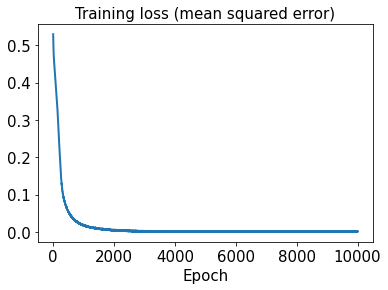

In [29]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

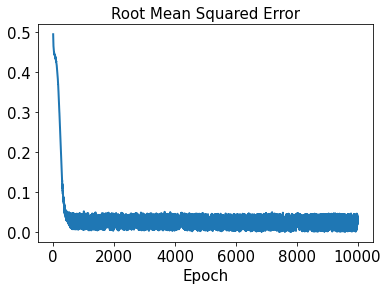

In [30]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [31]:
test_results1 = sd1.evaluate(x_test1)

1/1 [==============================] - 0s 106ms/step - loss: 4.9174e-06 - rmse: 0.0000e+00


In [32]:
decoded_sensor_train1 = sensor_pred1.predict(t_train)

In [33]:
decoded_sensor_test1 = sensor_pred1.predict(t_test)

In [34]:
decoded_train1 = sd1.predict(decoded_sensor_train1)

In [35]:
decoded_test1 = sd1.predict(decoded_sensor_test1)

In [36]:
error_train_abs1 = np.abs(decoded_train1 - y_train1)

In [37]:
error_test_abs1 = np.abs(decoded_test1 - y_test1)

In [38]:
l2_error_train1 = np.sqrt(np.sum((decoded_train1 - y_train1)**2) / np.sum(y_train1**2))
print(l2_error_train1)

0.2029178301536183


In [39]:
l2_error_test1 = np.sqrt(np.sum((decoded_test1 - y_test1)**2) / np.sum(y_test1**2))
print(l2_error_test1)

0.23013036105870271


In [40]:
l2_error_train_list1 = []
for i in range(0, len(x_train1)):
    l2_error_train_data1 = np.sqrt(np.sum((decoded_train1[i] - y_train1[i])**2) / np.sum(y_train1[i]**2))
    l2_error_train_list1.append(l2_error_train_data1)
print(l2_error_train_list1)

[0.2764434793673522, 0.11576054261049673, 0.2280504817978547, 0.3566843247099015, 0.005477200542096946, 0.10665146565434636, 0.13508133242467577, 0.2999167121038771, 0.03486124811131552, 0.3722657854504087, 0.33902730740420794, 0.13125541775335395, 0.24328530038275217, 0.14038668599841606, 0.3557656642289377, 0.07397295470532457, 0.28491237063025004, 0.16911079080115585, 0.005918703209139885, 0.2925383792794872, 0.4451681606925597, 0.08850121378362957, 0.4076206188809928, 0.1894395769170318, 0.30753748037594214, 0.22605515493575892, 0.17876795019566133, 0.05303706885778105, 0.16043803510271284, 0.051765335635374055, 0.2709763959196129, 0.2597349932163188, 0.48450215606170466]


In [41]:
l2_error_test_list1 = []
for i in range(0, len(x_test1)):
    l2_error_test_data1 = np.sqrt(np.sum((decoded_test1[i] - y_test1[i])**2) / np.sum(y_test1[i]**2))
    l2_error_test_list1.append(l2_error_test_data1)
print(l2_error_test_list1)

[0.20117910348272408, 0.37477909011414196, 0.015173358861017571, 0.21403010013572432, 0.11301674065774421, 0.407833363080141, 0.12977936205134846, 0.49271511875086477]


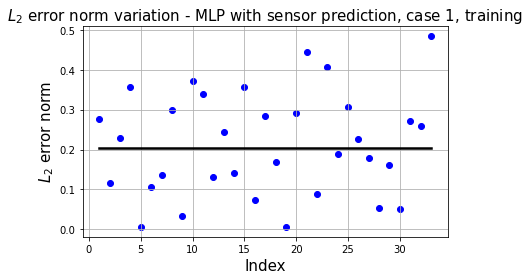

In [42]:
plt.plot(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train1*np.ones(x_train1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

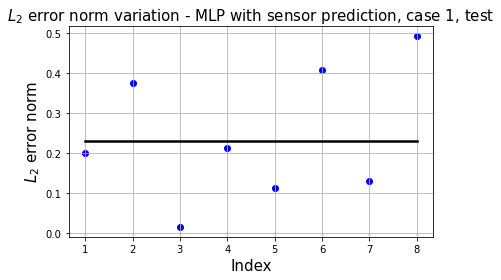

In [43]:
plt.plot(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test1*np.ones(x_test1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

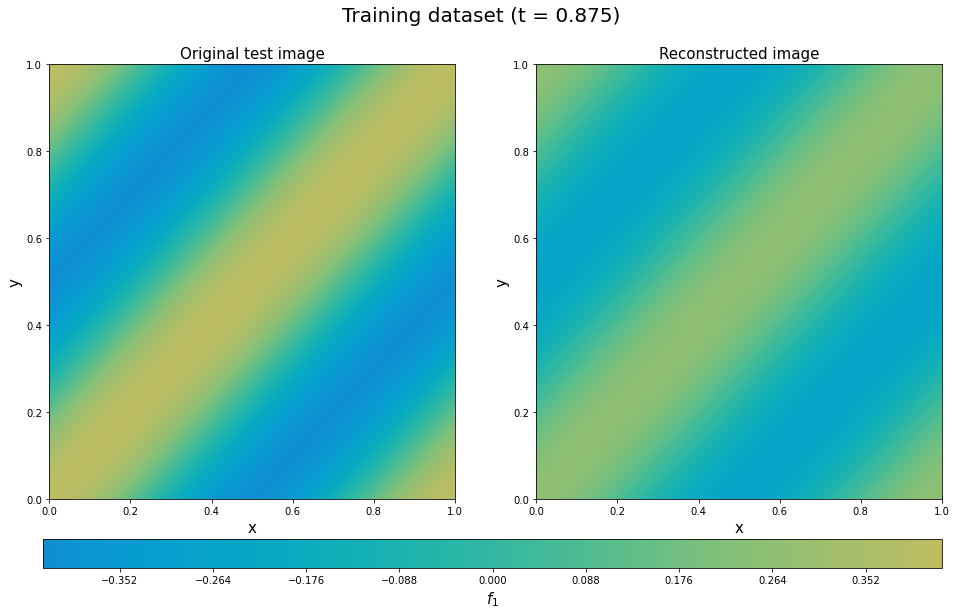

In [44]:
plt.figure(figsize=(16, 8))
y_train1_9_rotate = y_train1[9].T.reshape(101,101)
decoded_rotate1 = decoded_train1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_9_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[35]),fontsize=20)
plt.show()

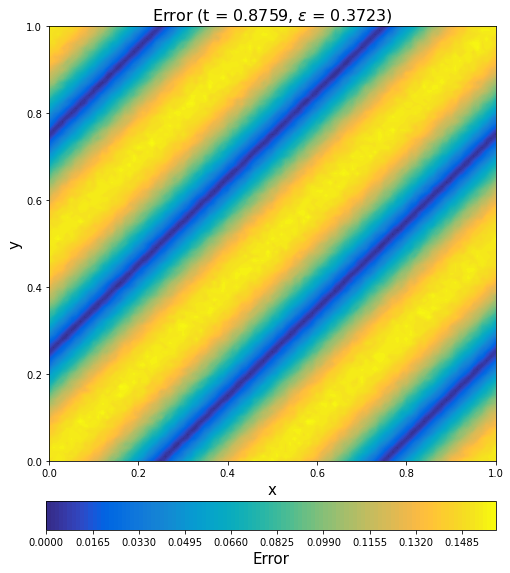

In [45]:
error_train_abs1_rotate9 = error_train_abs1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate9, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.8759, $\epsilon$ = %.4f)' %(l2_error_train_list1[9]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

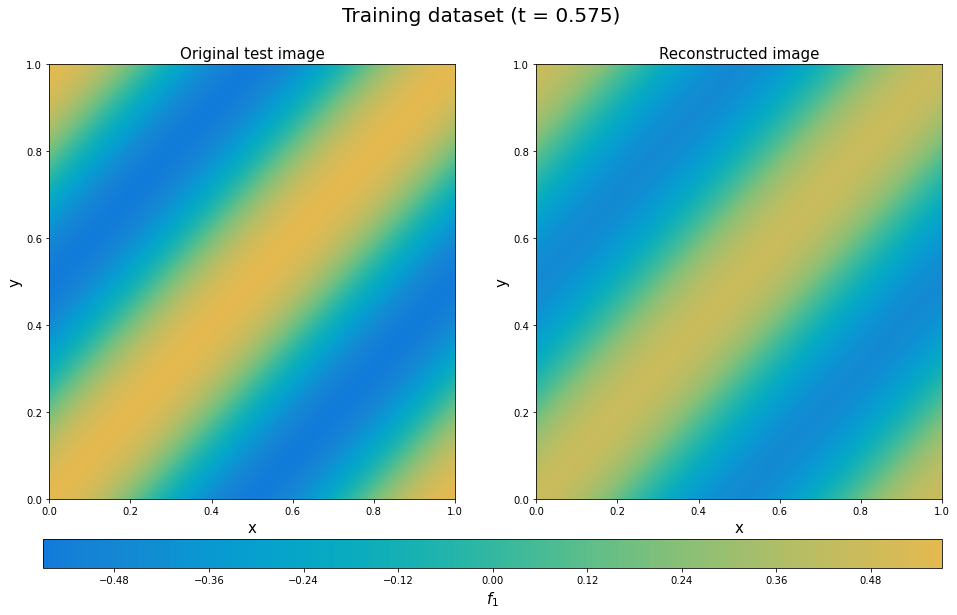

In [46]:
plt.figure(figsize=(16, 8))
y_train1_23_rotate = y_train1[23].T.reshape(101,101)
decoded_rotate1 = decoded_train1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_23_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[23]), fontsize=20)
plt.show()

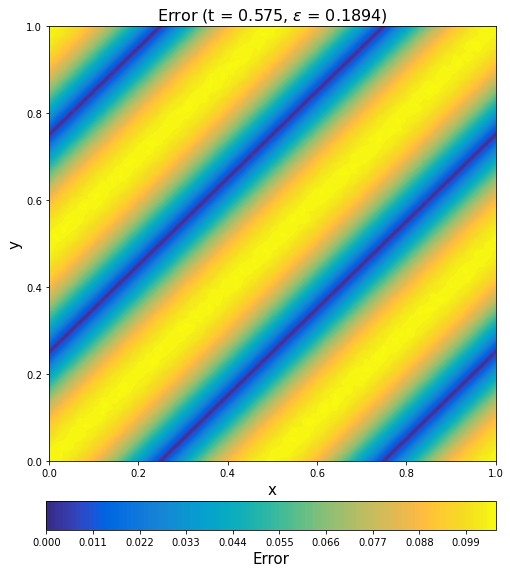

In [47]:
error_train_abs1_rotate23 = error_train_abs1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate23, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.575, $\epsilon$ = %.4f)' %(l2_error_train_list1[23]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

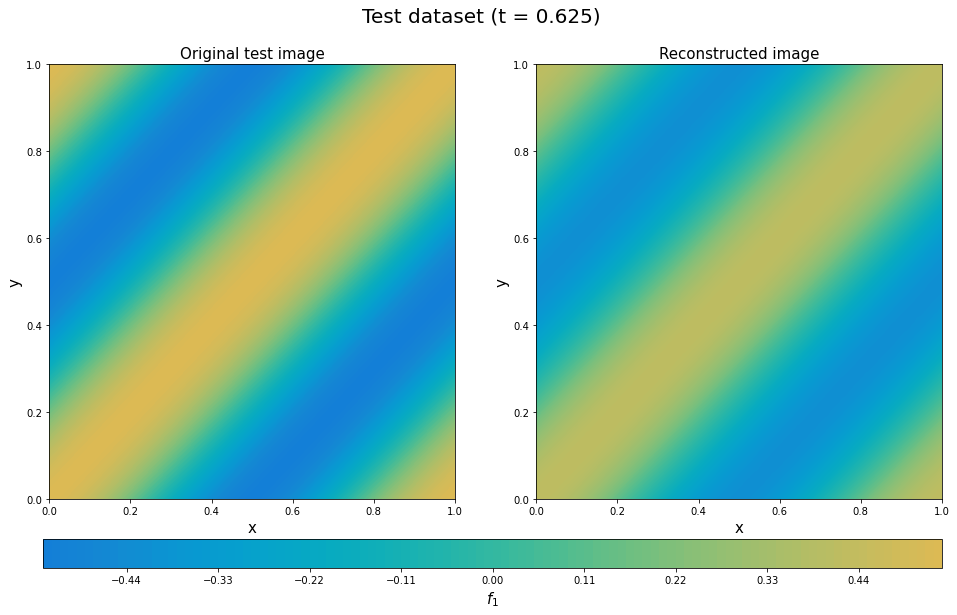

In [48]:
plt.figure(figsize=(16, 8))
y_test1_3_rotate = y_test1[3].T.reshape(101,101)
decoded_rotate1 = decoded_test1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_3_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[25]),fontsize=20)
plt.show()

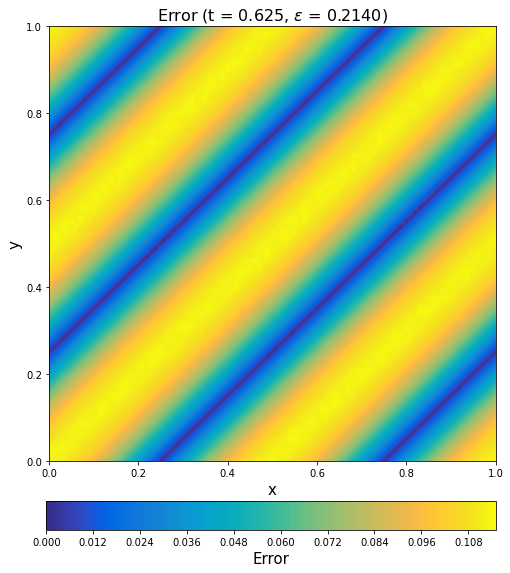

In [49]:
error_test_abs1_rotate3 = error_test_abs1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate3, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.625, $\epsilon$ = %.4f)' %(l2_error_test_list1[3]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

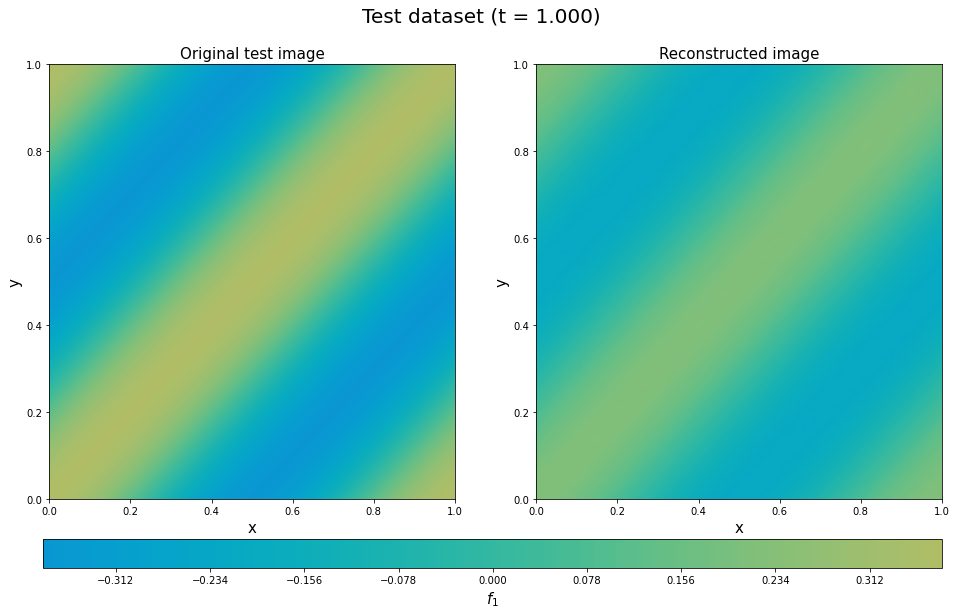

In [50]:
plt.figure(figsize=(16, 8))
y_test1_5_rotate = y_test1[5].T.reshape(101,101)
decoded_rotate1 = decoded_test1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_5_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[40]),fontsize=20)
plt.show()

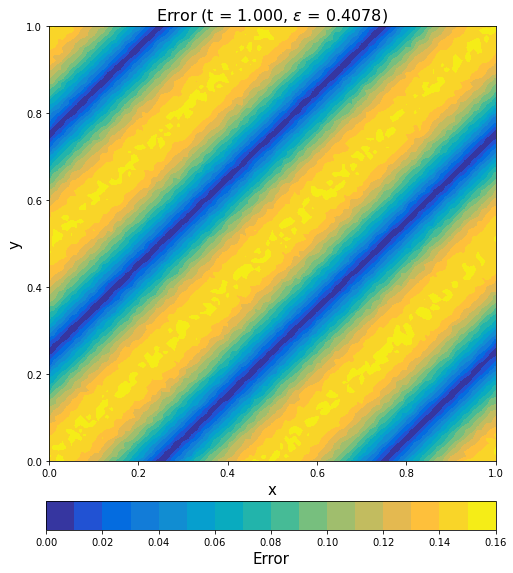

In [51]:
error_test_abs1_rotate5 = error_test_abs1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate5, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 1.000, $\epsilon$ = %.4f)' %(l2_error_test_list1[5]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 2: f2

In [52]:
out2 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out2[i, j, k] = x[j] + y[k] + t[i]

In [53]:
sensor2 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor2[i, j, k] = out2[i, 20*(j+1)+1, 20*(k+1)+1]

In [54]:
sensor2 = sensor2.reshape((41, 16, 1))

In [55]:
sensor2.shape

(41, 16, 1)

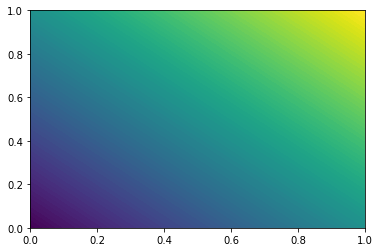

In [56]:
plt.contourf(xmesh, ymesh, out2[0,:,:], levels=128)

In [57]:
x_train2, x_test2, y_train2, y_test2, t_train, t_test = train_test_split(sensor2, out2, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [58]:
x_train2

array([[[1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945],
        [1.545],
        [1.745],
        [1.945],
        [2.145],
        [1.745],
        [1.945],
        [2.145],
        [2.345]],

       [[0.57 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.77 ]],

       [[1.07 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [2.27 ]],

       [[0.72 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [1.52 ],
        [1.12 ],
        [1.32 ],
        

In [59]:
x_test2

array([[[1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [2.22 ]],

       [[0.745],
        [0.945],
        [1.145],
        [1.345],
        [0.945],
        [1.145],
        [1.345],
        [1.545],
        [1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945]],

       [[0.62 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ]],

       [[1.045],
        [1.245],
        [1.445],
        [1.645],
        [1.245],
        [1.445],
        [1.645],
        [1.845],
        [1.445],
        [1.645],
        

In [60]:
sensor_pred2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [61]:
start2 = datetime.datetime.now()
history2 = sensor_pred2.fit(t_train, x_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 13ms/step - loss: 2.5916 - rmse: 1.6096
Epoch 2/10000
2/2 [==============================] - 0s 22ms/step - loss: 2.5889 - rmse: 1.6088
Epoch 3/10000
2/2 [==============================] - 0s 31ms/step - loss: 2.5867 - rmse: 1.6081
Epoch 4/10000
2/2 [==============================] - 0s 31ms/step - loss: 2.5850 - rmse: 1.6076
Epoch 5/10000
2/2 [==============================] - 0s 22ms/step - loss: 2.5828 - rmse: 1.6069
Epoch 6/10000
2/2 [==============================] - 0s 46ms/step - loss: 2.5808 - rmse: 1.6062
Epoch 7/10000
2/2 [==============================] - 0s 19ms/step - loss: 2.5793 - rmse: 1.6058
Epoch 8/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.5774 - rmse: 1.6052
Epoch 9/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.5754 - rmse: 1.6045
Epoch 10/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.5738 - rmse: 1.6041
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 2.4252 - rmse: 1.5570
Epoch 86/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4181 - rmse: 1.5548
Epoch 87/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4162 - rmse: 1.5541
Epoch 88/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4147 - rmse: 1.5537
Epoch 89/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4118 - rmse: 1.5527
Epoch 90/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4120 - rmse: 1.5528
Epoch 91/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4093 - rmse: 1.5519
Epoch 92/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4063 - rmse: 1.5510
Epoch 93/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4047 - rmse: 1.5504
Epoch 94/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4033 - rmse: 1.5500
Epoch 95/10000
2/2 [==============================

2/2 [==============================] - 0s 14ms/step - loss: 2.2765 - rmse: 1.5085
Epoch 170/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2761 - rmse: 1.5084
Epoch 171/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.2769 - rmse: 1.5087
Epoch 172/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2722 - rmse: 1.5071
Epoch 173/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.2715 - rmse: 1.5069
Epoch 174/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2683 - rmse: 1.5058
Epoch 175/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.2664 - rmse: 1.5052
Epoch 176/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2652 - rmse: 1.5048
Epoch 177/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.2632 - rmse: 1.5041
Epoch 178/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.2612 - rmse: 1.5035
Epoch 179/10000
2/2 [================

2/2 [==============================] - 0s 14ms/step - loss: 2.1421 - rmse: 1.4633
Epoch 253/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.1402 - rmse: 1.4627
Epoch 254/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.1387 - rmse: 1.4621
Epoch 255/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1367 - rmse: 1.4615
Epoch 256/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.1354 - rmse: 1.4610
Epoch 257/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1320 - rmse: 1.4599
Epoch 258/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.1303 - rmse: 1.4593
Epoch 259/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.1291 - rmse: 1.4589
Epoch 260/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1274 - rmse: 1.4583
Epoch 261/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.1254 - rmse: 1.4576
Epoch 262/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 2.0055 - rmse: 1.4159
Epoch 336/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0035 - rmse: 1.4152
Epoch 337/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.0043 - rmse: 1.4154
Epoch 338/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.0007 - rmse: 1.4142
Epoch 339/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.9990 - rmse: 1.4136
Epoch 340/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.9985 - rmse: 1.4134
Epoch 341/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.9963 - rmse: 1.4126
Epoch 342/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.9956 - rmse: 1.4124
Epoch 343/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9919 - rmse: 1.4111
Epoch 344/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.9929 - rmse: 1.4114
Epoch 345/10000
2/2 [=================

2/2 [==============================] - 0s 13ms/step - loss: 1.8728 - rmse: 1.3682
Epoch 419/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8701 - rmse: 1.3672
Epoch 420/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8690 - rmse: 1.3668
Epoch 421/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8697 - rmse: 1.3671
Epoch 422/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8668 - rmse: 1.3660
Epoch 423/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8663 - rmse: 1.3658
Epoch 424/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8636 - rmse: 1.3649
Epoch 425/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8610 - rmse: 1.3639
Epoch 426/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8588 - rmse: 1.3631
Epoch 427/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8573 - rmse: 1.3625
Epoch 428/10000
2/2 [==================

2/2 [==============================] - 0s 14ms/step - loss: 1.7417 - rmse: 1.3194
Epoch 502/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7412 - rmse: 1.3192
Epoch 503/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7393 - rmse: 1.3185
Epoch 504/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7398 - rmse: 1.3187
Epoch 505/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7355 - rmse: 1.3171
Epoch 506/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7346 - rmse: 1.3167
Epoch 507/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7333 - rmse: 1.3163
Epoch 508/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7306 - rmse: 1.3152
Epoch 509/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7294 - rmse: 1.3148
Epoch 510/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.7272 - rmse: 1.3139
Epoch 511/10000
2/2 [================

2/2 [==============================] - 0s 13ms/step - loss: 1.6078 - rmse: 1.2677
Epoch 585/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6068 - rmse: 1.2673
Epoch 586/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.6055 - rmse: 1.2668
Epoch 587/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.6028 - rmse: 1.2657
Epoch 588/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.6032 - rmse: 1.2659
Epoch 589/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5995 - rmse: 1.2644
Epoch 590/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5990 - rmse: 1.2642
Epoch 591/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5977 - rmse: 1.2637
Epoch 592/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5973 - rmse: 1.2635
Epoch 593/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5958 - rmse: 1.2629
Epoch 594/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 1.4822 - rmse: 1.2171
Epoch 668/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4766 - rmse: 1.2148
Epoch 669/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4774 - rmse: 1.2152
Epoch 670/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.4728 - rmse: 1.2133
Epoch 671/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.4727 - rmse: 1.2132
Epoch 672/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4726 - rmse: 1.2132
Epoch 673/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4686 - rmse: 1.2115
Epoch 674/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.4702 - rmse: 1.2122
Epoch 675/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4648 - rmse: 1.2100
Epoch 676/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.4659 - rmse: 1.2104
Epoch 677/10000
2/2 [=================

2/2 [==============================] - 0s 10ms/step - loss: 1.3515 - rmse: 1.1622
Epoch 751/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.3501 - rmse: 1.1616
Epoch 752/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.3494 - rmse: 1.1613
Epoch 753/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3487 - rmse: 1.1610
Epoch 754/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.3453 - rmse: 1.1595
Epoch 755/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3451 - rmse: 1.1594
Epoch 756/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3440 - rmse: 1.1590
Epoch 757/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3401 - rmse: 1.1573
Epoch 758/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3431 - rmse: 1.1586
Epoch 759/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3373 - rmse: 1.1561
Epoch 760/10000
2/2 [================

2/2 [==============================] - 0s 14ms/step - loss: 1.2321 - rmse: 1.1097
Epoch 834/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2312 - rmse: 1.1092
Epoch 835/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2274 - rmse: 1.1075
Epoch 836/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2255 - rmse: 1.1067
Epoch 837/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2232 - rmse: 1.1056
Epoch 838/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.2235 - rmse: 1.1058
Epoch 839/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2214 - rmse: 1.1048
Epoch 840/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2203 - rmse: 1.1043
Epoch 841/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.2209 - rmse: 1.1046
Epoch 842/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2194 - rmse: 1.1039
Epoch 843/10000
2/2 [================

2/2 [==============================] - 0s 12ms/step - loss: 1.1130 - rmse: 1.0546
Epoch 917/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.1121 - rmse: 1.0542
Epoch 918/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1113 - rmse: 1.0538
Epoch 919/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.1087 - rmse: 1.0526
Epoch 920/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1077 - rmse: 1.0521
Epoch 921/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.1104 - rmse: 1.0534
Epoch 922/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.1055 - rmse: 1.0510
Epoch 923/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1083 - rmse: 1.0524
Epoch 924/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.1061 - rmse: 1.0513
Epoch 925/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.1030 - rmse: 1.0499
Epoch 926/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 0.9980 - rmse: 0.9986
Epoch 1000/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.0007 - rmse: 1.0000
Epoch 1001/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.9946 - rmse: 0.9969
Epoch 1002/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.9934 - rmse: 0.9963
Epoch 1003/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9936 - rmse: 0.9964
Epoch 1004/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.9974 - rmse: 0.9983
Epoch 1005/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9897 - rmse: 0.9944
Epoch 1006/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9940 - rmse: 0.9966
Epoch 1007/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9892 - rmse: 0.9942
Epoch 1008/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9865 - rmse: 0.9928
Epoch 1009/10000
2/2 [=====

2/2 [==============================] - 0s 8ms/step - loss: 0.8939 - rmse: 0.9450
Epoch 1083/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8880 - rmse: 0.9419
Epoch 1084/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8866 - rmse: 0.9412
Epoch 1085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8877 - rmse: 0.9417
Epoch 1086/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8863 - rmse: 0.9410
Epoch 1087/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8823 - rmse: 0.9389
Epoch 1088/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8806 - rmse: 0.9380
Epoch 1089/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8845 - rmse: 0.9401
Epoch 1090/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8800 - rmse: 0.9377
Epoch 1091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8806 - rmse: 0.9380
Epoch 1092/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 0.7874 - rmse: 0.8869
Epoch 1166/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7927 - rmse: 0.8899
Epoch 1167/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7908 - rmse: 0.8888
Epoch 1168/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7889 - rmse: 0.8878
Epoch 1169/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7879 - rmse: 0.8872
Epoch 1170/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7888 - rmse: 0.8877
Epoch 1171/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7824 - rmse: 0.8841
Epoch 1172/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7817 - rmse: 0.8837
Epoch 1173/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.7790 - rmse: 0.8822
Epoch 1174/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7829 - rmse: 0.8844
Epoch 1175/10000
2/2 [==========

2/2 [==============================] - 0s 9ms/step - loss: 0.6999 - rmse: 0.8362
Epoch 1249/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6957 - rmse: 0.8336
Epoch 1250/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6951 - rmse: 0.8333
Epoch 1251/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6965 - rmse: 0.8341
Epoch 1252/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6943 - rmse: 0.8328
Epoch 1253/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6971 - rmse: 0.8345
Epoch 1254/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6914 - rmse: 0.8310
Epoch 1255/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6896 - rmse: 0.8300
Epoch 1256/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6935 - rmse: 0.8323
Epoch 1257/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6879 - rmse: 0.8289
Epoch 1258/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 0.6131 - rmse: 0.7825
Epoch 1332/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.6122 - rmse: 0.7819
Epoch 1333/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6123 - rmse: 0.7820
Epoch 1334/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.6089 - rmse: 0.7798
Epoch 1335/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6099 - rmse: 0.7805
Epoch 1336/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.6124 - rmse: 0.7821
Epoch 1337/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6055 - rmse: 0.7776
Epoch 1338/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.6060 - rmse: 0.7780
Epoch 1339/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6032 - rmse: 0.7762
Epoch 1340/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.6069 - rmse: 0.7785
Epoch 1341/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.5341 - rmse: 0.7303
Epoch 1415/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.5381 - rmse: 0.7330
Epoch 1416/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.5331 - rmse: 0.7296
Epoch 1417/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5321 - rmse: 0.7289
Epoch 1418/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.5302 - rmse: 0.7276
Epoch 1419/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5315 - rmse: 0.7285
Epoch 1420/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5301 - rmse: 0.7276
Epoch 1421/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5305 - rmse: 0.7278
Epoch 1422/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5269 - rmse: 0.7254
Epoch 1423/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5315 - rmse: 0.7285
Epoch 1424/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.4663 - rmse: 0.6823
Epoch 1498/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4652 - rmse: 0.6815
Epoch 1499/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4636 - rmse: 0.6803
Epoch 1500/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4611 - rmse: 0.6785
Epoch 1501/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4603 - rmse: 0.6779
Epoch 1502/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4617 - rmse: 0.6789
Epoch 1503/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4609 - rmse: 0.6783
Epoch 1504/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4581 - rmse: 0.6762
Epoch 1505/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4623 - rmse: 0.6793
Epoch 1506/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4562 - rmse: 0.6749
Epoch 1507/10000
2/2 [=======

Epoch 1580/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4014 - rmse: 0.6330
Epoch 1581/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4021 - rmse: 0.6335
Epoch 1582/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4019 - rmse: 0.6334
Epoch 1583/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4051 - rmse: 0.6359
Epoch 1584/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4011 - rmse: 0.6327
Epoch 1585/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3985 - rmse: 0.6307
Epoch 1586/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3966 - rmse: 0.6292
Epoch 1587/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3962 - rmse: 0.6288
Epoch 1588/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3950 - rmse: 0.6279
Epoch 1589/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4002 - rmse: 0.6320
Epoch 1590/

2/2 [==============================] - 0s 12ms/step - loss: 0.3485 - rmse: 0.5897
Epoch 1663/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3472 - rmse: 0.5886
Epoch 1664/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3477 - rmse: 0.5890
Epoch 1665/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3454 - rmse: 0.5870
Epoch 1666/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3406 - rmse: 0.5830
Epoch 1667/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3463 - rmse: 0.5878
Epoch 1668/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3410 - rmse: 0.5833
Epoch 1669/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3387 - rmse: 0.5813
Epoch 1670/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3416 - rmse: 0.5838
Epoch 1671/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3448 - rmse: 0.5865
Epoch 1672/10000
2/2 [======

Epoch 1745/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2934 - rmse: 0.5409
Epoch 1746/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2944 - rmse: 0.5419
Epoch 1747/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2922 - rmse: 0.5398
Epoch 1748/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2919 - rmse: 0.5395
Epoch 1749/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2902 - rmse: 0.5380
Epoch 1750/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2966 - rmse: 0.5439
Epoch 1751/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2926 - rmse: 0.5403
Epoch 1752/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2920 - rmse: 0.5397
Epoch 1753/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2877 - rmse: 0.5356
Epoch 1754/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2934 - rmse: 0.5410
Epoch 1755/10

2/2 [==============================] - 0s 14ms/step - loss: 0.2490 - rmse: 0.4982
Epoch 1828/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2470 - rmse: 0.4962
Epoch 1829/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2469 - rmse: 0.4961
Epoch 1830/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2474 - rmse: 0.4967
Epoch 1831/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2445 - rmse: 0.4937
Epoch 1832/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2464 - rmse: 0.4956
Epoch 1833/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2471 - rmse: 0.4963
Epoch 1834/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2453 - rmse: 0.4945
Epoch 1835/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2453 - rmse: 0.4945
Epoch 1836/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2418 - rmse: 0.4910
Epoch 1837/10000
2/2 [======

Epoch 1910/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2090 - rmse: 0.4563
Epoch 1911/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2053 - rmse: 0.4522
Epoch 1912/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2060 - rmse: 0.4530
Epoch 1913/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2110 - rmse: 0.4585
Epoch 1914/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2043 - rmse: 0.4512
Epoch 1915/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2055 - rmse: 0.4525
Epoch 1916/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2066 - rmse: 0.4537
Epoch 1917/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2078 - rmse: 0.4551
Epoch 1918/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2039 - rmse: 0.4507
Epoch 1919/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2025 - rmse: 0.4492
Epoch 1920/

2/2 [==============================] - 0s 9ms/step - loss: 0.1753 - rmse: 0.4178
Epoch 1993/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1749 - rmse: 0.4173
Epoch 1994/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1745 - rmse: 0.4168
Epoch 1995/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1741 - rmse: 0.4163
Epoch 1996/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1773 - rmse: 0.4201
Epoch 1997/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1694 - rmse: 0.4107
Epoch 1998/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1755 - rmse: 0.4181
Epoch 1999/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1717 - rmse: 0.4135
Epoch 2000/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1724 - rmse: 0.4143
Epoch 2001/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1678 - rmse: 0.4088
Epoch 2002/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.1480 - rmse: 0.3837
Epoch 2076/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1493 - rmse: 0.3855
Epoch 2077/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1432 - rmse: 0.3774
Epoch 2078/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1476 - rmse: 0.3832
Epoch 2079/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1413 - rmse: 0.3750
Epoch 2080/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1412 - rmse: 0.3748
Epoch 2081/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1468 - rmse: 0.3822
Epoch 2082/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1404 - rmse: 0.3737
Epoch 2083/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1440 - rmse: 0.3786
Epoch 2084/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1432 - rmse: 0.3774
Epoch 2085/10000
2/2 [=====

2/2 [==============================] - 0s 8ms/step - loss: 0.1173 - rmse: 0.3413
Epoch 2159/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1160 - rmse: 0.3395
Epoch 2160/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1196 - rmse: 0.3448
Epoch 2161/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1227 - rmse: 0.3493
Epoch 2162/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1147 - rmse: 0.3376
Epoch 2163/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1166 - rmse: 0.3404
Epoch 2164/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1189 - rmse: 0.3438
Epoch 2165/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1194 - rmse: 0.3445
Epoch 2166/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1150 - rmse: 0.3380
Epoch 2167/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1134 - rmse: 0.3357
Epoch 2168/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0978 - rmse: 0.3116
Epoch 2242/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0941 - rmse: 0.3056
Epoch 2243/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0935 - rmse: 0.3046
Epoch 2244/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0997 - rmse: 0.3146
Epoch 2245/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0958 - rmse: 0.3083
Epoch 2246/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0927 - rmse: 0.3032
Epoch 2247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0925 - rmse: 0.3029
Epoch 2248/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0946 - rmse: 0.3064
Epoch 2249/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0949 - rmse: 0.3069
Epoch 2250/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0917 - rmse: 0.3015
Epoch 2251/10000
2/2 [===============

2/2 [==============================] - 0s 11ms/step - loss: 0.0767 - rmse: 0.2756
Epoch 2325/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0793 - rmse: 0.2802
Epoch 2326/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0751 - rmse: 0.2726
Epoch 2327/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0779 - rmse: 0.2778
Epoch 2328/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0755 - rmse: 0.2734
Epoch 2329/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0749 - rmse: 0.2724
Epoch 2330/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0745 - rmse: 0.2715
Epoch 2331/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0734 - rmse: 0.2697
Epoch 2332/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0775 - rmse: 0.2770
Epoch 2333/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0767 - rmse: 0.2757
Epoch 2334/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0665 - rmse: 0.2565
Epoch 2407/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0661 - rmse: 0.2558
Epoch 2408/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0598 - rmse: 0.2430
Epoch 2409/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0592 - rmse: 0.2418
Epoch 2410/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0621 - rmse: 0.2478
Epoch 2411/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0606 - rmse: 0.2448
Epoch 2412/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0588 - rmse: 0.2410
Epoch 2413/10000
2/2 [==============================] - 0s 36ms/step - loss: 0.0638 - rmse: 0.2512
Epoch 2414/10000
2/2 [==============================] - 0s 36ms/step - loss: 0.0585 - rmse: 0.2403
Epoch 2415/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0600 - rmse: 0.2435
Epoch 2416/10000
2/2 [=====

Epoch 2489/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0472 - rmse: 0.2155
Epoch 2490/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0472 - rmse: 0.2155
Epoch 2491/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0468 - rmse: 0.2147
Epoch 2492/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0526 - rmse: 0.2278
Epoch 2493/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0468 - rmse: 0.2146
Epoch 2494/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0471 - rmse: 0.2154
Epoch 2495/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0470 - rmse: 0.2151
Epoch 2496/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0474 - rmse: 0.2161
Epoch 2497/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0491 - rmse: 0.2200
Epoch 2498/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0478 - rmse: 0.2171
Epoch 2499/1

2/2 [==============================] - 0s 7ms/step - loss: 0.0380 - rmse: 0.1930
Epoch 2573/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0411 - rmse: 0.2010
Epoch 2574/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0366 - rmse: 0.1894
Epoch 2575/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0376 - rmse: 0.1920
Epoch 2576/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0363 - rmse: 0.1887
Epoch 2577/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0419 - rmse: 0.2029
Epoch 2578/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0421 - rmse: 0.2034
Epoch 2579/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0358 - rmse: 0.1872
Epoch 2580/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0364 - rmse: 0.1888
Epoch 2581/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0417 - rmse: 0.2023
Epoch 2582/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0334 - rmse: 0.1809
Epoch 2656/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0281 - rmse: 0.1656
Epoch 2657/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0301 - rmse: 0.1714
Epoch 2658/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0341 - rmse: 0.1828
Epoch 2659/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0286 - rmse: 0.1670
Epoch 2660/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0278 - rmse: 0.1647
Epoch 2661/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0284 - rmse: 0.1665
Epoch 2662/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0277 - rmse: 0.1642
Epoch 2663/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0285 - rmse: 0.1667
Epoch 2664/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0335 - rmse: 0.1812
Epoch 2665/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0225 - rmse: 0.1478
Epoch 2739/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0254 - rmse: 0.1573
Epoch 2740/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0228 - rmse: 0.1486
Epoch 2741/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0279 - rmse: 0.1649
Epoch 2742/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0218 - rmse: 0.1452
Epoch 2743/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0212 - rmse: 0.1431
Epoch 2744/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0231 - rmse: 0.1496
Epoch 2745/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0221 - rmse: 0.1462
Epoch 2746/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0249 - rmse: 0.1555
Epoch 2747/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0210 - rmse: 0.1424
Epoch 2748/10000
2/2 [==============

2/2 [==============================] - 0s 8ms/step - loss: 0.0163 - rmse: 0.1249
Epoch 2822/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0191 - rmse: 0.1357
Epoch 2823/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0163 - rmse: 0.1249
Epoch 2824/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0161 - rmse: 0.1242
Epoch 2825/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0206 - rmse: 0.1410
Epoch 2826/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0199 - rmse: 0.1387
Epoch 2827/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0165 - rmse: 0.1257
Epoch 2828/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0160 - rmse: 0.1237
Epoch 2829/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0158 - rmse: 0.1227
Epoch 2830/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0188 - rmse: 0.1347
Epoch 2831/10000
2/2 [==============

2/2 [==============================] - 0s 14ms/step - loss: 0.0136 - rmse: 0.1137
Epoch 2905/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0125 - rmse: 0.1088
Epoch 2906/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0123 - rmse: 0.1077
Epoch 2907/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0134 - rmse: 0.1126
Epoch 2908/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0122 - rmse: 0.1073
Epoch 2909/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0123 - rmse: 0.1080
Epoch 2910/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0141 - rmse: 0.1158
Epoch 2911/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0136 - rmse: 0.1138
Epoch 2912/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0122 - rmse: 0.1074
Epoch 2913/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0177 - rmse: 0.1303
Epoch 2914/10000
2/2 [========

Epoch 2987/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0093 - rmse: 0.0928
Epoch 2988/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0107 - rmse: 0.0999
Epoch 2989/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0093 - rmse: 0.0929
Epoch 2990/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0144 - rmse: 0.1170
Epoch 2991/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0145 - rmse: 0.1178
Epoch 2992/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0092 - rmse: 0.0923
Epoch 2993/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0157 - rmse: 0.1224
Epoch 2994/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0091 - rmse: 0.0916
Epoch 2995/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0104 - rmse: 0.0987
Epoch 2996/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0091 - rmse: 0.0915
Epoch 2997

2/2 [==============================] - 0s 12ms/step - loss: 0.0144 - rmse: 0.1173
Epoch 3070/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0128 - rmse: 0.1100
Epoch 3071/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0099 - rmse: 0.0963
Epoch 3072/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0103 - rmse: 0.0981
Epoch 3073/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0848
Epoch 3074/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0790
Epoch 3075/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0807
Epoch 3076/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0781
Epoch 3077/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0949
Epoch 3078/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0778
Epoch 3079/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0677
Epoch 3152/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0728
Epoch 3153/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0113 - rmse: 0.1032
Epoch 3154/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0086 - rmse: 0.0892
Epoch 3155/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0953
Epoch 3156/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0769
Epoch 3157/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0686
Epoch 3158/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0813
Epoch 3159/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0781
Epoch 3160/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0053 - rmse: 0.0680
Epoch 3161/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0632
Epoch 3234/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0848
Epoch 3235/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0629
Epoch 3236/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0051 - rmse: 0.0671
Epoch 3237/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0059 - rmse: 0.0722
Epoch 3238/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0625
Epoch 3239/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0790
Epoch 3240/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0789
Epoch 3241/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0567
Epoch 3242/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0038 - rmse: 0.0564
Epoch 3243/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0089 - rmse: 0.0907
Epoch 3316/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0661
Epoch 3317/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0105 - rmse: 0.0994
Epoch 3318/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0075 - rmse: 0.0830
Epoch 3319/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0866
Epoch 3320/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0770
Epoch 3321/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0954
Epoch 3322/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0088 - rmse: 0.0903
Epoch 3323/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0088 - rmse: 0.0902
Epoch 3324/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0766
Epoch 3325/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0789
Epoch 3398/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0483
Epoch 3399/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0863
Epoch 3400/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0496
Epoch 3401/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0754
Epoch 3402/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0597
Epoch 3403/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0625
Epoch 3404/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0486
Epoch 3405/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0878
Epoch 3406/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0483
Epoch 3407/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0665
Epoch 3480/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0376
Epoch 3481/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0739
Epoch 3482/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0376
Epoch 3483/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0688
Epoch 3484/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0586
Epoch 3485/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0367
Epoch 3486/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0804
Epoch 3487/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0354
Epoch 3488/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0549
Epoch 3489/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0499
Epoch 3562/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0830
Epoch 3563/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0397
Epoch 3564/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0546
Epoch 3565/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0463
Epoch 3566/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0703
Epoch 3567/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0060 - rmse: 0.0732
Epoch 3568/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0346
Epoch 3569/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0066 - rmse: 0.0774
Epoch 3570/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0773
Epoch 3571/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0261
Epoch 3644/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0906
Epoch 3645/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0252
Epoch 3646/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0849
Epoch 3647/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0321
Epoch 3648/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0774
Epoch 3649/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0528
Epoch 3650/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0859
Epoch 3651/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0372
Epoch 3652/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0525
Epoch 3653/10000
2/2 [=====

2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0343
Epoch 3727/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0247
Epoch 3728/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0417
Epoch 3729/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0209
Epoch 3730/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0253
Epoch 3731/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0252
Epoch 3732/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0251
Epoch 3733/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0427
Epoch 3734/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0388
Epoch 3735/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0708
Epoch 3736/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0447
Epoch 3810/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0741
Epoch 3811/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0212
Epoch 3812/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0447
Epoch 3813/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0583
Epoch 3814/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0742
Epoch 3815/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0212
Epoch 3816/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0742
Epoch 3817/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0529
Epoch 3818/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0330
Epoch 3819/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 0.0077 - rmse: 0.0842
Epoch 3893/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0023 - rmse: 0.0419
Epoch 3894/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0076 - rmse: 0.0841
Epoch 3895/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0049 - rmse: 0.0655
Epoch 3896/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0698
Epoch 3897/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0581
Epoch 3898/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0050 - rmse: 0.0666
Epoch 3899/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0497
Epoch 3900/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0329
Epoch 3901/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0233
Epoch 3902/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 7.6207e-04 - rmse: 0.0143
Epoch 3975/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0241
Epoch 3976/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0473
Epoch 3977/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0571
Epoch 3978/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0307
Epoch 3979/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0571
Epoch 3980/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0347
Epoch 3981/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0602
Epoch 3982/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0485
Epoch 3983/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0239
Epoch 3984/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0744
Epoch 4057/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4598e-04 - rmse: 0.0173
Epoch 4058/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0743
Epoch 4059/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0655
Epoch 4060/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0655
Epoch 4061/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0345
Epoch 4062/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0876
Epoch 4063/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0795e-04 - rmse: 0.0162
Epoch 4064/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0775
Epoch 4065/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0654
Epoch 4066/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0350
Epoch 4139/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0266
Epoch 4140/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0653
Epoch 4141/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5575e-04 - rmse: 0.0179
Epoch 4142/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0654
Epoch 4143/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0339
Epoch 4144/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6646e-04 - rmse: 0.0115
Epoch 4145/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3249e-04 - rmse: 0.0099
Epoch 4146/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0788
Epoch 4147/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0787
Epoch 4148/10000
2/2 [==

2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0467
Epoch 4221/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0641
Epoch 4222/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0392
Epoch 4223/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0297
Epoch 4224/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.3403e-04 - rmse: 0.0145
Epoch 4225/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0350
Epoch 4226/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0392
Epoch 4227/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0786
Epoch 4228/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0685
Epoch 4229/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0831
Epoch 4230/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0784
Epoch 4303/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0424
Epoch 4304/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0466
Epoch 4305/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0338
Epoch 4306/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5243e-04 - rmse: 0.0155
Epoch 4307/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.7029e-04 - rmse: 0.0189
Epoch 4308/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0349
Epoch 4309/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0552
Epoch 4310/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1031e-04 - rmse: 0.0141
Epoch 4311/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0390
Epoch 4312/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0740
Epoch 4384/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0260
Epoch 4385/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0336
Epoch 4386/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.8224e-04 - rmse: 0.0134
Epoch 4387/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0377
Epoch 4388/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.7858e-04 - rmse: 0.0088
Epoch 4389/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0999e-04 - rmse: 0.0144
Epoch 4390/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0597
Epoch 4391/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0433
Epoch 4392/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0653
Epoch 4393/1000

Epoch 4465/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0491
Epoch 4466/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.8401e-04 - rmse: 0.0222
Epoch 4467/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0577
Epoch 4468/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0482
Epoch 4469/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0622
Epoch 4470/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0372
Epoch 4471/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0698
Epoch 4472/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0741
Epoch 4473/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0363
Epoch 4474/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.7202e-04 - rmse: 0.0220
Ep

2/2 [==============================] - 0s 11ms/step - loss: 6.9505e-04 - rmse: 0.0147
Epoch 4548/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0277
Epoch 4549/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0790
Epoch 4550/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0347
Epoch 4551/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0778
Epoch 4552/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0060 - rmse: 0.0746
Epoch 4553/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0065 - rmse: 0.0778
Epoch 4554/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0821
Epoch 4555/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0442
Epoch 4556/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.9306e-04 - rmse: 0.0146
Epoch 4557/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0635
Epoch 4630/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0625
Epoch 4631/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0514
Epoch 4632/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0545
Epoch 4633/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0024 - rmse: 0.0438
Epoch 4634/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0011 - rmse: 0.0248
Epoch 4635/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0439
Epoch 4636/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0683
Epoch 4637/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0844
Epoch 4638/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0520
Epoch 4639/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 7.6071e-04 - rmse: 0.0174
Epoch 4712/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0443
Epoch 4713/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0648
Epoch 4714/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.9568e-04 - rmse: 0.0154
Epoch 4715/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0793
Epoch 4716/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0519
Epoch 4717/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0793
Epoch 4718/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0607
Epoch 4719/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0693
Epoch 4720/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0793
Epoch 4721/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0640
Epoch 4794/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0550
Epoch 4795/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0342
Epoch 4796/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0740
Epoch 4797/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0385
Epoch 4798/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.9656e-04 - rmse: 0.0212
Epoch 4799/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0417
Epoch 4800/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0255
Epoch 4801/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.0312e-04 - rmse: 0.0161
Epoch 4802/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0386
Epoch 4803/10000
2/

2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0569
Epoch 4876/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0688
Epoch 4877/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0428
Epoch 4878/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0599
Epoch 4879/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0744
Epoch 4880/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5939e-04 - rmse: 0.0112
Epoch 4881/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0820
Epoch 4882/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0654
Epoch 4883/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0299
Epoch 4884/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0393
Epoch 4885/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0816
Epoch 4958/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0770
Epoch 4959/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.1478e-04 - rmse: 0.0138
Epoch 4960/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.8452e-04 - rmse: 0.0078
Epoch 4961/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0504
Epoch 4962/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8945e-04 - rmse: 0.0216
Epoch 4963/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0428
Epoch 4964/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0648
Epoch 4965/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.9117e-04 - rmse: 0.0164
Epoch 4966/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.9223e-04 - rmse: 0.0130
Epoch 4967/10

2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0505
Epoch 5040/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0604
Epoch 5041/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.9727e-04 - rmse: 0.0169
Epoch 5042/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0080 - rmse: 0.0871
Epoch 5043/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0065 - rmse: 0.0781
Epoch 5044/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0385
Epoch 5045/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0065 - rmse: 0.0781
Epoch 5046/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0647
Epoch 5047/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0374
Epoch 5048/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0427
Epoch 5049/10000
2/2 [==

2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0513
Epoch 5122/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0386
Epoch 5123/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0644
Epoch 5124/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1369e-04 - rmse: 0.0203
Epoch 5125/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0386
Epoch 5126/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0482
Epoch 5127/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0744
Epoch 5128/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0644
Epoch 5129/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.9352e-04 - rmse: 0.0198
Epoch 5130/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0600
Epoch 5131/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0785
Epoch 5204/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0057 - rmse: 0.0728
Epoch 5205/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0291
Epoch 5206/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0639
Epoch 5207/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.6429e-04 - rmse: 0.0131
Epoch 5208/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0332
Epoch 5209/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0387
Epoch 5210/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.4958e-04 - rmse: 0.0125
Epoch 5211/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0638
Epoch 5212/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.3786e-04 - rmse: 0.0121
Epoch 5213/1000

2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0817
Epoch 5286/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0591
Epoch 5287/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0815
Epoch 5288/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0814
Epoch 5289/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0371
Epoch 5290/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0072 - rmse: 0.0827
Epoch 5291/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0604
Epoch 5292/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0461
Epoch 5293/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.8553e-04 - rmse: 0.0102
Epoch 5294/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0648
Epoch 5295/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0603
Epoch 5368/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5327e-04 - rmse: 0.0167
Epoch 5369/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0636
Epoch 5370/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0427
Epoch 5371/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.1437e-04 - rmse: 0.0210
Epoch 5372/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0252
Epoch 5373/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0815
Epoch 5374/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0591
Epoch 5375/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.1400e-04 - rmse: 0.0210
Epoch 5376/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0635
Epoch 5377/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0503
Epoch 5450/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0371
Epoch 5451/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0327
Epoch 5452/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0546
Epoch 5453/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0283
Epoch 5454/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8326e-04 - rmse: 0.0044
Epoch 5455/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.8409e-04 - rmse: 0.0110
Epoch 5456/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2655e-04 - rmse: 0.0080
Epoch 5457/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.9194e-04 - rmse: 0.0251
Epoch 5458/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0415
Epoch 5459/

2/2 [==============================] - 0s 12ms/step - loss: 4.8473e-04 - rmse: 0.0114
Epoch 5531/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0551
Epoch 5532/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0434
Epoch 5533/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.8730e-04 - rmse: 0.0153
Epoch 5534/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0294
Epoch 5535/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.2769e-04 - rmse: 0.0086
Epoch 5536/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0375
Epoch 5537/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0563
Epoch 5538/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.0970e-04 - rmse: 0.0125
Epoch 5539/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.1754e-04 - rmse: 0.0162
Epoch 5

2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0417
Epoch 5612/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0727
Epoch 5613/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0771
Epoch 5614/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0342
Epoch 5615/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.9228e-04 - rmse: 0.0121
Epoch 5616/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0605
Epoch 5617/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2178e-04 - rmse: 0.0088
Epoch 5618/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0504
Epoch 5619/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0771
Epoch 5620/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0429
Epoch 5621/10000
2/

Epoch 5693/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0814
Epoch 5694/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0459
Epoch 5695/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.3923e-04 - rmse: 0.0174
Epoch 5696/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0547
Epoch 5697/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9104e-04 - rmse: 0.0213
Epoch 5698/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0471
Epoch 5699/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0872
Epoch 5700/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8380e-04 - rmse: 0.0212
Epoch 5701/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0328
Epoch 5702/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.8134e-04 - rmse: 0

2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0459
Epoch 5775/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0503
Epoch 5776/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5658e-04 - rmse: 0.0053
Epoch 5777/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0827
Epoch 5778/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0383
Epoch 5779/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0503
Epoch 5780/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.6844e-04 - rmse: 0.0064
Epoch 5781/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0416
Epoch 5782/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0384
Epoch 5783/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0548
Epoch 5784/10000
2/

2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0436
Epoch 5857/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5485e-04 - rmse: 0.0231
Epoch 5858/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0479
Epoch 5859/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0554
Epoch 5860/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0774
Epoch 5861/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0654
Epoch 5862/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0609
Epoch 5863/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0393
Epoch 5864/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0343
Epoch 5865/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0742
Epoch 5866/10000
2/2 [======

2/2 [==============================] - 0s 12ms/step - loss: 8.0206e-04 - rmse: 0.0221
Epoch 5939/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.9662e-04 - rmse: 0.0092
Epoch 5940/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0017 - rmse: 0.0378
Epoch 5941/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0017 - rmse: 0.0376
Epoch 5942/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0014 - rmse: 0.0333
Epoch 5943/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.0278e-04 - rmse: 0.0095
Epoch 5944/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0018 - rmse: 0.0387
Epoch 5945/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0044 - rmse: 0.0640
Epoch 5946/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0050 - rmse: 0.0684
Epoch 5947/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0046 - rmse: 0.0652
Epoch 5948/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0617
Epoch 6021/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0462
Epoch 6022/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0075 - rmse: 0.0846
Epoch 6023/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0334
Epoch 6024/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.6432e-04 - rmse: 0.0190
Epoch 6025/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0489
Epoch 6026/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0408
Epoch 6027/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0573
Epoch 6028/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0501
Epoch 6029/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0370
Epoch 6030/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 5.2071e-04 - rmse: 0.0150
Epoch 6103/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.3444e-04 - rmse: 0.0209
Epoch 6104/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.1359e-04 - rmse: 0.0178
Epoch 6105/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0562
Epoch 6106/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0838
Epoch 6107/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0838
Epoch 6108/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0562
Epoch 6109/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.4298e-04 - rmse: 0.0211
Epoch 6110/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0487
Epoch 6111/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0659
Epoch 6112/

2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0524
Epoch 6185/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0441
Epoch 6186/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0827
Epoch 6187/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0296
Epoch 6188/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0402
Epoch 6189/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0842
Epoch 6190/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0655
Epoch 6191/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0624
Epoch 6192/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.2597e-04 - rmse: 0.0232
Epoch 6193/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0841
Epoch 6194/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 5.4934e-04 - rmse: 0.0163
Epoch 6267/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.2964e-04 - rmse: 0.0234
Epoch 6268/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0554
Epoch 6269/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0297
Epoch 6270/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0774
Epoch 6271/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0742
Epoch 6272/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.8492e-04 - rmse: 0.0265
Epoch 6273/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0296
Epoch 6274/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0466
Epoch 6275/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0465
Epoch 6276/1000

2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0385
Epoch 6349/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.6028e-04 - rmse: 0.0136
Epoch 6350/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.7194e-04 - rmse: 0.0172
Epoch 6351/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0328
Epoch 6352/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0725
Epoch 6353/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0559
Epoch 6354/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0680
Epoch 6355/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0547
Epoch 6356/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0769
Epoch 6357/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1487e-04 - rmse: 0.0253
Epoch 6358/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0782
Epoch 6430/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0770
Epoch 6431/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0463
Epoch 6432/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0782
Epoch 6433/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0377
Epoch 6434/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0737
Epoch 6435/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0826
Epoch 6436/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0605
Epoch 6437/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0338
Epoch 6438/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0783
Epoch 6439/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 5.8966e-04 - rmse: 0.0181
Epoch 6512/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0827
Epoch 6513/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0479
Epoch 6514/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0353
Epoch 6515/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0883
Epoch 6516/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0351
Epoch 6517/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0433
Epoch 6518/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0691
Epoch 6519/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0308
Epoch 6520/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0658
Epoch 6521/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0441
Epoch 6594/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0570
Epoch 6595/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.7794e-04 - rmse: 0.0205
Epoch 6596/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0310
Epoch 6597/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0692
Epoch 6598/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0825
Epoch 6599/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0692
Epoch 6600/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0603
Epoch 6601/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0516
Epoch 6602/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0388
Epoch 6603/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 3.9629e-04 - rmse: 0.0121
Epoch 6676/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.0863e-04 - rmse: 0.0256
Epoch 6677/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.0828e-04 - rmse: 0.0256
Epoch 6678/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3044e-04 - rmse: 0.0089
Epoch 6679/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2637e-04 - rmse: 0.0133
Epoch 6680/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0506
Epoch 6681/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.2864e-04 - rmse: 0.0133
Epoch 6682/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0475
Epoch 6683/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0787
Epoch 6684/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2446e-04 - rmse: 0.0132

2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0770
Epoch 6757/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0461
Epoch 6758/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0814
Epoch 6759/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0636
Epoch 6760/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0724
Epoch 6761/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0293
Epoch 6762/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.4365e-04 - rmse: 0.0224
Epoch 6763/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0872
Epoch 6764/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0738
Epoch 6765/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0738
Epoch 6766/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0428
Epoch 6839/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.8761e-04 - rmse: 0.0212
Epoch 6840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0728
Epoch 6841/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0605
Epoch 6842/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0473
Epoch 6843/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.3787e-04 - rmse: 0.0173
Epoch 6844/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.9369e-04 - rmse: 0.0125
Epoch 6845/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0875
Epoch 6846/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0784
Epoch 6847/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5052e-04 - rmse: 0.0106
Epoch 6848/

2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0477
Epoch 6920/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.4622e-04 - rmse: 0.0227
Epoch 6921/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0640
Epoch 6922/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.5443e-04 - rmse: 0.0179
Epoch 6923/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0684
Epoch 6924/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0564
Epoch 6925/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.4940e-04 - rmse: 0.0147
Epoch 6926/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0830
Epoch 6927/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0476
Epoch 6928/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0564
Epoch 6929/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0507
Epoch 7002/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0550
Epoch 7003/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0683
Epoch 7004/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.0384e-04 - rmse: 0.0166
Epoch 7005/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8716e-04 - rmse: 0.0127
Epoch 7006/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0342
Epoch 7007/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7276e-04 - rmse: 0.0121
Epoch 7008/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0727
Epoch 7009/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0650
Epoch 7010/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0771
Epoch 7011/1000

2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0726
Epoch 7084/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0340
Epoch 7085/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0635
Epoch 7086/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0737
Epoch 7087/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0547
Epoch 7088/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7846e-04 - rmse: 0.0161
Epoch 7089/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.6786e-04 - rmse: 0.0069
Epoch 7090/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0459
Epoch 7091/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0459
Epoch 7092/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0546
Epoch 7093/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 2.9672e-04 - rmse: 0.0090
Epoch 7166/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0680
Epoch 7167/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0371
Epoch 7168/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.9899e-04 - rmse: 0.0169
Epoch 7169/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0724
Epoch 7170/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7084e-04 - rmse: 0.0125
Epoch 7171/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0370
Epoch 7172/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0414
Epoch 7173/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0873
Epoch 7174/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.8555e-04 - rmse: 0.0084
Epoch 7175/

2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0684
Epoch 7248/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0684
Epoch 7249/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0295
Epoch 7250/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0079 - rmse: 0.0876
Epoch 7251/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3407e-04 - rmse: 0.0150
Epoch 7252/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0653
Epoch 7253/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4515e-04 - rmse: 0.0154
Epoch 7254/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0436
Epoch 7255/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0510
Epoch 7256/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0553
Epoch 7257/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0872
Epoch 7330/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0904e-04 - rmse: 0.0143
Epoch 7331/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.9825e-04 - rmse: 0.0222
Epoch 7332/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0826
Epoch 7333/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.2816e-04 - rmse: 0.0180
Epoch 7334/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0418
Epoch 7335/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0472
Epoch 7336/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0427
Epoch 7337/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0416
Epoch 7338/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0382
Epoch 7339/1000

2/2 [==============================] - 0s 12ms/step - loss: 2.8408e-04 - rmse: 0.0092
Epoch 7411/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0336
Epoch 7412/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0772
Epoch 7413/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1928e-04 - rmse: 0.0110
Epoch 7414/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0816
Epoch 7415/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0651
Epoch 7416/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0594
Epoch 7417/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0815
Epoch 7418/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0650
Epoch 7419/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.0850e-04 - rmse: 0.0105
Epoch 7420/1000

2/2 [==============================] - 0s 11ms/step - loss: 6.6495e-04 - rmse: 0.0217
Epoch 7492/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0681
Epoch 7493/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0769
Epoch 7494/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0827
Epoch 7495/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0649
Epoch 7496/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0870
Epoch 7497/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0377
Epoch 7498/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0869
Epoch 7499/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0824
Epoch 7500/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.4495e-04 - rmse: 0.0123
Epoch 7501/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0399
Epoch 7574/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0399
Epoch 7575/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0601
Epoch 7576/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0644
Epoch 7577/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0601
Epoch 7578/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0571
Epoch 7579/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0207e-04 - rmse: 0.0146
Epoch 7580/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0658
Epoch 7581/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.9826e-04 - rmse: 0.0203
Epoch 7582/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.8854e-04 - rmse: 0.0200
Epoch 7583/1000

Epoch 7655/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0605
Epoch 7656/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8865e-04 - rmse: 0.0103
Epoch 7657/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0549
Epoch 7658/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0593
Epoch 7659/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0289
Epoch 7660/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0505
Epoch 7661/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0785
Epoch 7662/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0638
Epoch 7663/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0683
Epoch 7664/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0291
Epoch 

2/2 [==============================] - 0s 12ms/step - loss: 8.2755e-04 - rmse: 0.0255
Epoch 7737/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3001e-04 - rmse: 0.0159
Epoch 7738/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2385e-04 - rmse: 0.0157
Epoch 7739/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0561
Epoch 7740/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0384
Epoch 7741/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.0676e-04 - rmse: 0.0113
Epoch 7742/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0785
Epoch 7743/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0784
Epoch 7744/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.3709e-04 - rmse: 0.0077
Epoch 7745/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.5690e-04 - rmse: 0.0167
Epo

2/2 [==============================] - 0s 11ms/step - loss: 3.4411e-04 - rmse: 0.0130
Epoch 7818/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0462
Epoch 7819/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0740
Epoch 7820/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0387
Epoch 7821/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2732e-04 - rmse: 0.0073
Epoch 7822/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0596
Epoch 7823/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4630e-04 - rmse: 0.0165
Epoch 7824/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.4335e-04 - rmse: 0.0217
Epoch 7825/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0641
Epoch 7826/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0685
Epoch 7827/

2/2 [==============================] - 0s 19ms/step - loss: 0.0037 - rmse: 0.0595
Epoch 7900/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0061 - rmse: 0.0769
Epoch 7901/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0826
Epoch 7902/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0014 - rmse: 0.0350
Epoch 7903/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0682
Epoch 7904/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0476
Epoch 7905/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.1271e-04 - rmse: 0.0185
Epoch 7906/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0419
Epoch 7907/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0561
Epoch 7908/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0472
Epoch 7909/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0605
Epoch 7981/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.9744e-04 - rmse: 0.0208
Epoch 7982/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1743e-04 - rmse: 0.0072
Epoch 7983/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0503
Epoch 7984/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0052e-04 - rmse: 0.0153
Epoch 7985/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0371
Epoch 7986/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0327
Epoch 7987/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0561
Epoch 7988/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0372
Epoch 7989/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0472
Epoch 7990/1000

2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0784
Epoch 8062/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0828
Epoch 8063/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4055e-04 - rmse: 0.0089
Epoch 8064/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.0774e-04 - rmse: 0.0254
Epoch 8065/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3582e-04 - rmse: 0.0087
Epoch 8066/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0330
Epoch 8067/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3693e-04 - rmse: 0.0087
Epoch 8068/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4887e-04 - rmse: 0.0094
Epoch 8069/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0728
Epoch 8070/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0473
Epoch 8

2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0504
Epoch 8143/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0636
Epoch 8144/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0827
Epoch 8145/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0871
Epoch 8146/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2718e-04 - rmse: 0.0131
Epoch 8147/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0387
Epoch 8148/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0815
Epoch 8149/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0549
Epoch 8150/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0725
Epoch 8151/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0605
Epoch 8152/10000
2/2 [=

Epoch 8224/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0428
Epoch 8225/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.0626e-04 - rmse: 0.0159
Epoch 8226/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3904e-04 - rmse: 0.0093
Epoch 8227/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9064e-04 - rmse: 0.0062
Epoch 8228/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0818
Epoch 8229/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0063 - rmse: 0.0785
Epoch 8230/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3578e-04 - rmse: 0.0091
Epoch 8231/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.1443e-04 - rmse: 0.0257
Epoch 8232/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0561
Epoch 8233/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rms

Epoch 8306/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0814
Epoch 8307/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0459
Epoch 8308/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.6274e-04 - rmse: 0.0285
Epoch 8309/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1938e-04 - rmse: 0.0084
Epoch 8310/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0590
Epoch 8311/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6759e-04 - rmse: 0.0044
Epoch 8312/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0874
Epoch 8313/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0603
Epoch 8314/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0680
Epoch 8315/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8836e-04 - rmse: 0

2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0477
Epoch 8388/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0433
Epoch 8389/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0608
Epoch 8390/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0432
Epoch 8391/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0817
Epoch 8392/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0650
Epoch 8393/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5648e-04 - rmse: 0.0146
Epoch 8394/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0782
Epoch 8395/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0376
Epoch 8396/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0827
Epoch 8397/10000
2/2 [=

Epoch 8469/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0783
Epoch 8470/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0547
Epoch 8471/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0126e-04 - rmse: 0.0078
Epoch 8472/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0559
Epoch 8473/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0559
Epoch 8474/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0459
Epoch 8475/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0372
Epoch 8476/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0815
Epoch 8477/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.1222e-04 - rmse: 0.0131
Epoch 8478/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2544e-04 - rmse: 0.009

2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0609
Epoch 8551/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0553
Epoch 8552/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7450e-04 - rmse: 0.0117
Epoch 8553/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0478
Epoch 8554/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0477
Epoch 8555/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0774
Epoch 8556/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0640
Epoch 8557/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0596
Epoch 8558/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0785
Epoch 8559/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0507
Epoch 8560/10000
2/2 [=

2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0822
Epoch 8632/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.3352e-04 - rmse: 0.0200
Epoch 8633/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0560
Epoch 8634/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.6729e-04 - rmse: 0.0183
Epoch 8635/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0393
Epoch 8636/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0353
Epoch 8637/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0607
Epoch 8638/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4681e-04 - rmse: 0.0146
Epoch 8639/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0753
Epoch 8640/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0653
Epoch 8641/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0637
Epoch 8713/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7979e-04 - rmse: 0.0071
Epoch 8714/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0681
Epoch 8715/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0460
Epoch 8716/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6529e-04 - rmse: 0.0060
Epoch 8717/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.7740e-04 - rmse: 0.0255
Epoch 8718/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0385
Epoch 8719/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0684
Epoch 8720/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0342
Epoch 8721/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0385
Epoch 8722/1000

2/2 [==============================] - 0s 11ms/step - loss: 1.5893e-04 - rmse: 0.0058
Epoch 8795/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0636
Epoch 8796/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0547
Epoch 8797/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0815
Epoch 8798/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0814
Epoch 8799/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2541e-04 - rmse: 0.0173
Epoch 8800/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0429
Epoch 8801/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7953e-04 - rmse: 0.0074
Epoch 8802/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0749e-04 - rmse: 0.0091
Epoch 8803/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0341
Epoch 8804/

2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0681
Epoch 8876/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0682
Epoch 8877/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0550
Epoch 8878/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0434
Epoch 8879/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0379
Epoch 8880/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.9508e-04 - rmse: 0.0295
Epoch 8881/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0297
Epoch 8882/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0351
Epoch 8883/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0789
Epoch 8884/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0341
Epoch 8885/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 2.9249e-04 - rmse: 0.0132
Epoch 8958/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0507
Epoch 8959/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0388
Epoch 8960/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0563
Epoch 8961/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0596
Epoch 8962/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9335e-04 - rmse: 0.0086
Epoch 8963/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0564
Epoch 8964/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0552
Epoch 8965/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0552
Epoch 8966/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0433
Epoch 8967/10000
2/

Epoch 9039/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.6729e-04 - rmse: 0.0292
Epoch 9040/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0830
Epoch 9041/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0475
Epoch 9042/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0728
Epoch 9043/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4440e-04 - rmse: 0.0181
Epoch 9044/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 9045/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0507
Epoch 9046/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0376
Epoch 9047/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7655e-04 - rmse: 0.0078
Epoch 9048/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.073

2/2 [==============================] - 0s 11ms/step - loss: 4.1973e-04 - rmse: 0.0175
Epoch 9121/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1665e-04 - rmse: 0.0174
Epoch 9122/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0773
Epoch 9123/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0474
Epoch 9124/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.1530e-04 - rmse: 0.0174
Epoch 9125/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.4190e-04 - rmse: 0.0288
Epoch 9126/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 9127/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8972e-04 - rmse: 0.0133
Epoch 9128/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0562
Epoch 9129/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0331
Epoch 9

2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0652
Epoch 9203/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0552
Epoch 9204/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0477
Epoch 9205/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0509
Epoch 9206/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 9207/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0685
Epoch 9208/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0565
Epoch 9209/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0787
Epoch 9210/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0685
Epoch 9211/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0741
Epoch 9212/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0471
Epoch 9285/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7250e-04 - rmse: 0.0081
Epoch 9286/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0591
Epoch 9287/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7834e-04 - rmse: 0.0085
Epoch 9288/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0648
Epoch 9289/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 9290/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0326
Epoch 9291/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8172e-04 - rmse: 0.0166
Epoch 9292/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0458
Epoch 9293/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0471
Epoch 9294/1000

2/2 [==============================] - 0s 11ms/step - loss: 2.5853e-04 - rmse: 0.0125
Epoch 9366/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5225e-04 - rmse: 0.0255
Epoch 9367/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8949e-04 - rmse: 0.0093
Epoch 9368/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.6239e-04 - rmse: 0.0126
Epoch 9369/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7133e-04 - rmse: 0.0083
Epoch 9370/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3272e-04 - rmse: 0.0151
Epoch 9371/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0370
Epoch 9372/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1067e-04 - rmse: 0.0027
Epoch 9373/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4475e-04 - rmse: 0.0119
Epoch 9374/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0070 - rmse: 0.

2/2 [==============================] - 0s 11ms/step - loss: 9.5773e-04 - rmse: 0.0293
Epoch 9447/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0682
Epoch 9448/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0639
Epoch 9449/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.4801e-04 - rmse: 0.0157
Epoch 9450/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0729
Epoch 9451/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6608e-04 - rmse: 0.0129
Epoch 9452/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.4298e-04 - rmse: 0.0156
Epoch 9453/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0557
Epoch 9454/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0646
Epoch 9455/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0389
Epoch 9456/

Epoch 9528/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0743
Epoch 9529/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.8361e-04 - rmse: 0.0136
Epoch 9530/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0465
Epoch 9531/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0433
Epoch 9532/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.7879e-04 - rmse: 0.0219
Epoch 9533/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0389
Epoch 9534/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6284e-04 - rmse: 0.0129
Epoch 9535/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0640
Epoch 9536/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0344
Epoch 9537/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0052e-04 - rmse: 0

2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 9610/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0726
Epoch 9611/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0344
Epoch 9612/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 9613/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.5620e-04 - rmse: 0.0215
Epoch 9614/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0374
Epoch 9615/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0830
Epoch 9616/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 9617/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3298e-04 - rmse: 0.0062
Epoch 9618/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 9619/10000
2/

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0471
Epoch 9692/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0384
Epoch 9693/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0460
Epoch 9694/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 9695/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 9696/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 9697/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 9698/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 9699/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6565e-04 - rmse: 0.0086
Epoch 9700/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0725
Epoch 9701/10000
2/2 [===========

2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 9774/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8337e-04 - rmse: 0.0139
Epoch 9775/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 9776/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2342e-04 - rmse: 0.0153
Epoch 9777/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0489
Epoch 9778/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0781
Epoch 9779/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 9780/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0881
Epoch 9781/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0314
Epoch 9782/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0747
Epoch 9783/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 3.8613e-04 - rmse: 0.0173
Epoch 9855/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0996e-04 - rmse: 0.0111
Epoch 9856/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 9857/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.0667e-04 - rmse: 0.0268
Epoch 9858/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0835
Epoch 9859/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0384
Epoch 9860/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0788
Epoch 9861/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0302
Epoch 9862/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5777e-04 - rmse: 0.0165
Epoch 9863/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.2673e-04 - rmse: 0.0272
Epoch 9

2/2 [==============================] - 0s 11ms/step - loss: 3.2539e-04 - rmse: 0.0155
Epoch 9937/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 9938/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 9939/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.8489e-04 - rmse: 0.0200
Epoch 9940/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.7984e-04 - rmse: 0.0199
Epoch 9941/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0433
Epoch 9942/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0574
Epoch 9943/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0884
Epoch 9944/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0519
Epoch 9945/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0310
Epoch 9946/1000

In [62]:
time2_sensor = end2 - start2
print("Training time (Case 2, sensor prediction):", time2_sensor)

Training time (Case 2, sensor prediction): 0:04:01.930739


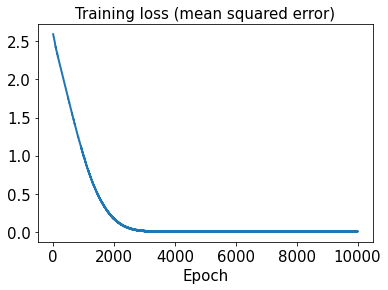

In [63]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

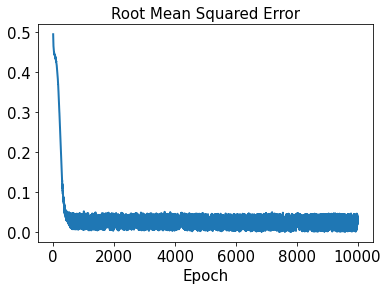

In [64]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [65]:
sd2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [66]:
start2 = datetime.datetime.now()
history2 = sd2.fit(x_train2, y_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 7ms/step - loss: 2.6628 - rmse: 1.6318
Epoch 2/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.6539 - rmse: 1.6291
Epoch 3/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.6457 - rmse: 1.6266
Epoch 4/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6376 - rmse: 1.6241
Epoch 5/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6294 - rmse: 1.6215
Epoch 6/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.6213 - rmse: 1.6191
Epoch 7/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6133 - rmse: 1.6166
Epoch 8/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6052 - rmse: 1.6141
Epoch 9/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.5971 - rmse: 1.6115
Epoch 10/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5889 - rmse: 1.6090
Epoch 11/10000
2/2 [=============================

2/2 [==============================] - 0s 10ms/step - loss: 2.0058 - rmse: 1.4162
Epoch 86/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9967 - rmse: 1.4130
Epoch 87/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9870 - rmse: 1.4095
Epoch 88/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9812 - rmse: 1.4075
Epoch 89/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9741 - rmse: 1.4050
Epoch 90/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9693 - rmse: 1.4033
Epoch 91/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9629 - rmse: 1.4010
Epoch 92/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9564 - rmse: 1.3987
Epoch 93/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9449 - rmse: 1.3945
Epoch 94/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9384 - rmse: 1.3922
Epoch 95/10000
2/2 [=========================

Epoch 169/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3839 - rmse: 1.1764
Epoch 170/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3756 - rmse: 1.1728
Epoch 171/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3691 - rmse: 1.1701
Epoch 172/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3668 - rmse: 1.1691
Epoch 173/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3548 - rmse: 1.1639
Epoch 174/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3508 - rmse: 1.1622
Epoch 175/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3369 - rmse: 1.1562
Epoch 176/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3290 - rmse: 1.1528
Epoch 177/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3280 - rmse: 1.1523
Epoch 178/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3133 - rmse: 1.1460
Epoch 179/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 0.8022 - rmse: 0.8956
Epoch 253/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7946 - rmse: 0.8913
Epoch 254/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7910 - rmse: 0.8894
Epoch 255/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7843 - rmse: 0.8855
Epoch 256/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7768 - rmse: 0.8813
Epoch 257/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7752 - rmse: 0.8804
Epoch 258/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7654 - rmse: 0.8748
Epoch 259/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7596 - rmse: 0.8715
Epoch 260/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7547 - rmse: 0.8687
Epoch 261/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7492 - rmse: 0.8655
Epoch 262/10000
2/2 [================

2/2 [==============================] - 0s 10ms/step - loss: 0.3960 - rmse: 0.6292
Epoch 336/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3917 - rmse: 0.6258
Epoch 337/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3930 - rmse: 0.6269
Epoch 338/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3877 - rmse: 0.6226
Epoch 339/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3808 - rmse: 0.6170
Epoch 340/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3779 - rmse: 0.6147
Epoch 341/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3759 - rmse: 0.6130
Epoch 342/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3695 - rmse: 0.6078
Epoch 343/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3677 - rmse: 0.6063
Epoch 344/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3622 - rmse: 0.6018
Epoch 345/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.1722 - rmse: 0.4149
Epoch 419/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1689 - rmse: 0.4109
Epoch 420/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1697 - rmse: 0.4119
Epoch 421/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1658 - rmse: 0.4070
Epoch 422/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1660 - rmse: 0.4074
Epoch 423/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1614 - rmse: 0.4016
Epoch 424/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1599 - rmse: 0.3997
Epoch 425/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1567 - rmse: 0.3957
Epoch 426/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1549 - rmse: 0.3935
Epoch 427/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1531 - rmse: 0.3912
Epoch 428/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0676 - rmse: 0.2598
Epoch 502/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0652 - rmse: 0.2552
Epoch 503/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0666 - rmse: 0.2580
Epoch 504/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0660 - rmse: 0.2568
Epoch 505/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0629 - rmse: 0.2507
Epoch 506/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0620 - rmse: 0.2489
Epoch 507/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0621 - rmse: 0.2491
Epoch 508/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0613 - rmse: 0.2474
Epoch 509/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0633 - rmse: 0.2516
Epoch 510/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0650 - rmse: 0.2549
Epoch 511/10000
2/2 [================

2/2 [==============================] - 0s 11ms/step - loss: 0.0317 - rmse: 0.1779
Epoch 585/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0276 - rmse: 0.1659
Epoch 586/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0248 - rmse: 0.1571
Epoch 587/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0243 - rmse: 0.1556
Epoch 588/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0273 - rmse: 0.1651
Epoch 589/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0244 - rmse: 0.1559
Epoch 590/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0234 - rmse: 0.1528
Epoch 591/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0273 - rmse: 0.1651
Epoch 592/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0229 - rmse: 0.1511
Epoch 593/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0225 - rmse: 0.1496
Epoch 594/10000
2/2 [===============

2/2 [==============================] - 0s 11ms/step - loss: 0.0129 - rmse: 0.1132
Epoch 668/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0935
Epoch 669/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0103 - rmse: 0.1010
Epoch 670/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0891
Epoch 671/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0133 - rmse: 0.1150
Epoch 672/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0144 - rmse: 0.1196
Epoch 673/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0096 - rmse: 0.0977
Epoch 674/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0129 - rmse: 0.1132
Epoch 675/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0141 - rmse: 0.1185
Epoch 676/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0127 - rmse: 0.1123
Epoch 677/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0529
Epoch 751/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 752/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 753/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 754/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 755/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 756/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0822
Epoch 757/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 758/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0707
Epoch 759/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 760/10000
2/2 [===============

2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 834/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 835/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 836/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0873
Epoch 837/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 838/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8826e-04 - rmse: 0.0289
Epoch 839/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0405
Epoch 840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 841/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0783
Epoch 842/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 843/10000
2/2 [===========

2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0349
Epoch 917/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 918/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 920/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 921/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0831
Epoch 922/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 923/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0625
Epoch 924/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5613e-04 - rmse: 0.0175
Epoch 925/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 926/10000
2/2 [===========

2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0881
Epoch 1000/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0695
Epoch 1001/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 1002/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 1003/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 1004/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 1005/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 1006/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0665
Epoch 1007/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 1008/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 1009/10000
2/2 [=====

Epoch 1081/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 1082/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 1083/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 1084/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 1085/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0550
Epoch 1086/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 1087/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0782
Epoch 1088/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 1089/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 1090/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 1091/1

2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 1163/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 1164/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 1165/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 1166/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 1167/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 1168/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 1169/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 1170/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8682e-04 - rmse: 0.0121
Epoch 1171/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 1172/10000
2/2 [=

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 1245/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 1246/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1271e-04 - rmse: 0.0165
Epoch 1247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0770
Epoch 1248/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 1249/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 1250/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 1251/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 1252/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 1253/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0770
Epoch 1254/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0350
Epoch 1328/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 1329/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 1330/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 1331/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 1332/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9863e-04 - rmse: 0.0215
Epoch 1333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 1334/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0749
Epoch 1335/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0757
Epoch 1336/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 1337/10000
2/2 [===========

2/2 [==============================] - 0s 16ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 1410/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 1411/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0493
Epoch 1412/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0632
Epoch 1413/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 1414/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0080 - rmse: 0.0892
Epoch 1415/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 1416/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.3178e-04 - rmse: 0.0244
Epoch 1417/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 1418/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0601
Epoch 1419/10000
2/2 [=

2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 1493/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0707
Epoch 1494/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 1495/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 1496/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0550
Epoch 1497/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 1498/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 1499/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 1500/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 1501/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 1502/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 1575/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 1576/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 1577/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9232e-04 - rmse: 0.0214
Epoch 1578/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 1579/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 1580/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.1946e-04 - rmse: 0.0298
Epoch 1581/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 1582/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 1583/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2508e-04 - rmse: 0.0171
Epoch 1584/10000

Epoch 1656/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6215e-04 - rmse: 0.0152
Epoch 1657/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 1658/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0349
Epoch 1659/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 1660/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 1661/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 1662/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4494e-04 - rmse: 0.0107
Epoch 1663/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 1664/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 1665/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0336
Epo

2/2 [==============================] - 0s 10ms/step - loss: 2.2804e-04 - rmse: 0.0141
Epoch 1739/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6602e-04 - rmse: 0.0306
Epoch 1740/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 1741/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 1742/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7062e-04 - rmse: 0.0307
Epoch 1743/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0576
Epoch 1744/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 1745/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2719e-04 - rmse: 0.0199
Epoch 1746/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 1747/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 1748/1

2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 1821/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 1822/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8197e-04 - rmse: 0.0235
Epoch 1823/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 1824/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 1825/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0202e-04 - rmse: 0.0259
Epoch 1826/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2419e-04 - rmse: 0.0244
Epoch 1827/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0472
Epoch 1828/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.4799e-04 - rmse: 0.0249
Epoch 1829/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 1830/

2/2 [==============================] - 0s 10ms/step - loss: 2.4018e-04 - rmse: 0.0146
Epoch 1903/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 1904/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 1905/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 1906/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 1907/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6203e-04 - rmse: 0.0116
Epoch 1908/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 1909/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 1910/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 1911/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 1912/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0886
Epoch 1985/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 1986/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 1987/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 1988/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 1989/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 1990/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0794
Epoch 1991/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 1992/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 1993/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0399e-04 - rmse: 0.0279
Epoch 1994/10000
2/2 [=

2/2 [==============================] - 0s 13ms/step - loss: 8.1238e-04 - rmse: 0.0280
Epoch 2067/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.9922e-04 - rmse: 0.0259
Epoch 2068/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0350
Epoch 2069/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 2070/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 2071/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 2072/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 2073/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 2074/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0917
Epoch 2075/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 2076/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 2150/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 2151/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0783
Epoch 2152/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 2153/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6143e-04 - rmse: 0.0116
Epoch 2154/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5780e-04 - rmse: 0.0208
Epoch 2155/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 2156/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 2157/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 2158/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9925e-04 - rmse: 0.0218
Epoch 2159/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 2232/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0296e-04 - rmse: 0.0088
Epoch 2233/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5135e-04 - rmse: 0.0112
Epoch 2234/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5200e-04 - rmse: 0.0113
Epoch 2235/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 2236/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8536e-04 - rmse: 0.0127
Epoch 2237/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 2238/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 2239/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 2240/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 2241/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0882
Epoch 2314/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0035 - rmse: 0.0587
Epoch 2315/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 2316/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0860
Epoch 2317/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0800
Epoch 2318/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 2319/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 2320/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8652e-04 - rmse: 0.0276
Epoch 2321/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6587e-04 - rmse: 0.0290
Epoch 2322/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 2323/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 2397/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0727
Epoch 2398/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 2399/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 2400/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 2401/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0693
Epoch 2402/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 2403/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 2404/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 2405/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 2406/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 1.6655e-04 - rmse: 0.0120
Epoch 2479/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 2480/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 2481/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 2482/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7998e-04 - rmse: 0.0125
Epoch 2483/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 2484/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 2485/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 2486/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 2487/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 2488/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 2561/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.4371e-04 - rmse: 0.0149
Epoch 2562/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 2563/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 2564/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 2565/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 2566/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 2567/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 2568/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 2569/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0391
Epoch 2570/10000
2/2 [======

2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0888
Epoch 2644/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 2645/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 2646/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 2647/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 2648/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.3123e-04 - rmse: 0.0226
Epoch 2649/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7626e-04 - rmse: 0.0235
Epoch 2650/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 2651/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 2652/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 2653/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 2726/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0933
Epoch 2727/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 2728/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0890
Epoch 2729/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 2730/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 2731/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 2732/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0908
Epoch 2733/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 2734/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 2735/10000
2/2 [======

2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 2809/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0750
Epoch 2810/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.6464e-04 - rmse: 0.0185
Epoch 2811/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 2812/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 2813/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4242e-04 - rmse: 0.0205
Epoch 2814/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.0579e-04 - rmse: 0.0220
Epoch 2815/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 2816/10000
2/2 [==============================] - ETA: 0s - loss: 8.4175e-04 - rmse: 0.02 - 0s 6ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 2817/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.388

2/2 [==============================] - 0s 10ms/step - loss: 2.7956e-04 - rmse: 0.0161
Epoch 2891/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 2892/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 2893/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 2894/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 2895/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4946e-04 - rmse: 0.0113
Epoch 2896/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 2897/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.5872e-05 - rmse: 0.0086
Epoch 2898/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3350e-04 - rmse: 0.0146
Epoch 2899/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 2900/

Epoch 2972/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2367e-04 - rmse: 0.0101
Epoch 2973/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0791
Epoch 2974/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 2975/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 2976/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.5121e-04 - rmse: 0.0230
Epoch 2977/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 2978/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9975e-04 - rmse: 0.0134
Epoch 2979/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5773e-04 - rmse: 0.0209
Epoch 2980/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 2981/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0

2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 3054/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 3055/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 3056/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.4765e-04 - rmse: 0.0270
Epoch 3057/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 3058/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 3059/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 3060/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 3061/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 3062/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 3063/10000
2/2 [=

2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 3136/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.9209e-04 - rmse: 0.0193
Epoch 3137/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 3138/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 3139/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.9371e-04 - rmse: 0.0239
Epoch 3140/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 3141/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 3142/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 3143/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 3144/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0694
Epoch 3145/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 3218/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 3219/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8533e-04 - rmse: 0.0129
Epoch 3220/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9222e-04 - rmse: 0.0131
Epoch 3221/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0806
Epoch 3222/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 3223/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0063 - rmse: 0.0794
Epoch 3224/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 3225/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2758e-04 - rmse: 0.0144
Epoch 3226/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2883e-04 - rmse: 0.0247
Epoch 3227/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 3300/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0870
Epoch 3301/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2526e-04 - rmse: 0.0246
Epoch 3302/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 3303/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 3304/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.2744e-04 - rmse: 0.0175
Epoch 3305/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0391
Epoch 3306/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 3307/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 3308/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 3309/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 3382/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5937e-04 - rmse: 0.0118
Epoch 3383/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0760
Epoch 3384/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 3385/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 3386/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0870
Epoch 3387/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 3388/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 3389/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 3390/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 3391/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 1.1740e-04 - rmse: 0.0099
Epoch 3464/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 3465/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 3466/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 3467/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 3468/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 3469/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.1850e-04 - rmse: 0.0141
Epoch 3470/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 3471/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 3472/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.3442e-04 - rmse: 0.0177
Epoch 3473/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 3546/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.5824e-04 - rmse: 0.0306
Epoch 3547/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0750
Epoch 3548/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0531
Epoch 3549/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 3550/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 3551/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 3552/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 3553/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 3554/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 3555/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 3628/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0862
Epoch 3629/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 3630/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0887
Epoch 3631/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 3632/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 3633/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 3634/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 3635/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 3636/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 3637/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 3710/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8741e-04 - rmse: 0.0238
Epoch 3711/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 3712/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0705
Epoch 3713/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3386e-04 - rmse: 0.0147
Epoch 3714/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 3715/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 3716/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0885
Epoch 3717/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 3718/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 3719/10000
2/2

2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 3792/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 3793/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0094 - rmse: 0.0969
Epoch 3794/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0085 - rmse: 0.0919
Epoch 3795/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 3796/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0714
Epoch 3797/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0658
Epoch 3798/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 3799/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 3800/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 3801/10000
2/2 [=====

Epoch 3873/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 3874/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 3875/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 3876/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0322
Epoch 3877/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 3878/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 3879/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0823
Epoch 3880/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 3881/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0761
Epoch 3882/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 3883/

2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 3956/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 3957/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 3958/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3702e-05 - rmse: 0.0081
Epoch 3959/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 3960/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 3961/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2942e-04 - rmse: 0.0176
Epoch 3962/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 3963/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 3964/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 3965/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 4037/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 4038/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 4039/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8869e-04 - rmse: 0.0295
Epoch 4040/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0040 - rmse: 0.0635
Epoch 4041/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0058 - rmse: 0.0761
Epoch 4042/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0839
Epoch 4043/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 4044/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0080 - rmse: 0.0894
Epoch 4045/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 4046/10000
2/2 [=

2/2 [==============================] - 0s 6ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 4119/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0065 - rmse: 0.0805
Epoch 4120/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 4121/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5306e-04 - rmse: 0.0306
Epoch 4122/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5825e-04 - rmse: 0.0210
Epoch 4123/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1788e-04 - rmse: 0.0200
Epoch 4124/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 4125/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 4126/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9893e-04 - rmse: 0.0195
Epoch 4127/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 4128/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 1.1165e-04 - rmse: 0.0097
Epoch 4201/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 4202/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 4203/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 4204/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 4205/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0366e-04 - rmse: 0.0196
Epoch 4206/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 4207/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 4208/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4221e-04 - rmse: 0.0150
Epoch 4209/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 4210/1000

2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 4283/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 4284/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1509e-04 - rmse: 0.0282
Epoch 4285/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 4286/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 4287/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 4288/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 4289/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.6772e-04 - rmse: 0.0212
Epoch 4290/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 4291/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 4292/10000
2/2 [======

2/2 [==============================] - 0s 7ms/step - loss: 6.6797e-04 - rmse: 0.0255
Epoch 4365/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 4366/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 4367/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0868
Epoch 4368/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0730
Epoch 4369/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 4370/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 4371/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 4372/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 4373/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 4374/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0051 - rmse: 0.0709
Epoch 4447/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.3688e-04 - rmse: 0.0268
Epoch 4448/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0707
Epoch 4449/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 4450/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.2920e-04 - rmse: 0.0226
Epoch 4451/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 4452/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 4453/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4208e-04 - rmse: 0.0150
Epoch 4454/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 4455/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7645e-04 - rmse: 0.0189
Epoch 4456/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0416
Epoch 4530/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0709
Epoch 4531/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 4532/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 4533/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0086 - rmse: 0.0925
Epoch 4534/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 4535/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0978
Epoch 4536/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 4537/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 4538/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 4539/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 4613/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 4614/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 4615/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 4616/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0855e-04 - rmse: 0.0138
Epoch 4617/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 4618/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4175e-04 - rmse: 0.0150
Epoch 4619/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3702e-04 - rmse: 0.0249
Epoch 4620/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.8565e-04 - rmse: 0.0216
Epoch 4621/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 4622/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 4696/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 4697/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 4698/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 4699/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 4700/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0451
Epoch 4701/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 4702/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 4703/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0681
Epoch 4704/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7339e-04 - rmse: 0.0256
Epoch 4705/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0694
Epoch 4778/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 4779/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 4780/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 4781/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 4782/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 4783/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 4784/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 4785/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.9553e-04 - rmse: 0.0167
Epoch 4786/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9235e-04 - rmse: 0.0166
Epoch 4787/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 1.2751e-04 - rmse: 0.0105
Epoch 4861/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3403e-04 - rmse: 0.0108
Epoch 4862/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 4863/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 4864/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9356e-04 - rmse: 0.0218
Epoch 4865/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 4866/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0994e-04 - rmse: 0.0282
Epoch 4867/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 4868/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 4869/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5479e-04 - rmse: 0.0117
Epoch 4870/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0861
Epoch 4943/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 4944/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 4945/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 4946/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 4947/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 4948/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0560
Epoch 4949/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 4950/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 4951/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 4952/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 5026/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0073 - rmse: 0.0854
Epoch 5027/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0074 - rmse: 0.0858
Epoch 5028/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0822
Epoch 5029/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0697
Epoch 5030/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0885
Epoch 5031/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 5032/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2538e-04 - rmse: 0.0284
Epoch 5033/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 5034/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0805
Epoch 5035/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 4.9667e-04 - rmse: 0.0219
Epoch 5108/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 5109/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 5110/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 5111/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 5112/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0868
Epoch 5113/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 5114/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 5115/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 5116/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 5117/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 5190/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 5191/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 5192/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0867
Epoch 5193/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 5194/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0859
Epoch 5195/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 5196/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 5197/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0666
Epoch 5198/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0062 - rmse: 0.0789
Epoch 5199/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 3.7617e-04 - rmse: 0.0190
Epoch 5273/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 5274/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1026e-04 - rmse: 0.0097
Epoch 5275/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1098e-05 - rmse: 0.0067
Epoch 5276/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 5277/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 5278/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4787e-04 - rmse: 0.0152
Epoch 5279/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6403e-04 - rmse: 0.0121
Epoch 5280/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 5281/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1947e-05 - rmse: 0.0087
Epoch 5282/10

2/2 [==============================] - 0s 9ms/step - loss: 3.3548e-04 - rmse: 0.0179
Epoch 5355/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.4636e-04 - rmse: 0.0182
Epoch 5356/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 5357/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 5358/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 5359/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 5360/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5559e-05 - rmse: 0.0089
Epoch 5361/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 5362/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2850e-04 - rmse: 0.0106
Epoch 5363/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 5364/10000
2/2 

2/2 [==============================] - 0s 13ms/step - loss: 2.5045e-04 - rmse: 0.0153
Epoch 5437/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.9945e-04 - rmse: 0.0241
Epoch 5438/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.6454e-04 - rmse: 0.0308
Epoch 5439/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7829e-04 - rmse: 0.0215
Epoch 5440/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0405
Epoch 5441/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.3799e-04 - rmse: 0.0287
Epoch 5442/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.6289e-04 - rmse: 0.0157
Epoch 5443/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2761e-04 - rmse: 0.0176
Epoch 5444/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 5445/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch

Epoch 5519/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 5520/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 5521/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 5522/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 5523/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0756
Epoch 5524/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 5525/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 5526/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 5527/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9060e-04 - rmse: 0.0260
Epoch 5528/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.1996e-05 - rmse: 0.0087
Epoch 5529/1

2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 5602/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 5603/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 5604/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0889
Epoch 5605/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2525e-04 - rmse: 0.0284
Epoch 5606/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 5607/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3390e-04 - rmse: 0.0178
Epoch 5608/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3239e-04 - rmse: 0.0248
Epoch 5609/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 5610/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6422e-04 - rmse: 0.0187
Epoch 5611/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 5684/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 5685/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6983e-04 - rmse: 0.0124
Epoch 5686/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 5687/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.9451e-04 - rmse: 0.0167
Epoch 5688/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 5689/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 5690/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 5691/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.0014e-04 - rmse: 0.0220
Epoch 5692/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0757
Epoch 5693/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 5767/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 5768/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0603
Epoch 5769/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 5770/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 5771/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6247e-04 - rmse: 0.0273
Epoch 5772/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 5773/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0934e-04 - rmse: 0.0139
Epoch 5774/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 5775/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 5776/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 3.4646e-04 - rmse: 0.0182
Epoch 5849/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 5850/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 5851/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0783
Epoch 5852/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 5853/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 5854/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 5855/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6638e-04 - rmse: 0.0123
Epoch 5856/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 5857/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2456e-04 - rmse: 0.0104
Epoch 5858/10000
2/2

2/2 [==============================] - 0s 6ms/step - loss: 2.3930e-04 - rmse: 0.0149
Epoch 5932/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.2531e-04 - rmse: 0.0176
Epoch 5933/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 5934/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 5935/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 5936/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0068 - rmse: 0.0827
Epoch 5937/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 5938/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 5939/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 5940/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7713e-05 - rmse: 0.0079
Epoch 5941/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 6014/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 6015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 6016/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 6017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 6018/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8747e-04 - rmse: 0.0165
Epoch 6019/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 6020/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6589e-04 - rmse: 0.0123
Epoch 6021/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 6022/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 6023/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 3.8087e-04 - rmse: 0.0191
Epoch 6097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 6098/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5039e-04 - rmse: 0.0183
Epoch 6099/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.1176e-04 - rmse: 0.0299
Epoch 6100/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9149e-04 - rmse: 0.0260
Epoch 6101/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.6711e-04 - rmse: 0.0188
Epoch 6102/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 6103/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 6104/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 6105/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8205e-04 - rmse: 0.0238
Epoch 6106/10

2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 6179/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3893e-04 - rmse: 0.0180
Epoch 6180/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0473
Epoch 6181/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 6182/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3114e-04 - rmse: 0.0108
Epoch 6183/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 6184/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1047e-04 - rmse: 0.0172
Epoch 6185/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 6186/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 6187/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6922e-04 - rmse: 0.0159
Epoch 6188/

2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 6261/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2626e-04 - rmse: 0.0105
Epoch 6262/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 6263/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 6264/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 6265/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 6266/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1652e-04 - rmse: 0.0265
Epoch 6267/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 6268/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1843e-04 - rmse: 0.0143
Epoch 6269/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 6270/1000

2/2 [==============================] - 0s 10ms/step - loss: 3.8165e-04 - rmse: 0.0191
Epoch 6342/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.2792e-05 - rmse: 0.0088
Epoch 6343/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 6344/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.3745e-04 - rmse: 0.0229
Epoch 6345/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.7588e-04 - rmse: 0.0215
Epoch 6346/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2447e-04 - rmse: 0.0105
Epoch 6347/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 6348/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 6349/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 6350/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 6

2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0542
Epoch 6424/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 6425/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 6426/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 6427/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.6519e-04 - rmse: 0.0308
Epoch 6428/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6737e-04 - rmse: 0.0309
Epoch 6429/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 6430/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 6431/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 6432/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 6433/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 8.2916e-04 - rmse: 0.0285
Epoch 6506/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0497
Epoch 6507/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0532
Epoch 6508/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9120e-04 - rmse: 0.0279
Epoch 6509/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0758
Epoch 6510/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4784e-04 - rmse: 0.0231
Epoch 6511/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0713
Epoch 6512/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0713
Epoch 6513/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.7002e-04 - rmse: 0.0236
Epoch 6514/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 6515/

2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0893
Epoch 6588/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 6589/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8832e-04 - rmse: 0.0193
Epoch 6590/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 6591/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7177e-04 - rmse: 0.0160
Epoch 6592/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1339e-04 - rmse: 0.0264
Epoch 6593/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 6594/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8899e-04 - rmse: 0.0132
Epoch 6595/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8761e-04 - rmse: 0.0165
Epoch 6596/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 6

2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0765
Epoch 6669/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 6670/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.3399e-04 - rmse: 0.0303
Epoch 6671/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 6672/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 6673/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0065 - rmse: 0.0804
Epoch 6674/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 6675/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 6676/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 6677/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 6678/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0586
Epoch 6751/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4943e-04 - rmse: 0.0252
Epoch 6752/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 6753/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 6754/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.3831e-04 - rmse: 0.0304
Epoch 6755/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0697
Epoch 6756/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0086 - rmse: 0.0925
Epoch 6757/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0493
Epoch 6758/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 6759/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0065 - rmse: 0.0806
Epoch 6760/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 6833/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 6834/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 6835/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 6836/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 6837/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3577e-04 - rmse: 0.0149
Epoch 6838/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6839/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4840e-04 - rmse: 0.0289
Epoch 6840/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 6841/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.4114e-04 - rmse: 0.0207
Epoch 6842/1000

2/2 [==============================] - 0s 11ms/step - loss: 6.7153e-04 - rmse: 0.0256
Epoch 6915/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3958e-04 - rmse: 0.0287
Epoch 6916/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.8250e-04 - rmse: 0.0216
Epoch 6917/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 6918/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 6919/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 6920/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6661e-04 - rmse: 0.0159
Epoch 6921/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 6922/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.9652e-04 - rmse: 0.0261
Epoch 6923/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 6

2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 6996/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 6997/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 6998/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 6999/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 7000/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 7001/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5984e-04 - rmse: 0.0308
Epoch 7002/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 7003/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3020e-04 - rmse: 0.0248
Epoch 7004/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0712
Epoch 7005/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 7077/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 7078/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 7079/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 7080/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 7081/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4801e-04 - rmse: 0.0153
Epoch 7082/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9869e-04 - rmse: 0.0242
Epoch 7083/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0408
Epoch 7084/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 7085/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6200e-04 - rmse: 0.0186
Epoch 7086/1000

2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 7159/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 7160/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 7161/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 7162/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.1330e-04 - rmse: 0.0283
Epoch 7163/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4154e-04 - rmse: 0.0250
Epoch 7164/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.2412e-04 - rmse: 0.0285
Epoch 7165/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 7166/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0907
Epoch 7167/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 7168/1000

2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 7241/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 7242/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 7243/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 7244/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0726
Epoch 7245/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 7246/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 7247/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 7248/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 7249/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 7250/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 7323/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 7324/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 7325/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 7326/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0788
Epoch 7327/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 7328/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 7329/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 7330/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 7331/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5815e-04 - rmse: 0.0156
Epoch 7332/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 7405/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0757
Epoch 7406/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0798
Epoch 7407/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 7408/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.5693e-04 - rmse: 0.0254
Epoch 7409/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.4730e-04 - rmse: 0.0252
Epoch 7410/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0850
Epoch 7411/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 7412/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 7413/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.2102e-04 - rmse: 0.0284
Epoch 7414/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 7487/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 7488/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 7489/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0062 - rmse: 0.0788
Epoch 7490/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.2539e-04 - rmse: 0.0226
Epoch 7491/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.4809e-04 - rmse: 0.0208
Epoch 7492/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0079 - rmse: 0.0887
Epoch 7493/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9787e-04 - rmse: 0.0136
Epoch 7494/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7495/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 7496/1000

Epoch 7568/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 7569/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4486e-04 - rmse: 0.0288
Epoch 7570/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 7571/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 7572/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 7573/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 7574/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 7575/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 7576/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 7577/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8708e-05 - rmse: 0.0067
Ep

2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 7651/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 7652/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0804
Epoch 7653/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0635
Epoch 7654/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 7655/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 7656/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 7657/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 7658/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 7659/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0848
Epoch 7660/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0076 - rmse: 0.0874
Epoch 7733/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 7734/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5931e-04 - rmse: 0.0121
Epoch 7735/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4410e-04 - rmse: 0.0251
Epoch 7736/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 7737/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 7738/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5514e-04 - rmse: 0.0119
Epoch 7739/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9449e-04 - rmse: 0.0135
Epoch 7740/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 7741/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 7742/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0688
Epoch 7815/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 7816/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 7817/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 7818/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 7819/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.6826e-04 - rmse: 0.0275
Epoch 7820/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 7821/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 7822/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 7823/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 7824/10000
2/2 [=

2/2 [==============================] - 0s 7ms/step - loss: 2.2236e-04 - rmse: 0.0145
Epoch 7897/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 7898/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6579e-04 - rmse: 0.0309
Epoch 7899/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0751
Epoch 7900/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2237e-04 - rmse: 0.0247
Epoch 7901/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6402e-04 - rmse: 0.0255
Epoch 7902/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 7903/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 7904/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 7905/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 7906/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 4.2246e-04 - rmse: 0.0202
Epoch 7979/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 7980/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 7981/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6278e-04 - rmse: 0.0158
Epoch 7982/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 7983/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 7984/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0731
Epoch 7985/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1603e-04 - rmse: 0.0283
Epoch 7986/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 7987/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7988/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 8061/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8062/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5659e-04 - rmse: 0.0254
Epoch 8063/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 8064/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 8065/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.9611e-04 - rmse: 0.0261
Epoch 8066/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 8067/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 8068/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 8069/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 8070/10000
2/

2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0766
Epoch 8143/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 8144/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5423e-04 - rmse: 0.0307
Epoch 8145/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 8146/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 8147/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 8148/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 8149/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 8150/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 8151/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 8152/10000
2/2 [==========

Epoch 8225/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 8226/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 8227/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 8228/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3681e-04 - rmse: 0.0250
Epoch 8229/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 8230/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 8231/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 8232/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 8233/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.6891e-04 - rmse: 0.0293
Epoch 8234/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0036e-04 - rmse: 0.0298


2/2 [==============================] - 0s 11ms/step - loss: 7.4456e-05 - rmse: 0.0078
Epoch 8307/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 8308/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 8309/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 8310/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4715e-04 - rmse: 0.0183
Epoch 8311/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2707e-05 - rmse: 0.0070
Epoch 8312/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0776
Epoch 8313/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 8314/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9044e-04 - rmse: 0.0240
Epoch 8315/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2210e-04 - rmse: 0.0104
Epoch 8

Epoch 8388/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0703
Epoch 8389/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 8390/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0091 - rmse: 0.0952
Epoch 8391/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 8392/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 8393/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 8394/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 8395/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 8396/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.6477e-04 - rmse: 0.0274
Epoch 8397/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0065 - rmse: 0.0805
Epoch 

2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 8471/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0729
Epoch 8472/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 8473/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 8474/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1268e-04 - rmse: 0.0100
Epoch 8475/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1066e-04 - rmse: 0.0099
Epoch 8476/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 8477/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 8478/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0521e-04 - rmse: 0.0096
Epoch 8479/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 8480/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0814
Epoch 8553/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 8554/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8890e-04 - rmse: 0.0279
Epoch 8555/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 8556/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 8557/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 8558/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 8559/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 8560/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 8561/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 8562/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 8635/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0733
Epoch 8636/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 8637/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 8638/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 8639/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 8640/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 8641/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 8642/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.3399e-04 - rmse: 0.0303
Epoch 8643/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 8644/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 5.4791e-04 - rmse: 0.0231
Epoch 8717/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 8718/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1687e-04 - rmse: 0.0201
Epoch 8719/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 8720/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 8721/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 8722/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 8723/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6244e-04 - rmse: 0.0234
Epoch 8724/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 8725/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.2879e-04 - rmse: 0.0227
Epoch 8726/

2/2 [==============================] - 0s 10ms/step - loss: 0.0065 - rmse: 0.0808
Epoch 8798/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0585
Epoch 8799/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 8800/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.3169e-04 - rmse: 0.0249
Epoch 8801/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 8802/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 8803/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 8804/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 8805/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 8806/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 8807/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 5.0140e-04 - rmse: 0.0221
Epoch 8880/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0857
Epoch 8881/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 8882/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 8883/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 8884/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 8885/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0072e-04 - rmse: 0.0221
Epoch 8886/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.3037e-04 - rmse: 0.0268
Epoch 8887/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 8888/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 8889/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 8962/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 8963/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 8964/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0761
Epoch 8965/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0796
Epoch 8966/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 8967/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 8968/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 8969/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 8970/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 8971/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 9044/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0801
Epoch 9045/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0890
Epoch 9046/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 9047/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 9048/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0776
Epoch 9049/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 9050/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 9051/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0695
Epoch 9052/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0729
Epoch 9053/10000
2/2 [=====

2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 9126/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 9127/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 9128/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0797
Epoch 9129/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 9130/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 9131/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 9132/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2138e-04 - rmse: 0.0202
Epoch 9133/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.6645e-04 - rmse: 0.0235
Epoch 9134/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 9135/10000
2/2 [=

2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 9208/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0821
Epoch 9209/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 9210/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0634
Epoch 9211/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 9212/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 9213/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.7419e-04 - rmse: 0.0310
Epoch 9214/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 9215/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 9216/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 9217/10000
2/2 [=========

2/2 [==============================] - 0s 7ms/step - loss: 1.3204e-04 - rmse: 0.0109
Epoch 9291/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 9292/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 9293/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 9294/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5814e-04 - rmse: 0.0291
Epoch 9295/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 9296/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 9297/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 9298/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 9299/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 9300/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0814
Epoch 9373/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5551e-04 - rmse: 0.0233
Epoch 9374/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 9375/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 9376/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 9377/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 9378/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 9379/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 9380/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 9381/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 9382/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 8.5430e-04 - rmse: 0.0290
Epoch 9455/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 9456/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 9457/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 9458/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 9459/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 9460/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.6956e-04 - rmse: 0.0275
Epoch 9461/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.9510e-04 - rmse: 0.0241
Epoch 9462/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.5365e-04 - rmse: 0.0185
Epoch 9463/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2775e-04 - rmse: 0.0204
Epoch 9

2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 9537/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0524
Epoch 9538/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 9539/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9695e-04 - rmse: 0.0220
Epoch 9540/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0859
Epoch 9541/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0416
Epoch 9542/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0352
Epoch 9543/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 9544/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0801
Epoch 9545/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 9546/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 9619/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 9620/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 9621/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 9622/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0749
Epoch 9623/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 9624/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 9625/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 9626/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 9627/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 9628/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 9701/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6560e-04 - rmse: 0.0235
Epoch 9702/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 9703/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0791
Epoch 9704/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6060e-04 - rmse: 0.0255
Epoch 9705/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.3363e-04 - rmse: 0.0228
Epoch 9706/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0757
Epoch 9707/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.0499e-04 - rmse: 0.0171
Epoch 9708/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2979e-04 - rmse: 0.0204
Epoch 9709/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7280e-04 - rmse: 0.0310
Epo

2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 9783/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9784/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5582e-04 - rmse: 0.0156
Epoch 9785/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3549e-04 - rmse: 0.0149
Epoch 9786/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 9787/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 9788/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0634
Epoch 9789/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 9790/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0040 - rmse: 0.0635
Epoch 9791/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 9792/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 9864/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 9865/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 9866/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0733
Epoch 9867/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5693e-04 - rmse: 0.0273
Epoch 9868/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 9869/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 9870/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 9871/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 9872/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 9873/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 4.2946e-04 - rmse: 0.0204
Epoch 9946/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 9947/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 9948/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 9949/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5693e-04 - rmse: 0.0156
Epoch 9950/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 9951/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0700
Epoch 9952/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.5273e-04 - rmse: 0.0272
Epoch 9953/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0798
Epoch 9954/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 9955/1000

In [67]:
time2 = end2 - start2
print("Training time (Case 2):", time2)

Training time (Case 2): 0:03:28.509320


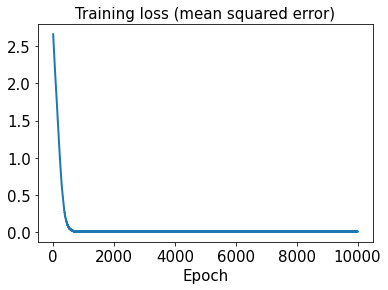

In [68]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

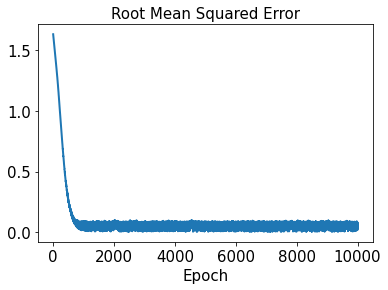

In [69]:
plt.plot(hist2['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [70]:
test_results2 = sd2.evaluate(x_test2)

1/1 [==============================] - 0s 81ms/step - loss: 1.2786e-05 - rmse: 0.0000e+00


In [71]:
decoded_sensor_train2 = sensor_pred2.predict(t_train)

In [72]:
decoded_sensor_test2 = sensor_pred2.predict(t_test)

In [73]:
decoded_train2 = sd2.predict(decoded_sensor_train2)

In [74]:
decoded_test2 = sd2.predict(decoded_sensor_test2)

In [75]:
error_train_abs2 = np.abs(decoded_train2 - y_train2)

In [76]:
error_test_abs2 = np.abs(decoded_test2 - y_test2)

In [77]:
l2_error_train2 = np.sqrt(np.sum((decoded_train2 - y_train2)**2) / np.sum(y_train2**2))
print(l2_error_train2)

0.18703949464410732


In [78]:
l2_error_test2 = np.sqrt(np.sum((decoded_test2 - y_test2)**2) / np.sum(y_test2**2))
print(l2_error_test2)

0.19786433794594463


In [79]:
l2_error_train_list2 = []
for i in range(0, len(x_train2)):
    l2_error_train_data2 = np.sqrt(np.sum((decoded_train2[i] - y_train2[i])**2) / np.sum(y_train2[i]**2))
    l2_error_train_list2.append(l2_error_train_data2)
print(l2_error_train_list2)

[0.16588869395076417, 0.2609408035321988, 0.11857198194251098, 0.1514862499999607, 0.04821057898563326, 0.2195009504970611, 0.0893869326205322, 0.1948517225044565, 0.0685842264368479, 0.2181834153989517, 0.2106319931272115, 0.34300402998203483, 0.13435456924516878, 0.2739847380926221, 0.17244695407866015, 0.32916355136364195, 0.17729623760590835, 0.028606255649398504, 0.31587308399546005, 0.18650878134446963, 0.23507148585969465, 0.3016304473271678, 0.2260403350023904, 0.06809842430339201, 0.2028841758487837, 0.19420989254825485, 0.048848239030906314, 0.033495155050498694, 0.007626177435174571, 0.24838106567478, 0.11027667591132466, 0.14998915734580137, 0.2429138255892215]


In [80]:
l2_error_test_list2 = []
for i in range(0, len(x_test2)):
    l2_error_test_data2 = np.sqrt(np.sum((decoded_test2[i] - y_test2[i])**2) / np.sum(y_test2[i]**2))
    l2_error_test_list2.append(l2_error_test_data2)
print(l2_error_test_list2)

[0.08587268830384531, 0.13045159391740924, 0.23628103463690633, 0.10253189091901956, 0.2875385634599492, 0.25961124166775124, 0.017484622453839867, 0.25059401065706455]


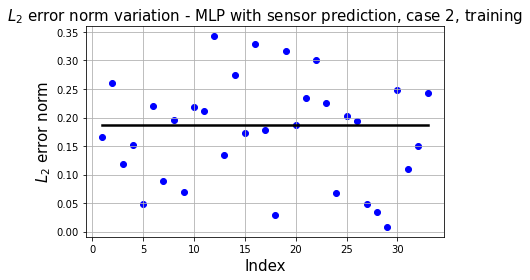

In [81]:
plt.plot(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train2*np.ones(x_train2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

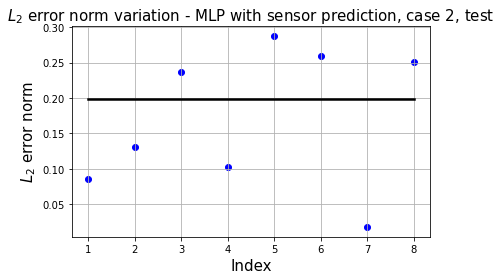

In [82]:
plt.plot(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test2*np.ones(x_test2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

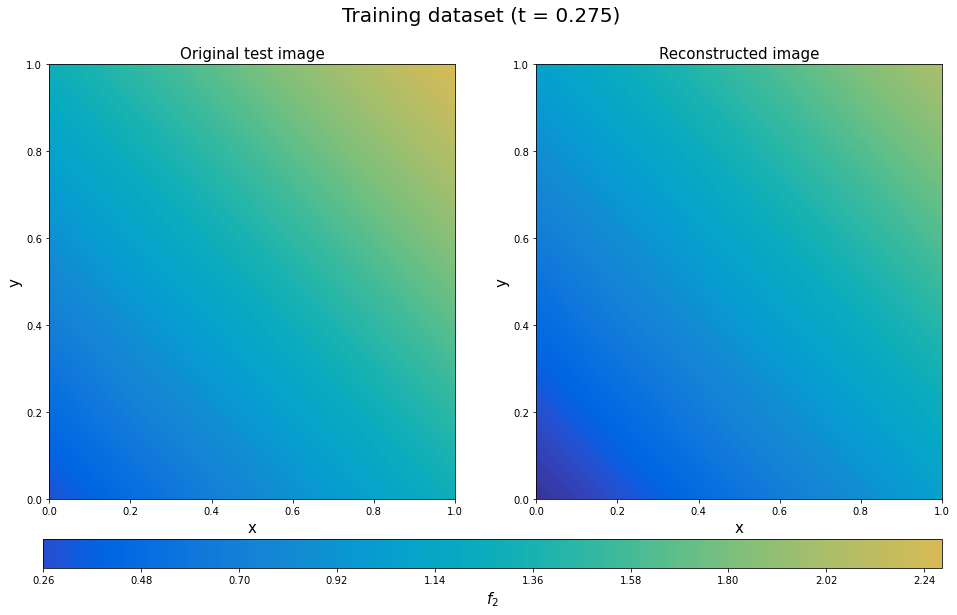

In [83]:
plt.figure(figsize=(16, 8))
y_train2_14_rotate = y_train2[14].T.reshape(101,101)
decoded_rotate2 = decoded_train2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_14_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[11]),fontsize=20)
plt.show()

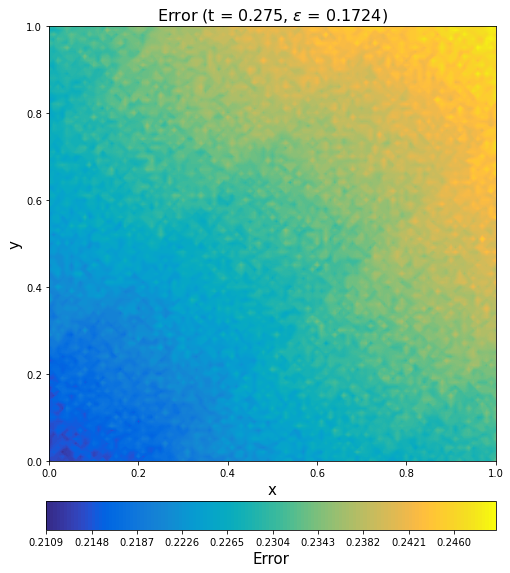

In [84]:
error_train_abs2_rotate14 = error_train_abs2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate14, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.275, $\epsilon$ = %.4f)' %(l2_error_train_list2[14]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

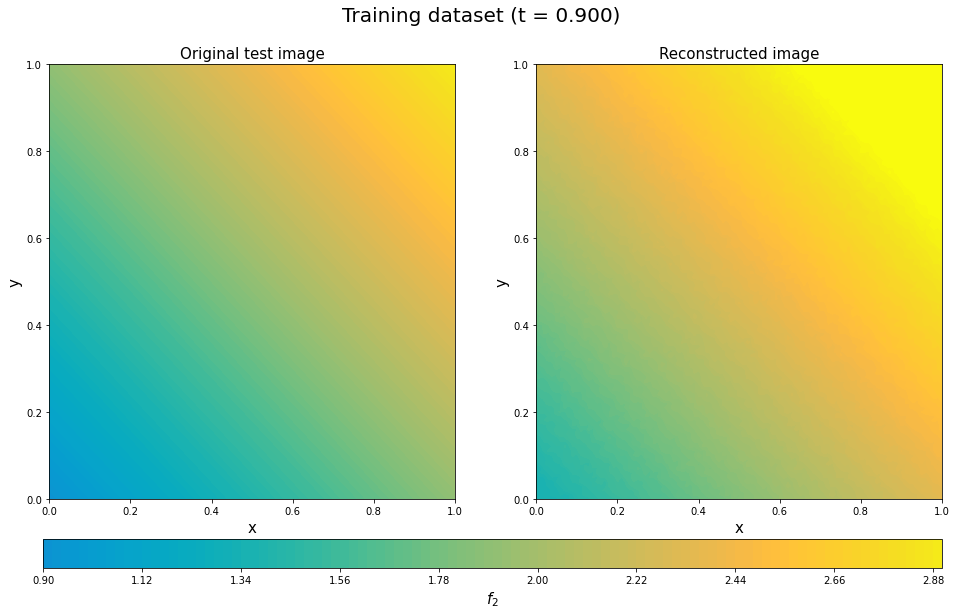

In [85]:
plt.figure(figsize=(16, 8))
y_train2_22_rotate = y_train2[22].T.reshape(101,101)
decoded_rotate2 = decoded_train2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_22_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[36]), fontsize=20)
plt.show()

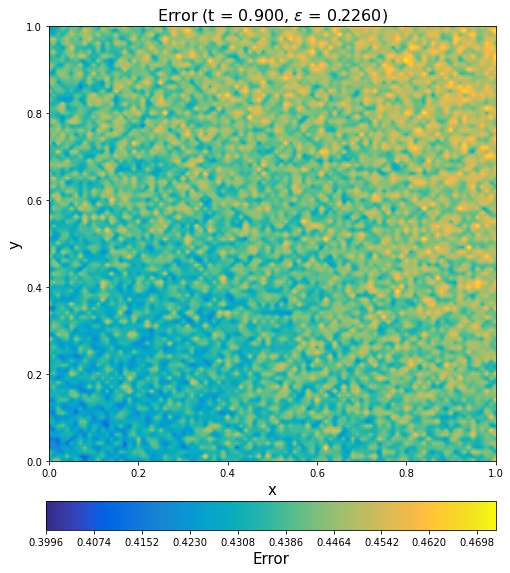

In [86]:
error_train_abs2_rotate22 = error_train_abs2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate22, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.900, $\epsilon$ = %.4f)' %(l2_error_train_list2[22]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

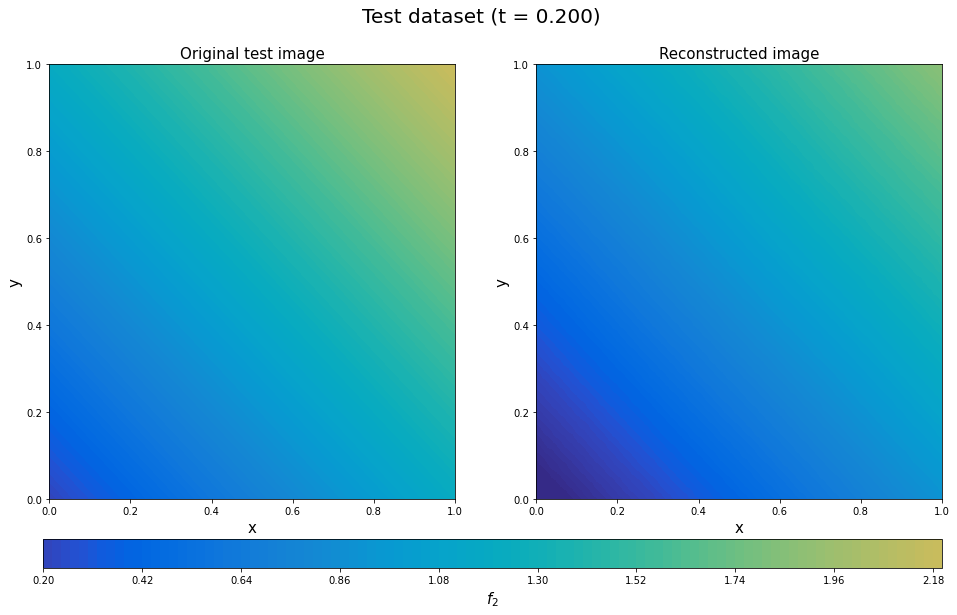

In [87]:
plt.figure(figsize=(16, 8))
y_test2_2_rotate = y_test2[2].T.reshape(101,101)
decoded_rotate2 = decoded_test2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

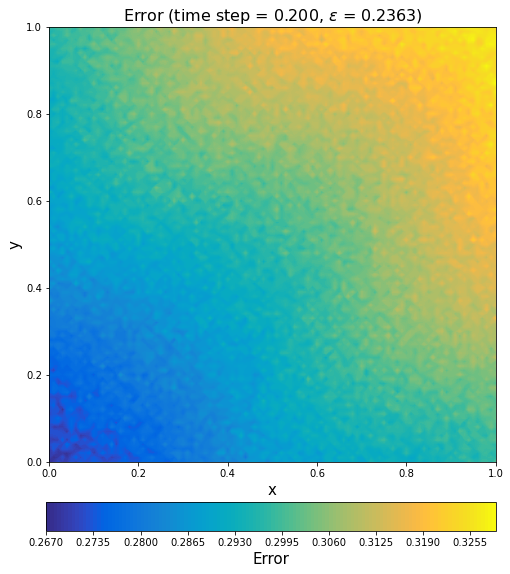

In [88]:
error_test_abs2_rotate2 = error_test_abs2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (time step = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list2[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

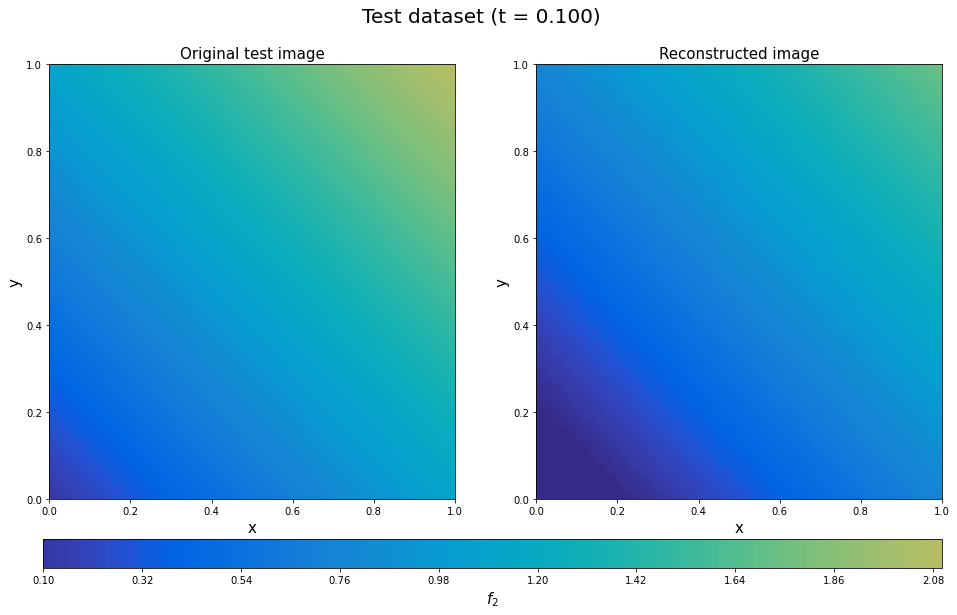

In [89]:
plt.figure(figsize=(16, 8))
y_test2_4_rotate = y_test2[4].T.reshape(101,101)
decoded_rotate2 = decoded_test2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_4_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[4]),fontsize=20)
plt.show()

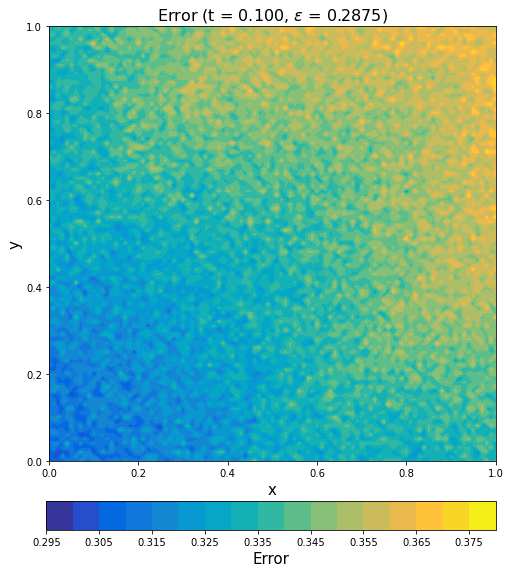

In [90]:
error_test_abs2_rotate4 = error_test_abs2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate4, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.100, $\epsilon$ = %.4f)' %(l2_error_test_list2[4]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 3: f3

In [91]:
out3 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out3[i, j, k] = np.exp(-t[i])*(2*np.sin(2*np.pi*x[j]) + np.sin(2*np.pi*x[j])*np.cos(2*np.pi*y[k]))

In [92]:
sensor3 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor3[i, j, k] = out3[i, 20*(j+1)+1, 20*(k+1)+1]

In [93]:
sensor3 = sensor3.reshape((41, 16, 1))

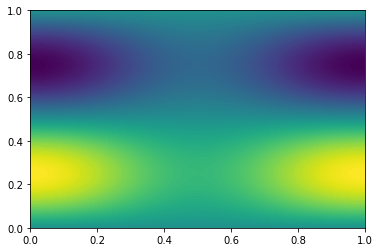

In [94]:
plt.contourf(xmesh, ymesh, out3[0,:,:], levels=128)

In [95]:
x_train3, x_test3, y_train3, y_test3, t_train, t_test = train_test_split(sensor3, out3, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [96]:
x_test3

array([[[ 1.19533543],
        [ 0.61432027],
        [ 0.65355792],
        [ 1.25882328],
        [ 0.66126769],
        [ 0.33984615],
        [ 0.36155269],
        [ 0.6963896 ],
        [-0.78664952],
        [-0.4042838 ],
        [-0.43010607],
        [-0.82843084],
        [-1.14744383],
        [-0.58970728],
        [-0.62737286],
        [-1.20838802]],

       [[ 1.57369576],
        [ 0.80877148],
        [ 0.86042905],
        [ 1.65727946],
        [ 0.8705792 ],
        [ 0.44741788],
        [ 0.4759952 ],
        [ 0.91681827],
        [-1.03564822],
        [-0.53225202],
        [-0.56624783],
        [-1.09065461],
        [-1.510645  ],
        [-0.77636772],
        [-0.82595561],
        [-1.59087989]],

       [[ 1.78323092],
        [ 0.91645815],
        [ 0.97499384],
        [ 1.87794366],
        [ 0.98649548],
        [ 0.50699088],
        [ 0.53937323],
        [ 1.03889121],
        [-1.17354318],
        [-0.60312055],
        [-0.64164286],
       

In [97]:
sensor_pred3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [98]:
start3 = datetime.datetime.now()
history3 = sensor_pred3.fit(t_train, x_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 13ms/step - loss: 3.8532 - rmse: 1.9629
Epoch 2/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8475 - rmse: 1.9615
Epoch 3/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8416 - rmse: 1.9600
Epoch 4/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8357 - rmse: 1.9585
Epoch 5/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8300 - rmse: 1.9570
Epoch 6/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8242 - rmse: 1.9555
Epoch 7/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8183 - rmse: 1.9540
Epoch 8/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8124 - rmse: 1.9525
Epoch 9/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8065 - rmse: 1.9510
Epoch 10/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8005 - rmse: 1.9495
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 11ms/step - loss: 3.4204 - rmse: 1.8494
Epoch 86/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4175 - rmse: 1.8486
Epoch 87/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4126 - rmse: 1.8473
Epoch 88/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4077 - rmse: 1.8460
Epoch 89/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4038 - rmse: 1.8449
Epoch 90/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4002 - rmse: 1.8439
Epoch 91/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.3961 - rmse: 1.8428
Epoch 92/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.3935 - rmse: 1.8421
Epoch 93/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3891 - rmse: 1.8409
Epoch 94/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3855 - rmse: 1.8400
Epoch 95/10000
2/2 [=========================

2/2 [==============================] - 0s 11ms/step - loss: 3.1203 - rmse: 1.7664
Epoch 169/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1190 - rmse: 1.7661
Epoch 170/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1133 - rmse: 1.7644
Epoch 171/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1111 - rmse: 1.7638
Epoch 172/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1071 - rmse: 1.7627
Epoch 173/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1044 - rmse: 1.7619
Epoch 174/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1010 - rmse: 1.7609
Epoch 175/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.0965 - rmse: 1.7597
Epoch 176/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.0931 - rmse: 1.7587
Epoch 177/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.0907 - rmse: 1.7580
Epoch 178/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 2.8570 - rmse: 1.6902
Epoch 252/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8533 - rmse: 1.6892
Epoch 253/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8510 - rmse: 1.6885
Epoch 254/10000
2/2 [==============================] - 0s 19ms/step - loss: 2.8473 - rmse: 1.6874
Epoch 255/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.8440 - rmse: 1.6864
Epoch 256/10000
2/2 [==============================] - 0s 18ms/step - loss: 2.8411 - rmse: 1.6855
Epoch 257/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.8390 - rmse: 1.6849
Epoch 258/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.8352 - rmse: 1.6838
Epoch 259/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8330 - rmse: 1.6831
Epoch 260/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8311 - rmse: 1.6826
Epoch 261/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 2.6217 - rmse: 1.6191
Epoch 335/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6181 - rmse: 1.6180
Epoch 336/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6184 - rmse: 1.6181
Epoch 337/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.6132 - rmse: 1.6165
Epoch 338/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6112 - rmse: 1.6159
Epoch 339/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6077 - rmse: 1.6148
Epoch 340/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6048 - rmse: 1.6139
Epoch 341/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6023 - rmse: 1.6131
Epoch 342/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.6004 - rmse: 1.6126
Epoch 343/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5982 - rmse: 1.6119
Epoch 344/10000
2/2 [===============

2/2 [==============================] - 0s 11ms/step - loss: 2.4115 - rmse: 1.5529
Epoch 418/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4088 - rmse: 1.5520
Epoch 419/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.4085 - rmse: 1.5519
Epoch 420/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4053 - rmse: 1.5509
Epoch 421/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4009 - rmse: 1.5494
Epoch 422/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3987 - rmse: 1.5488
Epoch 423/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.3960 - rmse: 1.5479
Epoch 424/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.3941 - rmse: 1.5473
Epoch 425/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.3914 - rmse: 1.5464
Epoch 426/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.3887 - rmse: 1.5455
Epoch 427/10000
2/2 [===============

2/2 [==============================] - 0s 11ms/step - loss: 2.2217 - rmse: 1.4905
Epoch 501/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2191 - rmse: 1.4896
Epoch 502/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.2169 - rmse: 1.4889
Epoch 503/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2172 - rmse: 1.4890
Epoch 504/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2134 - rmse: 1.4877
Epoch 505/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2114 - rmse: 1.4871
Epoch 506/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.2083 - rmse: 1.4860
Epoch 507/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2076 - rmse: 1.4858
Epoch 508/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2049 - rmse: 1.4849
Epoch 509/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.2026 - rmse: 1.4841
Epoch 510/10000
2/2 [===============

2/2 [==============================] - 0s 11ms/step - loss: 2.0519 - rmse: 1.4324
Epoch 584/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0515 - rmse: 1.4323
Epoch 585/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0471 - rmse: 1.4307
Epoch 586/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0462 - rmse: 1.4304
Epoch 587/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0444 - rmse: 1.4298
Epoch 588/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0414 - rmse: 1.4288
Epoch 589/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0397 - rmse: 1.4282
Epoch 590/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0372 - rmse: 1.4273
Epoch 591/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0363 - rmse: 1.4270
Epoch 592/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0345 - rmse: 1.4263
Epoch 593/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 1.8962 - rmse: 1.3770
Epoch 667/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8948 - rmse: 1.3765
Epoch 668/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8905 - rmse: 1.3749
Epoch 669/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8901 - rmse: 1.3748
Epoch 670/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8882 - rmse: 1.3741
Epoch 671/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8850 - rmse: 1.3729
Epoch 672/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8831 - rmse: 1.3722
Epoch 673/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8814 - rmse: 1.3716
Epoch 674/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.8811 - rmse: 1.3715
Epoch 675/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.8784 - rmse: 1.3705
Epoch 676/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 1.7502 - rmse: 1.3229
Epoch 751/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7492 - rmse: 1.3225
Epoch 752/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7471 - rmse: 1.3217
Epoch 753/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7444 - rmse: 1.3207
Epoch 754/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7442 - rmse: 1.3207
Epoch 755/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7412 - rmse: 1.3195
Epoch 756/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7395 - rmse: 1.3189
Epoch 757/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7380 - rmse: 1.3183
Epoch 758/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7379 - rmse: 1.3183
Epoch 759/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7363 - rmse: 1.3177
Epoch 760/10000
2/2 [======================

2/2 [==============================] - 0s 14ms/step - loss: 1.6203 - rmse: 1.2729
Epoch 834/10000
2/2 [==============================] - 0s 17ms/step - loss: 1.6180 - rmse: 1.2720
Epoch 835/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.6174 - rmse: 1.2717
Epoch 836/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6152 - rmse: 1.2709
Epoch 837/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6142 - rmse: 1.2705
Epoch 838/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.6127 - rmse: 1.2699
Epoch 839/10000
2/2 [==============================] - 0s 19ms/step - loss: 1.6105 - rmse: 1.2690
Epoch 840/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6122 - rmse: 1.2697
Epoch 841/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.6074 - rmse: 1.2678
Epoch 842/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6063 - rmse: 1.2673
Epoch 843/10000
2/2 [===============

2/2 [==============================] - 0s 11ms/step - loss: 1.4996 - rmse: 1.2245
Epoch 917/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4984 - rmse: 1.2240
Epoch 918/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4968 - rmse: 1.2234
Epoch 919/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4950 - rmse: 1.2227
Epoch 920/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.4948 - rmse: 1.2226
Epoch 921/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4922 - rmse: 1.2215
Epoch 922/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4920 - rmse: 1.2214
Epoch 923/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4902 - rmse: 1.2207
Epoch 924/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4900 - rmse: 1.2206
Epoch 925/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.4872 - rmse: 1.2195
Epoch 926/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 1.3906 - rmse: 1.1792
Epoch 1000/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3915 - rmse: 1.1796
Epoch 1001/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3868 - rmse: 1.1776
Epoch 1002/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3870 - rmse: 1.1777
Epoch 1003/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3856 - rmse: 1.1771
Epoch 1004/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3830 - rmse: 1.1760
Epoch 1005/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3826 - rmse: 1.1758
Epoch 1006/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3824 - rmse: 1.1757
Epoch 1007/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3800 - rmse: 1.1747
Epoch 1008/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.3793 - rmse: 1.1744
Epoch 1009/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 1.2906 - rmse: 1.1360
Epoch 1082/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2885 - rmse: 1.1351
Epoch 1083/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2870 - rmse: 1.1344
Epoch 1084/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2867 - rmse: 1.1343
Epoch 1085/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.2860 - rmse: 1.1340
Epoch 1086/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2828 - rmse: 1.1326
Epoch 1087/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.2853 - rmse: 1.1337
Epoch 1088/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2818 - rmse: 1.1321
Epoch 1089/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2799 - rmse: 1.1313
Epoch 1090/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2795 - rmse: 1.1311
Epoch 1091/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 1.1999 - rmse: 1.0953
Epoch 1164/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1951 - rmse: 1.0932
Epoch 1165/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1948 - rmse: 1.0930
Epoch 1166/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1944 - rmse: 1.0928
Epoch 1167/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1954 - rmse: 1.0933
Epoch 1168/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1906 - rmse: 1.0911
Epoch 1169/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1914 - rmse: 1.0915
Epoch 1170/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1894 - rmse: 1.0905
Epoch 1171/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1874 - rmse: 1.0896
Epoch 1172/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1880 - rmse: 1.0899
Epoch 1173/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 1.1090 - rmse: 1.0530
Epoch 1246/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1088 - rmse: 1.0529
Epoch 1247/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1070 - rmse: 1.0521
Epoch 1248/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1062 - rmse: 1.0517
Epoch 1249/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1059 - rmse: 1.0516
Epoch 1250/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1038 - rmse: 1.0506
Epoch 1251/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1046 - rmse: 1.0510
Epoch 1252/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1032 - rmse: 1.0503
Epoch 1253/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1012 - rmse: 1.0493
Epoch 1254/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1000 - rmse: 1.0488
Epoch 1255/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 1.0296 - rmse: 1.0146
Epoch 1328/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0287 - rmse: 1.0142
Epoch 1329/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0282 - rmse: 1.0139
Epoch 1330/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0287 - rmse: 1.0142
Epoch 1331/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0261 - rmse: 1.0129
Epoch 1332/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0254 - rmse: 1.0126
Epoch 1333/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0253 - rmse: 1.0125
Epoch 1334/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0237 - rmse: 1.0117
Epoch 1335/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.0224 - rmse: 1.0111
Epoch 1336/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0249 - rmse: 1.0123
Epoch 1337/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.9567 - rmse: 0.9781
Epoch 1410/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.9561 - rmse: 0.9778
Epoch 1411/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.9550 - rmse: 0.9772
Epoch 1412/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.9549 - rmse: 0.9772
Epoch 1413/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9535 - rmse: 0.9764
Epoch 1414/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.9546 - rmse: 0.9770
Epoch 1415/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.9519 - rmse: 0.9756
Epoch 1416/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.9510 - rmse: 0.9751
Epoch 1417/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.9520 - rmse: 0.9757
Epoch 1418/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.9512 - rmse: 0.9752
Epoch 1419/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.8866 - rmse: 0.9416
Epoch 1492/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8862 - rmse: 0.9413
Epoch 1493/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8869 - rmse: 0.9417
Epoch 1494/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8847 - rmse: 0.9405
Epoch 1495/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8856 - rmse: 0.9410
Epoch 1496/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8835 - rmse: 0.9399
Epoch 1497/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8819 - rmse: 0.9391
Epoch 1498/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8819 - rmse: 0.9391
Epoch 1499/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8802 - rmse: 0.9381
Epoch 1500/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8844 - rmse: 0.9404
Epoch 1501/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.8230 - rmse: 0.9071
Epoch 1574/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8216 - rmse: 0.9064
Epoch 1575/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8213 - rmse: 0.9062
Epoch 1576/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8200 - rmse: 0.9055
Epoch 1577/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8202 - rmse: 0.9056
Epoch 1578/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8190 - rmse: 0.9050
Epoch 1579/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8223 - rmse: 0.9067
Epoch 1580/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8171 - rmse: 0.9039
Epoch 1581/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8173 - rmse: 0.9040
Epoch 1582/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8169 - rmse: 0.9038
Epoch 1583/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.7634 - rmse: 0.8736
Epoch 1656/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7618 - rmse: 0.8727
Epoch 1657/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7618 - rmse: 0.8727
Epoch 1658/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7599 - rmse: 0.8717
Epoch 1659/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7609 - rmse: 0.8722
Epoch 1660/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7585 - rmse: 0.8709
Epoch 1661/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7595 - rmse: 0.8715
Epoch 1662/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7577 - rmse: 0.8704
Epoch 1663/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7564 - rmse: 0.8697
Epoch 1664/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7557 - rmse: 0.8693
Epoch 1665/10000
2/2 [=====

Epoch 1738/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7050 - rmse: 0.8396
Epoch 1739/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7064 - rmse: 0.8404
Epoch 1740/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7062 - rmse: 0.8403
Epoch 1741/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7035 - rmse: 0.8387
Epoch 1742/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7030 - rmse: 0.8384
Epoch 1743/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7028 - rmse: 0.8382
Epoch 1744/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7016 - rmse: 0.8376
Epoch 1745/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7004 - rmse: 0.8368
Epoch 1746/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7003 - rmse: 0.8368
Epoch 1747/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7007 - rmse: 0.8370
Epoch 1748

2/2 [==============================] - 0s 10ms/step - loss: 0.6585 - rmse: 0.8114
Epoch 1821/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6538 - rmse: 0.8085
Epoch 1822/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6525 - rmse: 0.8077
Epoch 1823/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6527 - rmse: 0.8079
Epoch 1824/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6502 - rmse: 0.8063
Epoch 1825/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6521 - rmse: 0.8075
Epoch 1826/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6503 - rmse: 0.8064
Epoch 1827/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6490 - rmse: 0.8055
Epoch 1828/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6491 - rmse: 0.8056
Epoch 1829/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6480 - rmse: 0.8049
Epoch 1830/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.6071 - rmse: 0.7791
Epoch 1903/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6039 - rmse: 0.7770
Epoch 1904/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6032 - rmse: 0.7766
Epoch 1905/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6048 - rmse: 0.7776
Epoch 1906/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6034 - rmse: 0.7767
Epoch 1907/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6021 - rmse: 0.7759
Epoch 1908/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6021 - rmse: 0.7759
Epoch 1909/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6020 - rmse: 0.7758
Epoch 1910/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5997 - rmse: 0.7743
Epoch 1911/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5992 - rmse: 0.7740
Epoch 1912/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.5583 - rmse: 0.7471
Epoch 1985/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5595 - rmse: 0.7479
Epoch 1986/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.5572 - rmse: 0.7464
Epoch 1987/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5567 - rmse: 0.7460
Epoch 1988/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5570 - rmse: 0.7463
Epoch 1989/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5572 - rmse: 0.7464
Epoch 1990/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5573 - rmse: 0.7464
Epoch 1991/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5563 - rmse: 0.7458
Epoch 1992/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5539 - rmse: 0.7442
Epoch 1993/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5586 - rmse: 0.7474
Epoch 1994/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.5144 - rmse: 0.7172
Epoch 2067/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5167 - rmse: 0.7187
Epoch 2068/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5152 - rmse: 0.7177
Epoch 2069/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5182 - rmse: 0.7198
Epoch 2070/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5169 - rmse: 0.7189
Epoch 2071/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5143 - rmse: 0.7171
Epoch 2072/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5115 - rmse: 0.7151
Epoch 2073/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5114 - rmse: 0.7150
Epoch 2074/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5114 - rmse: 0.7150
Epoch 2075/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5103 - rmse: 0.7143
Epoch 2076/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.4734 - rmse: 0.6880
Epoch 2149/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4730 - rmse: 0.6877
Epoch 2150/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4743 - rmse: 0.6887
Epoch 2151/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4732 - rmse: 0.6878
Epoch 2152/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4713 - rmse: 0.6864
Epoch 2153/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.4757 - rmse: 0.6896
Epoch 2154/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4760 - rmse: 0.6899
Epoch 2155/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4713 - rmse: 0.6864
Epoch 2156/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4699 - rmse: 0.6854
Epoch 2157/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.4695 - rmse: 0.6851
Epoch 2158/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.4410 - rmse: 0.6640
Epoch 2231/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4340 - rmse: 0.6587
Epoch 2232/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4336 - rmse: 0.6584
Epoch 2233/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4333 - rmse: 0.6582
Epoch 2234/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4333 - rmse: 0.6582
Epoch 2235/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4329 - rmse: 0.6579
Epoch 2236/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4316 - rmse: 0.6569
Epoch 2237/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4327 - rmse: 0.6577
Epoch 2238/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4319 - rmse: 0.6571
Epoch 2239/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4311 - rmse: 0.6565
Epoch 2240/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.3985 - rmse: 0.6312
Epoch 2313/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.4049 - rmse: 0.6362
Epoch 2314/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4007 - rmse: 0.6329
Epoch 2315/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4015 - rmse: 0.6336
Epoch 2316/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3969 - rmse: 0.6299
Epoch 2317/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3986 - rmse: 0.6312
Epoch 2318/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3961 - rmse: 0.6293
Epoch 2319/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3955 - rmse: 0.6288
Epoch 2320/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3950 - rmse: 0.6284
Epoch 2321/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3976 - rmse: 0.6305
Epoch 2322/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.3654 - rmse: 0.6044
Epoch 2395/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3692 - rmse: 0.6075
Epoch 2396/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3662 - rmse: 0.6051
Epoch 2397/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3635 - rmse: 0.6028
Epoch 2398/10000
2/2 [==============================] - 0s 23ms/step - loss: 0.3661 - rmse: 0.6050
Epoch 2399/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3627 - rmse: 0.6021
Epoch 2400/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3627 - rmse: 0.6022
Epoch 2401/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3646 - rmse: 0.6038
Epoch 2402/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3612 - rmse: 0.6009
Epoch 2403/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3608 - rmse: 0.6006
Epoch 2404/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.3353 - rmse: 0.5789
Epoch 2477/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3318 - rmse: 0.5759
Epoch 2478/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3342 - rmse: 0.5781
Epoch 2479/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3321 - rmse: 0.5762
Epoch 2480/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3309 - rmse: 0.5752
Epoch 2481/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3304 - rmse: 0.5747
Epoch 2482/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.3352 - rmse: 0.5789
Epoch 2483/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3319 - rmse: 0.5761
Epoch 2484/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3305 - rmse: 0.5748
Epoch 2485/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3322 - rmse: 0.5763
Epoch 2486/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.3043 - rmse: 0.5515
Epoch 2559/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3089 - rmse: 0.5557
Epoch 2560/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3028 - rmse: 0.5502
Epoch 2561/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3010 - rmse: 0.5485
Epoch 2562/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3006 - rmse: 0.5482
Epoch 2563/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3026 - rmse: 0.5500
Epoch 2564/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3020 - rmse: 0.5494
Epoch 2565/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2994 - rmse: 0.5471
Epoch 2566/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3001 - rmse: 0.5478
Epoch 2567/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2990 - rmse: 0.5467
Epoch 2568/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.2732 - rmse: 0.5226
Epoch 2641/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2802 - rmse: 0.5292
Epoch 2642/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2727 - rmse: 0.5221
Epoch 2643/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2735 - rmse: 0.5229
Epoch 2644/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2718 - rmse: 0.5212
Epoch 2645/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2741 - rmse: 0.5235
Epoch 2646/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2743 - rmse: 0.5236
Epoch 2647/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2718 - rmse: 0.5212
Epoch 2648/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2737 - rmse: 0.5230
Epoch 2649/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2727 - rmse: 0.5222
Epoch 2650/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.2463 - rmse: 0.4962
Epoch 2723/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2484 - rmse: 0.4983
Epoch 2724/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2454 - rmse: 0.4952
Epoch 2725/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2457 - rmse: 0.4956
Epoch 2726/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2456 - rmse: 0.4955
Epoch 2727/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2446 - rmse: 0.4945
Epoch 2728/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2443 - rmse: 0.4942
Epoch 2729/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2440 - rmse: 0.4939
Epoch 2730/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2434 - rmse: 0.4932
Epoch 2731/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2467 - rmse: 0.4966
Epoch 2732/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.2211 - rmse: 0.4701
Epoch 2805/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2282 - rmse: 0.4776
Epoch 2806/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2219 - rmse: 0.4709
Epoch 2807/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2201 - rmse: 0.4690
Epoch 2808/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2198 - rmse: 0.4687
Epoch 2809/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2196 - rmse: 0.4686
Epoch 2810/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2192 - rmse: 0.4681
Epoch 2811/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.2209 - rmse: 0.4699
Epoch 2812/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2211 - rmse: 0.4702
Epoch 2813/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2184 - rmse: 0.4673
Epoch 2814/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.2028 - rmse: 0.4503
Epoch 2887/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1982 - rmse: 0.4451
Epoch 2888/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1975 - rmse: 0.4443
Epoch 2889/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2040 - rmse: 0.4515
Epoch 2890/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1978 - rmse: 0.4447
Epoch 2891/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2006 - rmse: 0.4478
Epoch 2892/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1988 - rmse: 0.4458
Epoch 2893/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1963 - rmse: 0.4430
Epoch 2894/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1983 - rmse: 0.4452
Epoch 2895/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1952 - rmse: 0.4417
Epoch 2896/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.1772 - rmse: 0.4209
Epoch 2969/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1744 - rmse: 0.4175
Epoch 2970/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1744 - rmse: 0.4175
Epoch 2971/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.1777 - rmse: 0.4214
Epoch 2972/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1816 - rmse: 0.4260
Epoch 2973/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1761 - rmse: 0.4195
Epoch 2974/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1733 - rmse: 0.4162
Epoch 2975/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1759 - rmse: 0.4192
Epoch 2976/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1733 - rmse: 0.4162
Epoch 2977/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1727 - rmse: 0.4155
Epoch 2978/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.1580 - rmse: 0.3974
Epoch 3051/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1541 - rmse: 0.3925
Epoch 3052/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1562 - rmse: 0.3951
Epoch 3053/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1565 - rmse: 0.3955
Epoch 3054/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1555 - rmse: 0.3942
Epoch 3055/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1532 - rmse: 0.3913
Epoch 3056/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1529 - rmse: 0.3909
Epoch 3057/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1533 - rmse: 0.3914
Epoch 3058/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1533 - rmse: 0.3914
Epoch 3059/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1549 - rmse: 0.3934
Epoch 3060/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.1376 - rmse: 0.3708
Epoch 3133/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1384 - rmse: 0.3719
Epoch 3134/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1382 - rmse: 0.3716
Epoch 3135/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1351 - rmse: 0.3674
Epoch 3136/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1345 - rmse: 0.3667
Epoch 3137/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1370 - rmse: 0.3700
Epoch 3138/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1343 - rmse: 0.3663
Epoch 3139/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1409 - rmse: 0.3753
Epoch 3140/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1367 - rmse: 0.3696
Epoch 3141/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1371 - rmse: 0.3702
Epoch 3142/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.1177 - rmse: 0.3430
Epoch 3215/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1184 - rmse: 0.3440
Epoch 3216/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1182 - rmse: 0.3437
Epoch 3217/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1170 - rmse: 0.3420
Epoch 3218/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1176 - rmse: 0.3428
Epoch 3219/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1248 - rmse: 0.3531
Epoch 3220/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1201 - rmse: 0.3464
Epoch 3221/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1222 - rmse: 0.3495
Epoch 3222/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1241 - rmse: 0.3521
Epoch 3223/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1162 - rmse: 0.3408
Epoch 3224/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.1040 - rmse: 0.3224
Epoch 3297/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1017 - rmse: 0.3188
Epoch 3298/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1017 - rmse: 0.3187
Epoch 3299/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1045 - rmse: 0.3231
Epoch 3300/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1016 - rmse: 0.3186
Epoch 3301/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1048 - rmse: 0.3236
Epoch 3302/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1022 - rmse: 0.3195
Epoch 3303/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1008 - rmse: 0.3173
Epoch 3304/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1034 - rmse: 0.3213
Epoch 3305/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1029 - rmse: 0.3206
Epoch 3306/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0940 - rmse: 0.3064
Epoch 3379/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0925 - rmse: 0.3040
Epoch 3380/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0906 - rmse: 0.3009
Epoch 3381/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0919 - rmse: 0.3030
Epoch 3382/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0912 - rmse: 0.3018
Epoch 3383/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0881 - rmse: 0.2967
Epoch 3384/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0891 - rmse: 0.2983
Epoch 3385/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0902 - rmse: 0.3002
Epoch 3386/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0891 - rmse: 0.2983
Epoch 3387/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0885 - rmse: 0.2973
Epoch 3388/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0778 - rmse: 0.2787
Epoch 3461/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0814 - rmse: 0.2852
Epoch 3462/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0769 - rmse: 0.2771
Epoch 3463/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0773 - rmse: 0.2779
Epoch 3464/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0759 - rmse: 0.2754
Epoch 3465/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0777 - rmse: 0.2787
Epoch 3466/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0771 - rmse: 0.2775
Epoch 3467/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0790 - rmse: 0.2809
Epoch 3468/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0759 - rmse: 0.2754
Epoch 3469/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0780 - rmse: 0.2792
Epoch 3470/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0659 - rmse: 0.2566
Epoch 3543/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0663 - rmse: 0.2573
Epoch 3544/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0687 - rmse: 0.2620
Epoch 3545/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0684 - rmse: 0.2613
Epoch 3546/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0661 - rmse: 0.2569
Epoch 3547/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0669 - rmse: 0.2585
Epoch 3548/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0727 - rmse: 0.2694
Epoch 3549/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0681 - rmse: 0.2609
Epoch 3550/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0647 - rmse: 0.2541
Epoch 3551/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0653 - rmse: 0.2554
Epoch 3552/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0585 - rmse: 0.2416
Epoch 3625/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0613 - rmse: 0.2473
Epoch 3626/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0549 - rmse: 0.2341
Epoch 3627/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0549 - rmse: 0.2342
Epoch 3628/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0556 - rmse: 0.2355
Epoch 3629/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0568 - rmse: 0.2382
Epoch 3630/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0555 - rmse: 0.2353
Epoch 3631/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0581 - rmse: 0.2409
Epoch 3632/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0568 - rmse: 0.2381
Epoch 3633/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0614 - rmse: 0.2477
Epoch 3634/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0483 - rmse: 0.2196
Epoch 3707/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0474 - rmse: 0.2175
Epoch 3708/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0458 - rmse: 0.2137
Epoch 3709/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0539 - rmse: 0.2321
Epoch 3710/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0462 - rmse: 0.2148
Epoch 3711/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0455 - rmse: 0.2131
Epoch 3712/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0480 - rmse: 0.2188
Epoch 3713/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0482 - rmse: 0.2193
Epoch 3714/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0478 - rmse: 0.2184
Epoch 3715/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0461 - rmse: 0.2145
Epoch 3716/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0437 - rmse: 0.2089
Epoch 3789/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0382 - rmse: 0.1953
Epoch 3790/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0394 - rmse: 0.1982
Epoch 3791/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0415 - rmse: 0.2035
Epoch 3792/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0414 - rmse: 0.2032
Epoch 3793/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0391 - rmse: 0.1976
Epoch 3794/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0378 - rmse: 0.1941
Epoch 3795/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0377 - rmse: 0.1939
Epoch 3796/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0377 - rmse: 0.1939
Epoch 3797/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0386 - rmse: 0.1963
Epoch 3798/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0330 - rmse: 0.1813
Epoch 3871/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0357 - rmse: 0.1887
Epoch 3872/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0408 - rmse: 0.2017
Epoch 3873/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0349 - rmse: 0.1867
Epoch 3874/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0333 - rmse: 0.1822
Epoch 3875/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0330 - rmse: 0.1815
Epoch 3876/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0335 - rmse: 0.1828
Epoch 3877/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0318 - rmse: 0.1782
Epoch 3878/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0334 - rmse: 0.1824
Epoch 3879/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0325 - rmse: 0.1801
Epoch 3880/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0283 - rmse: 0.1681
Epoch 3953/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0296 - rmse: 0.1719
Epoch 3954/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0267 - rmse: 0.1632
Epoch 3955/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0331 - rmse: 0.1816
Epoch 3956/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0265 - rmse: 0.1626
Epoch 3957/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0265 - rmse: 0.1626
Epoch 3958/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0279 - rmse: 0.1669
Epoch 3959/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0289 - rmse: 0.1699
Epoch 3960/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0279 - rmse: 0.1669
Epoch 3961/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0263 - rmse: 0.1619
Epoch 3962/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0226 - rmse: 0.1500
Epoch 4035/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0251 - rmse: 0.1581
Epoch 4036/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0234 - rmse: 0.1526
Epoch 4037/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0243 - rmse: 0.1558
Epoch 4038/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0233 - rmse: 0.1523
Epoch 4039/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0235 - rmse: 0.1529
Epoch 4040/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0254 - rmse: 0.1591
Epoch 4041/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0235 - rmse: 0.1530
Epoch 4042/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0304 - rmse: 0.1743
Epoch 4043/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0219 - rmse: 0.1478
Epoch 4044/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0208 - rmse: 0.1438
Epoch 4117/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0256 - rmse: 0.1596
Epoch 4118/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0184 - rmse: 0.1355
Epoch 4119/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0206 - rmse: 0.1432
Epoch 4120/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0179 - rmse: 0.1336
Epoch 4121/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0266 - rmse: 0.1627
Epoch 4122/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0210 - rmse: 0.1447
Epoch 4123/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0191 - rmse: 0.1378
Epoch 4124/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0194 - rmse: 0.1389
Epoch 4125/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0183 - rmse: 0.1352
Epoch 4126/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0204 - rmse: 0.1425
Epoch 4199/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0181 - rmse: 0.1342
Epoch 4200/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0149 - rmse: 0.1218
Epoch 4201/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0161 - rmse: 0.1265
Epoch 4202/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0150 - rmse: 0.1222
Epoch 4203/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0179 - rmse: 0.1336
Epoch 4204/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0186 - rmse: 0.1360
Epoch 4205/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0172 - rmse: 0.1309
Epoch 4206/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0158 - rmse: 0.1256
Epoch 4207/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0174 - rmse: 0.1316
Epoch 4208/10000
2/2 [======

Epoch 4281/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0144 - rmse: 0.1198
Epoch 4282/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0131 - rmse: 0.1140
Epoch 4283/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0156 - rmse: 0.1245
Epoch 4284/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0117 - rmse: 0.1078
Epoch 4285/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0204 - rmse: 0.1426
Epoch 4286/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0143 - rmse: 0.1191
Epoch 4287/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0116 - rmse: 0.1075
Epoch 4288/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0151 - rmse: 0.1225
Epoch 4289/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0128 - rmse: 0.1129
Epoch 4290/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0130 - rmse: 0.1139
Epoch 4291/100

2/2 [==============================] - 0s 12ms/step - loss: 0.0098 - rmse: 0.0988
Epoch 4364/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0980
Epoch 4365/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0133 - rmse: 0.1150
Epoch 4366/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0136 - rmse: 0.1163
Epoch 4367/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0117 - rmse: 0.1080
Epoch 4368/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0097 - rmse: 0.0980
Epoch 4369/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0102 - rmse: 0.1009
Epoch 4370/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0972
Epoch 4371/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0096 - rmse: 0.0977
Epoch 4372/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0093 - rmse: 0.0961
Epoch 4373/10000
2/2 [=====

Epoch 4446/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0132 - rmse: 0.1148
Epoch 4447/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0141 - rmse: 0.1187
Epoch 4448/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0132 - rmse: 0.1145
Epoch 4449/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0118 - rmse: 0.1084
Epoch 4450/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0086 - rmse: 0.0926
Epoch 4451/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0140 - rmse: 0.1181
Epoch 4452/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0150 - rmse: 0.1223
Epoch 4453/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 4454/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0934
Epoch 4455/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0116 - rmse: 0.1074
Epoch 4456/1

2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 4529/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0822
Epoch 4530/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0092 - rmse: 0.0954
Epoch 4531/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0082 - rmse: 0.0905
Epoch 4532/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0124 - rmse: 0.1110
Epoch 4533/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 4534/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0819
Epoch 4535/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0085 - rmse: 0.0918
Epoch 4536/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0087 - rmse: 0.0932
Epoch 4537/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 4538/10000
2/2 [=====

Epoch 4611/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0103 - rmse: 0.1013
Epoch 4612/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0717
Epoch 4613/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 4614/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0856
Epoch 4615/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 4616/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0089 - rmse: 0.0941
Epoch 4617/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0905
Epoch 4618/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0102 - rmse: 0.1009
Epoch 4619/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0112 - rmse: 0.1054
Epoch 4620/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0788
Epoch 4621/1

2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0617
Epoch 4695/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 4696/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 4697/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 4698/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0831
Epoch 4699/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 4700/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0093 - rmse: 0.0960
Epoch 4701/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0704
Epoch 4702/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0657
Epoch 4703/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 4704/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0781
Epoch 4777/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 4778/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0837
Epoch 4779/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 4780/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 4781/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 4782/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0819
Epoch 4783/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0104 - rmse: 0.1016
Epoch 4784/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 4785/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0103 - rmse: 0.1014
Epoch 4786/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 4859/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 4860/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0776
Epoch 4861/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 4862/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 4863/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0666
Epoch 4864/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0708
Epoch 4865/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0749
Epoch 4866/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 4867/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 4868/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 4941/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 4942/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 4943/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0697
Epoch 4944/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 4945/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 4946/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0716
Epoch 4947/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 4948/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0844
Epoch 4949/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0092 - rmse: 0.0955
Epoch 4950/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0712
Epoch 5023/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 5024/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0502
Epoch 5025/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0618
Epoch 5026/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 5027/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 5028/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 5029/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 5030/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 5031/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0362
Epoch 5032/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 5105/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 5106/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 5107/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 5108/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0074 - rmse: 0.0859
Epoch 5109/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0311
Epoch 5110/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 5111/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 5112/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.3555e-04 - rmse: 0.0299
Epoch 5113/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0011 - rmse: 0.0320
Epoch 5114/10000
2/2 [=

2/2 [==============================] - 0s 12ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 5187/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 5188/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 5189/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 5190/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 5191/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0094 - rmse: 0.0970
Epoch 5192/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0403
Epoch 5193/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.6375e-04 - rmse: 0.0287
Epoch 5194/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.9868e-04 - rmse: 0.0310
Epoch 5195/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.7606e-04 - rmse: 0.0271
Epoch 5196/1000

2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 5269/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 5270/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.2200e-04 - rmse: 0.0297
Epoch 5271/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 5272/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.8718e-04 - rmse: 0.0255
Epoch 5273/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 5274/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.0560e-04 - rmse: 0.0238
Epoch 5275/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.1858e-04 - rmse: 0.0241
Epoch 5276/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0895
Epoch 5277/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 5278/

2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 5350/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 5351/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 5352/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 5353/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 5354/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.3609e-04 - rmse: 0.0264
Epoch 5355/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 5356/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 5357/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 5358/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 5359/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 5431/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 5432/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 5433/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 5434/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.3982e-04 - rmse: 0.0246
Epoch 5435/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.9153e-04 - rmse: 0.0189
Epoch 5436/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8880e-04 - rmse: 0.0188
Epoch 5437/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2570e-04 - rmse: 0.0197
Epoch 5438/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.0247e-04 - rmse: 0.0238
Epoch 5439/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 5

2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 5512/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 5513/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0559
Epoch 5514/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 5515/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7334e-04 - rmse: 0.0209
Epoch 5516/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 5517/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 5518/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 5519/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7482e-04 - rmse: 0.0184
Epoch 5520/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 5521/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 5593/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.4729e-04 - rmse: 0.0285
Epoch 5594/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 5595/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 5596/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.5582e-04 - rmse: 0.0149
Epoch 5597/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 5598/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 5599/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0320
Epoch 5600/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7977e-04 - rmse: 0.0121
Epoch 5601/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.3643e-04 - rmse: 0.0224
Epoch 5602/

2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0940
Epoch 5674/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 5675/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 5676/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 5677/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 5678/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.3236e-04 - rmse: 0.0141
Epoch 5679/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.6113e-04 - rmse: 0.0113
Epoch 5680/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 5681/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 5682/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0090 - rmse: 0.0946
Epoch 5683/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 1.2073e-04 - rmse: 0.0094
Epoch 5756/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 5757/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 5758/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.5851e-04 - rmse: 0.0150
Epoch 5759/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.7119e-04 - rmse: 0.0118
Epoch 5760/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0522
Epoch 5761/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.9317e-04 - rmse: 0.0310
Epoch 5762/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 5763/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 5764/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0418e-04 - rmse: 0.0085
Epoch 5

2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0524
Epoch 5837/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 5838/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0493
Epoch 5839/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8544e-04 - rmse: 0.0124
Epoch 5840/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.0030e-04 - rmse: 0.0192
Epoch 5841/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0404
Epoch 5842/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0750
Epoch 5843/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7213e-04 - rmse: 0.0118
Epoch 5844/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 5845/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 5846/1000

2/2 [==============================] - 0s 14ms/step - loss: 9.5823e-05 - rmse: 0.0080
Epoch 5918/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.6037e-04 - rmse: 0.0270
Epoch 5919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0938
Epoch 5920/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 5921/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0454e-04 - rmse: 0.0085
Epoch 5922/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 5923/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 5924/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 5925/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0806
Epoch 5926/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.5889e-04 - rmse: 0.0181
Epoch 5927/

2/2 [==============================] - 0s 11ms/step - loss: 9.6517e-04 - rmse: 0.0306
Epoch 5999/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 6000/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.6481e-05 - rmse: 0.0059
Epoch 6001/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 6002/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 6003/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 6004/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 6005/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 6006/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 6007/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 6008/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 6080/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 6081/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 6082/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0088 - rmse: 0.0938
Epoch 6083/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 6084/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 6085/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5275e-04 - rmse: 0.0149
Epoch 6086/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.3721e-04 - rmse: 0.0144
Epoch 6087/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 6088/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 6089/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0365
Epoch 6161/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.6564e-04 - rmse: 0.0183
Epoch 6162/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 6163/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 6164/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3486e-04 - rmse: 0.0143
Epoch 6165/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 6166/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 6167/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.7208e-04 - rmse: 0.0307
Epoch 6168/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 6169/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0625
Epoch 6170/1000

2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 6242/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 6243/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 6244/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2985e-04 - rmse: 0.0200
Epoch 6245/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.7993e-04 - rmse: 0.0158
Epoch 6246/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 6247/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2422e-04 - rmse: 0.0199
Epoch 6248/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8011e-04 - rmse: 0.0187
Epoch 6249/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 6250/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8461e-04 - rmse: 0.0160
Epoch 6

2/2 [==============================] - 0s 11ms/step - loss: 8.3386e-05 - rmse: 0.0073
Epoch 6323/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 6324/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.0680e-05 - rmse: 0.0071
Epoch 6325/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 6326/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 6327/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 6328/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3603e-04 - rmse: 0.0103
Epoch 6329/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 6330/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 6331/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.2820e-04 - rmse: 0.0099
Epoch 6332/

Epoch 6404/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5786e-04 - rmse: 0.0305
Epoch 6405/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 6406/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9372e-05 - rmse: 0.0071
Epoch 6407/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.2288e-05 - rmse: 0.0058
Epoch 6408/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 6409/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2639e-04 - rmse: 0.0099
Epoch 6410/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.3334e-05 - rmse: 0.0066
Epoch 6411/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 6412/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0292e-04 - rmse: 0.0132
Epoch 6413/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.4988e-

2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 6486/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 6487/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 6488/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 6489/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7146e-04 - rmse: 0.0120
Epoch 6490/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 6491/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0627
Epoch 6492/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 6493/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 6494/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 6495/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6567/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 6568/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.4465e-05 - rmse: 0.0075
Epoch 6569/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 6570/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0692e-04 - rmse: 0.0089
Epoch 6571/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 6572/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 6573/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 6574/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1179e-04 - rmse: 0.0196
Epoch 6575/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 6576/1000

2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 6649/10000
2/2 [==============================] - 0s 20ms/step - loss: 3.1602e-04 - rmse: 0.0170
Epoch 6650/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 6651/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2677e-04 - rmse: 0.0141
Epoch 6652/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 6653/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0757
Epoch 6654/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 6655/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 6656/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7927e-04 - rmse: 0.0123
Epoch 6657/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0499
Epoch 6658/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 6731/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 6732/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 6733/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 6734/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 6735/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 6736/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 6737/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 6738/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0575
Epoch 6739/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 6740/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 3.1325e-04 - rmse: 0.0169
Epoch 6812/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 6813/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 6814/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 6815/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 6816/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 6817/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 6818/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 6819/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1397e-04 - rmse: 0.0137
Epoch 6820/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.0611e-04 - rmse: 0.0167
Epoch 6821/1000

Epoch 6893/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0065 - rmse: 0.0805
Epoch 6894/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 6895/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0930
Epoch 6896/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 6897/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 6898/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 6899/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0804
Epoch 6900/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.5774e-05 - rmse: 0.0077
Epoch 6901/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0934
Epoch 6902/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.5595e-04 - rmse: 0.0207
Ep

2/2 [==============================] - 0s 11ms/step - loss: 3.2986e-04 - rmse: 0.0174
Epoch 6975/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 6976/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 6977/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.9688e-04 - rmse: 0.0164
Epoch 6978/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 6979/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 6980/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 6981/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0806
Epoch 6982/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0743
Epoch 6983/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1418e-04 - rmse: 0.0094
Epoch 6984/1000

Epoch 7056/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 7057/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.2501e-04 - rmse: 0.0200
Epoch 7058/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0365
Epoch 7059/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4086e-04 - rmse: 0.0302
Epoch 7060/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.3513e-04 - rmse: 0.0301
Epoch 7061/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 7062/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9008e-04 - rmse: 0.0128
Epoch 7063/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.2822e-04 - rmse: 0.0265
Epoch 7064/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2398e-04 - rmse: 0.0199
Epoch 7065/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3483e-

2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 7138/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5610e-04 - rmse: 0.0270
Epoch 7139/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 7140/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 7141/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 7142/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 7143/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 7144/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 7145/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 7146/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 7147/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 7220/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 7221/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 7222/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 7223/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 7224/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 7225/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 7226/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.6113e-05 - rmse: 0.0055
Epoch 7227/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0937
Epoch 7228/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 7229/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 6.5681e-05 - rmse: 0.0063
Epoch 7301/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 7302/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 7303/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 7304/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 7305/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.2880e-04 - rmse: 0.0265
Epoch 7306/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 7307/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0933
Epoch 7308/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0626
Epoch 7309/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 7310/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 7382/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 7383/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 7384/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3218e-04 - rmse: 0.0103
Epoch 7385/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 7386/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4392e-04 - rmse: 0.0303
Epoch 7387/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 7388/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 7389/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 7390/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 7391/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 1.2188e-04 - rmse: 0.0098
Epoch 7463/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1264e-05 - rmse: 0.0068
Epoch 7464/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 7465/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 7466/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1195e-04 - rmse: 0.0137
Epoch 7467/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1644e-05 - rmse: 0.0068
Epoch 7468/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 7469/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.4254e-05 - rmse: 0.0063
Epoch 7470/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.2426e-04 - rmse: 0.0200
Epoch 7471/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0624
Epo

2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 7545/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 7546/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0867
Epoch 7547/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0867
Epoch 7548/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 7549/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6936e-04 - rmse: 0.0120
Epoch 7550/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 7551/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 7552/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 7553/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0088 - rmse: 0.0939
Epoch 7554/10000
2/2 [===========

2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 7627/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.0629e-04 - rmse: 0.0090
Epoch 7628/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 7629/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0808
Epoch 7630/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 7631/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1740e-04 - rmse: 0.0139
Epoch 7632/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0076 - rmse: 0.0868
Epoch 7633/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4467e-04 - rmse: 0.0110
Epoch 7634/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 7635/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 7636/1000

2/2 [==============================] - 0s 19ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 7708/10000
2/2 [==============================] - 0s 29ms/step - loss: 6.9198e-05 - rmse: 0.0067
Epoch 7709/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 7710/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 7711/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 7712/10000
2/2 [==============================] - 0s 19ms/step - loss: 4.5416e-05 - rmse: 0.0046
Epoch 7713/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 7714/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7715/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 7716/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 7717/10000
2/

2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 7789/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 7790/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.1062e-05 - rmse: 0.0041
Epoch 7791/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 7792/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 7793/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.2650e-04 - rmse: 0.0174
Epoch 7794/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1788e-04 - rmse: 0.0097
Epoch 7795/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 7796/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 7797/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 7798/1000

2/2 [==============================] - 0s 9ms/step - loss: 1.0473e-04 - rmse: 0.0090
Epoch 7870/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0088 - rmse: 0.0935
Epoch 7871/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 7872/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 7873/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 7874/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5153e-04 - rmse: 0.0181
Epoch 7875/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7876/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.9715e-04 - rmse: 0.0132
Epoch 7877/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 7878/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 7879/10000
2/2 [

2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 7952/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 7953/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5483e-04 - rmse: 0.0182
Epoch 7954/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 7955/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5279e-04 - rmse: 0.0181
Epoch 7956/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5164e-04 - rmse: 0.0181
Epoch 7957/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1741e-04 - rmse: 0.0139
Epoch 7958/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4183e-04 - rmse: 0.0178
Epoch 7959/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 7960/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 7961/10

2/2 [==============================] - 0s 14ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 8033/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5559e-05 - rmse: 0.0047
Epoch 8034/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 8035/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.0084e-05 - rmse: 0.0052
Epoch 8036/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0627
Epoch 8037/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.8675e-04 - rmse: 0.0162
Epoch 8038/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.0119e-04 - rmse: 0.0088
Epoch 8039/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 8040/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 8041/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 8042/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 8115/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.4064e-05 - rmse: 0.0064
Epoch 8116/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 8117/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4249e-05 - rmse: 0.0046
Epoch 8118/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9061e-04 - rmse: 0.0163
Epoch 8119/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0750
Epoch 8120/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9583e-04 - rmse: 0.0131
Epoch 8121/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2633e-04 - rmse: 0.0265
Epoch 8122/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 8123/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 8124/100

2/2 [==============================] - 0s 8ms/step - loss: 1.6068e-04 - rmse: 0.0117
Epoch 8197/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 8198/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 8199/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 8200/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.6574e-04 - rmse: 0.0210
Epoch 8201/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6482e-04 - rmse: 0.0185
Epoch 8202/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 8203/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 8204/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0365
Epoch 8205/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 8206/10000
2/2

2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 8278/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 8279/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.2850e-04 - rmse: 0.0201
Epoch 8280/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.0398e-04 - rmse: 0.0168
Epoch 8281/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 8282/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3387e-04 - rmse: 0.0203
Epoch 8283/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 8284/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.4076e-05 - rmse: 0.0056
Epoch 8285/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.0149e-05 - rmse: 0.0052
Epoch 8286/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 8

2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 8359/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.1027e-04 - rmse: 0.0170
Epoch 8360/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 8361/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.2766e-04 - rmse: 0.0266
Epoch 8362/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 8363/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.9530e-05 - rmse: 0.0061
Epoch 8364/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 8365/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 8366/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8529e-04 - rmse: 0.0127
Epoch 8367/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 8368/

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 8440/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 8441/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 8442/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 8443/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0365
Epoch 8444/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 8445/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.6524e-04 - rmse: 0.0210
Epoch 8446/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8506e-05 - rmse: 0.0075
Epoch 8447/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 8448/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4002e-04 - rmse: 0.0204
Epoch 8449/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0493
Epoch 8521/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0405
Epoch 8522/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 8523/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 8524/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1068e-04 - rmse: 0.0197
Epoch 8525/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.0419e-04 - rmse: 0.0219
Epoch 8526/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 8527/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8888e-04 - rmse: 0.0163
Epoch 8528/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.2372e-04 - rmse: 0.0283
Epoch 8529/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 8530/

2/2 [==============================] - 0s 11ms/step - loss: 6.9133e-05 - rmse: 0.0068
Epoch 8602/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.3693e-04 - rmse: 0.0267
Epoch 8603/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.3756e-04 - rmse: 0.0267
Epoch 8604/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1391e-04 - rmse: 0.0096
Epoch 8605/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 8606/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 8607/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 8608/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0744
Epoch 8609/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0365
Epoch 8610/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 8611/

Epoch 8683/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 8684/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 8685/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 8686/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7840e-04 - rmse: 0.0125
Epoch 8687/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 8688/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2301e-04 - rmse: 0.0173
Epoch 8689/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.1522e-04 - rmse: 0.0198
Epoch 8690/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 8691/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.2740e-05 - rmse: 0.0045
Epoch 8692/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0

2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 8765/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 8766/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 8767/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0749
Epoch 8768/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 8769/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 8770/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3355e-04 - rmse: 0.0145
Epoch 8771/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 8772/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.3295e-04 - rmse: 0.0176
Epoch 8773/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 8774/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 8847/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.3469e-04 - rmse: 0.0302
Epoch 8848/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0664
Epoch 8849/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0664
Epoch 8850/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4852e-04 - rmse: 0.0229
Epoch 8851/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 8852/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 8853/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6294e-04 - rmse: 0.0210
Epoch 8854/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 8855/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 8856/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 1.7104e-04 - rmse: 0.0122
Epoch 8929/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.2839e-04 - rmse: 0.0144
Epoch 8930/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 8931/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 8932/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.0107e-04 - rmse: 0.0167
Epoch 8933/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 8934/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.1788e-04 - rmse: 0.0172
Epoch 8935/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1624e-04 - rmse: 0.0199
Epoch 8936/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 8937/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 8

2/2 [==============================] - 0s 11ms/step - loss: 5.4120e-04 - rmse: 0.0228
Epoch 9010/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 9011/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 9012/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7568e-04 - rmse: 0.0213
Epoch 9013/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.7471e-04 - rmse: 0.0292
Epoch 9014/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.7238e-04 - rmse: 0.0292
Epoch 9015/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3007e-04 - rmse: 0.0176
Epoch 9016/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 9017/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0586
Epoch 9018/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 9

2/2 [==============================] - 0s 36ms/step - loss: 9.4869e-04 - rmse: 0.0304
Epoch 9091/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 9092/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 9093/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 9094/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 9095/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0744
Epoch 9096/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0805
Epoch 9097/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.8821e-04 - rmse: 0.0192
Epoch 9098/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6851e-04 - rmse: 0.0121
Epoch 9099/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 9100/10000

2/2 [==============================] - 0s 10ms/step - loss: 9.9423e-04 - rmse: 0.0312
Epoch 9172/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 9173/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 9174/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 9175/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9490e-04 - rmse: 0.0132
Epoch 9176/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 9177/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 9178/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 9179/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 9180/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.9834e-04 - rmse: 0.0166
Epoch 9181/10000


2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 9254/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 9255/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 9256/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 9257/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1887e-04 - rmse: 0.0141
Epoch 9258/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 9259/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 9260/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 9261/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 9262/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 9263/10000
2/2 [=

Epoch 9335/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.4624e-04 - rmse: 0.0112
Epoch 9336/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 9337/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 9338/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 9339/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 9340/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 9341/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 9342/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 9343/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 9344/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 

2/2 [==============================] - 0s 11ms/step - loss: 2.0591e-04 - rmse: 0.0136
Epoch 9417/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0806
Epoch 9418/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 9419/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 9420/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 9421/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 9422/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.3656e-04 - rmse: 0.0303
Epoch 9423/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 9424/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 9425/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 9426/10000
2/

Epoch 9498/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 9499/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1098e-04 - rmse: 0.0095
Epoch 9500/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 9501/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 9502/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 9503/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0814
Epoch 9504/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 9505/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0810
Epoch 9506/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9572e-04 - rmse: 0.0132
Epoch 9507/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.5669e-04 - rmse: 0.020

2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0526
Epoch 9580/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 9581/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 9582/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 9583/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 9584/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 9585/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 9586/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0526
Epoch 9587/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.8994e-04 - rmse: 0.0192
Epoch 9588/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 9589/10000
2/2 [==

2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 9662/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0933
Epoch 9663/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.9659e-05 - rmse: 0.0083
Epoch 9664/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 9665/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 9666/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.0421e-05 - rmse: 0.0071
Epoch 9667/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 9668/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.9304e-04 - rmse: 0.0165
Epoch 9669/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 9670/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0749
Epoch 9671/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0088 - rmse: 0.0939
Epoch 9743/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.0818e-04 - rmse: 0.0281
Epoch 9744/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 9745/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 9746/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2822e-04 - rmse: 0.0104
Epoch 9747/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 9748/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6996e-04 - rmse: 0.0122
Epoch 9749/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0941
Epoch 9750/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 9751/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7790e-04 - rmse: 0.0125
Epoch 9752/

2/2 [==============================] - 0s 11ms/step - loss: 1.4729e-04 - rmse: 0.0113
Epoch 9824/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 9825/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4647e-04 - rmse: 0.0112
Epoch 9826/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0038e-04 - rmse: 0.0089
Epoch 9827/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0670e-04 - rmse: 0.0093
Epoch 9828/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 9829/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8383e-04 - rmse: 0.0310
Epoch 9830/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0493
Epoch 9831/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4588e-04 - rmse: 0.0150
Epoch 9832/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0633
Epo

2/2 [==============================] - 0s 11ms/step - loss: 1.0832e-04 - rmse: 0.0094
Epoch 9905/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0322
Epoch 9906/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 9907/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.9272e-04 - rmse: 0.0312
Epoch 9908/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 9909/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8558e-04 - rmse: 0.0191
Epoch 9910/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0523
Epoch 9911/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 9912/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 9913/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 9914/1000

2/2 [==============================] - 0s 11ms/step - loss: 2.6311e-04 - rmse: 0.0156
Epoch 9986/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7572e-04 - rmse: 0.0160
Epoch 9987/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8232e-04 - rmse: 0.0127
Epoch 9988/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1531e-04 - rmse: 0.0097
Epoch 9989/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 9990/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 9991/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 9992/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 9993/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 9994/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 9995/

In [99]:
time3_sensor = end3 - start3
print("Training time (Case 3, sensor prediction):", time3_sensor)

Training time (Case 3, sensor prediction): 0:04:08.062788


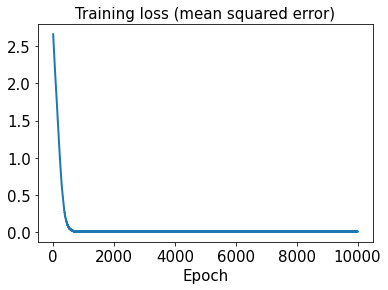

In [100]:
hist3 = history3.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

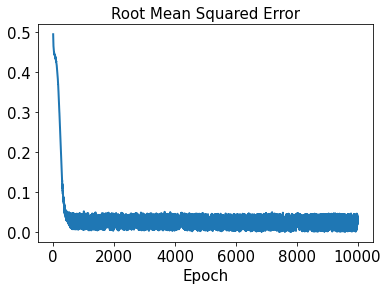

In [101]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [102]:
sd3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [103]:
start3 = datetime.datetime.now()
history3 = sd3.fit(x_train3, y_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 18ms/step - loss: 3.7728 - rmse: 1.9424
Epoch 2/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.7523 - rmse: 1.9371
Epoch 3/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.7317 - rmse: 1.9318
Epoch 4/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.7111 - rmse: 1.9264
Epoch 5/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.6906 - rmse: 1.9211
Epoch 6/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.6702 - rmse: 1.9158
Epoch 7/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.6500 - rmse: 1.9105
Epoch 8/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.6299 - rmse: 1.9052
Epoch 9/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.6099 - rmse: 1.9000
Epoch 10/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.5900 - rmse: 1.8947
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 7ms/step - loss: 2.4254 - rmse: 1.5574
Epoch 87/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4137 - rmse: 1.5536
Epoch 88/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4021 - rmse: 1.5499
Epoch 89/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3907 - rmse: 1.5462
Epoch 90/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3792 - rmse: 1.5425
Epoch 91/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3678 - rmse: 1.5388
Epoch 92/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3565 - rmse: 1.5351
Epoch 93/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3452 - rmse: 1.5314
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3341 - rmse: 1.5278
Epoch 95/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3231 - rmse: 1.5242
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 10ms/step - loss: 1.6669 - rmse: 1.2911
Epoch 171/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6597 - rmse: 1.2883
Epoch 172/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6521 - rmse: 1.2853
Epoch 173/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6447 - rmse: 1.2825
Epoch 174/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6371 - rmse: 1.2795
Epoch 175/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6295 - rmse: 1.2765
Epoch 176/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6216 - rmse: 1.2734
Epoch 177/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6136 - rmse: 1.2703
Epoch 178/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6057 - rmse: 1.2672
Epoch 179/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5981 - rmse: 1.2642
Epoch 180/10000
2/2 [======================

2/2 [==============================] - 0s 10ms/step - loss: 1.1476 - rmse: 1.0712
Epoch 255/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1379 - rmse: 1.0666
Epoch 256/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1326 - rmse: 1.0641
Epoch 257/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1304 - rmse: 1.0631
Epoch 258/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.1234 - rmse: 1.0598
Epoch 259/10000
2/2 [==============================] - 0s 20ms/step - loss: 1.1191 - rmse: 1.0578
Epoch 260/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.1131 - rmse: 1.0549
Epoch 261/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1125 - rmse: 1.0546
Epoch 262/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1049 - rmse: 1.0510
Epoch 263/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.1002 - rmse: 1.0488
Epoch 264/10000
2/2 [=================

2/2 [==============================] - 0s 7ms/step - loss: 0.8161 - rmse: 0.9033
Epoch 339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8180 - rmse: 0.9043
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8114 - rmse: 0.9006
Epoch 341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8088 - rmse: 0.8992
Epoch 342/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.8040 - rmse: 0.8965
Epoch 343/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.8013 - rmse: 0.8950
Epoch 344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7979 - rmse: 0.8931
Epoch 345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7962 - rmse: 0.8921
Epoch 346/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.7918 - rmse: 0.8897
Epoch 347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7899 - rmse: 0.8886
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.5923 - rmse: 0.7695
Epoch 423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5974 - rmse: 0.7728
Epoch 424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5888 - rmse: 0.7672
Epoch 425/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5843 - rmse: 0.7643
Epoch 426/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5854 - rmse: 0.7649
Epoch 427/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5798 - rmse: 0.7613
Epoch 428/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5775 - rmse: 0.7598
Epoch 429/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5753 - rmse: 0.7583
Epoch 430/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5796 - rmse: 0.7611
Epoch 431/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5733 - rmse: 0.7570
Epoch 432/10000
2/2 [=======================

2/2 [==============================] - 0s 10ms/step - loss: 0.4244 - rmse: 0.6513
Epoch 507/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4228 - rmse: 0.6500
Epoch 508/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4233 - rmse: 0.6505
Epoch 509/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4203 - rmse: 0.6481
Epoch 510/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4176 - rmse: 0.6461
Epoch 511/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4156 - rmse: 0.6445
Epoch 512/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4140 - rmse: 0.6432
Epoch 513/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4136 - rmse: 0.6429
Epoch 514/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4113 - rmse: 0.6412
Epoch 515/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4102 - rmse: 0.6403
Epoch 516/10000
2/2 [====================

2/2 [==============================] - 0s 10ms/step - loss: 0.3009 - rmse: 0.5484
Epoch 591/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3025 - rmse: 0.5498
Epoch 592/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3007 - rmse: 0.5482
Epoch 593/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2971 - rmse: 0.5449
Epoch 594/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2961 - rmse: 0.5439
Epoch 595/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2978 - rmse: 0.5455
Epoch 596/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2938 - rmse: 0.5419
Epoch 597/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2926 - rmse: 0.5408
Epoch 598/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2943 - rmse: 0.5423
Epoch 599/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2907 - rmse: 0.5390
Epoch 600/10000
2/2 [====================

2/2 [==============================] - 0s 9ms/step - loss: 0.2110 - rmse: 0.4592
Epoch 675/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2067 - rmse: 0.4545
Epoch 676/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2115 - rmse: 0.4597
Epoch 677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2064 - rmse: 0.4541
Epoch 678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2039 - rmse: 0.4513
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2053 - rmse: 0.4530
Epoch 680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2032 - rmse: 0.4506
Epoch 681/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2012 - rmse: 0.4484
Epoch 682/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1995 - rmse: 0.4464
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2001 - rmse: 0.4472
Epoch 684/10000
2/2 [========================

2/2 [==============================] - 0s 10ms/step - loss: 0.1402 - rmse: 0.3743
Epoch 759/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1336 - rmse: 0.3654
Epoch 760/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1345 - rmse: 0.3666
Epoch 761/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1322 - rmse: 0.3634
Epoch 762/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1332 - rmse: 0.3647
Epoch 763/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1317 - rmse: 0.3627
Epoch 764/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1299 - rmse: 0.3603
Epoch 765/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1295 - rmse: 0.3596
Epoch 766/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1284 - rmse: 0.3581
Epoch 767/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1278 - rmse: 0.3573
Epoch 768/10000
2/2 [================

2/2 [==============================] - 0s 11ms/step - loss: 0.0872 - rmse: 0.2950
Epoch 842/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0840 - rmse: 0.2897
Epoch 843/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0874 - rmse: 0.2954
Epoch 844/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0873 - rmse: 0.2952
Epoch 845/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0836 - rmse: 0.2889
Epoch 846/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0842 - rmse: 0.2899
Epoch 847/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0850 - rmse: 0.2914
Epoch 848/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0831 - rmse: 0.2881
Epoch 849/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0818 - rmse: 0.2857
Epoch 850/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0836 - rmse: 0.2889
Epoch 851/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0526 - rmse: 0.2291
Epoch 925/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0516 - rmse: 0.2269
Epoch 926/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0527 - rmse: 0.2293
Epoch 927/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0504 - rmse: 0.2242
Epoch 928/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0582 - rmse: 0.2411
Epoch 929/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0498 - rmse: 0.2230
Epoch 930/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0506 - rmse: 0.2248
Epoch 931/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0558 - rmse: 0.2360
Epoch 932/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0487 - rmse: 0.2204
Epoch 933/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0482 - rmse: 0.2192
Epoch 934/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0357 - rmse: 0.1886
Epoch 1008/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0286 - rmse: 0.1687
Epoch 1009/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0297 - rmse: 0.1720
Epoch 1010/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0362 - rmse: 0.1899
Epoch 1011/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0337 - rmse: 0.1833
Epoch 1012/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0277 - rmse: 0.1660
Epoch 1013/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0365 - rmse: 0.1909
Epoch 1014/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0297 - rmse: 0.1719
Epoch 1015/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0348 - rmse: 0.1863
Epoch 1016/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0295 - rmse: 0.1714
Epoch 1017/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0164 - rmse: 0.1277
Epoch 1090/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0151 - rmse: 0.1224
Epoch 1091/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0158 - rmse: 0.1253
Epoch 1092/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0189 - rmse: 0.1370
Epoch 1093/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0215 - rmse: 0.1463
Epoch 1094/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0166 - rmse: 0.1285
Epoch 1095/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0160 - rmse: 0.1263
Epoch 1096/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0149 - rmse: 0.1216
Epoch 1097/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0142 - rmse: 0.1187
Epoch 1098/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0139 - rmse: 0.1174
Epoch 1099/10000
2/2 [=====

Epoch 1172/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0878
Epoch 1173/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0112 - rmse: 0.1054
Epoch 1174/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0122 - rmse: 0.1100
Epoch 1175/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0119 - rmse: 0.1087
Epoch 1176/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0099 - rmse: 0.0991
Epoch 1177/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0091 - rmse: 0.0948
Epoch 1178/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0885
Epoch 1179/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0890
Epoch 1180/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0101 - rmse: 0.1002
Epoch 1181/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0107 - rmse: 0.1032
Epoch 1182

Epoch 1255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 1256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0138 - rmse: 0.1171
Epoch 1257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0672
Epoch 1258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0918
Epoch 1259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0683
Epoch 1260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0768
Epoch 1261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0877
Epoch 1262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0748
Epoch 1263/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 1264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0663
Epoch 1265/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0460
Epoch 1339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0584
Epoch 1340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0456
Epoch 1341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0480
Epoch 1342/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0889
Epoch 1344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0690
Epoch 1345/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 1346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0099 - rmse: 0.0992
Epoch 1347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 1348/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 1422/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0696
Epoch 1423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0624
Epoch 1424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0423
Epoch 1425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0521
Epoch 1426/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0501
Epoch 1427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0502
Epoch 1428/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0060 - rmse: 0.0767
Epoch 1429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0670
Epoch 1430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0740
Epoch 1431/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 7.3128e-04 - rmse: 0.0254
Epoch 1505/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0400
Epoch 1506/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0507
Epoch 1507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 1508/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4640e-04 - rmse: 0.0257
Epoch 1509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 1510/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0319
Epoch 1511/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0559
Epoch 1512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 1513/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4777e-04 - rmse: 0.0276
Epoch 1514/10000
2/2 [===

2/2 [==============================] - 0s 11ms/step - loss: 4.9547e-04 - rmse: 0.0203
Epoch 1587/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0444
Epoch 1588/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 1589/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0498
Epoch 1590/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1165e-04 - rmse: 0.0207
Epoch 1591/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0783
Epoch 1592/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0468
Epoch 1593/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0095 - rmse: 0.0972
Epoch 1594/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2429e-04 - rmse: 0.0185
Epoch 1595/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 1596/1000

2/2 [==============================] - 0s 10ms/step - loss: 2.6776e-04 - rmse: 0.0136
Epoch 1668/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0451
Epoch 1669/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 1670/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6976e-04 - rmse: 0.0094
Epoch 1671/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 1672/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0480
Epoch 1673/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0655
Epoch 1674/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0773
Epoch 1675/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0539
Epoch 1676/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0423
Epoch 1677/10000
2/2

2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 1750/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0968
Epoch 1751/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 1752/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0461
Epoch 1753/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0093 - rmse: 0.0961
Epoch 1754/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 1755/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8406e-04 - rmse: 0.0143
Epoch 1756/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 1757/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 1758/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 1759/10000
2/2 [=

Epoch 1831/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 1832/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5162e-04 - rmse: 0.0131
Epoch 1833/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 1834/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9202e-04 - rmse: 0.0146
Epoch 1835/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1764e-04 - rmse: 0.0154
Epoch 1836/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0400
Epoch 1837/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 1838/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 1839/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0713e-04 - rmse: 0.0151
Epoch 1840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 8.2186e-04 - rmse: 0.0273
Epoch 1913/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0671
Epoch 1914/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 1915/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0327
Epoch 1916/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0193e-04 - rmse: 0.0150
Epoch 1917/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0896
Epoch 1918/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0374
Epoch 1919/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0896
Epoch 1920/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0446
Epoch 1921/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2120e-04 - rmse: 0.0120
Epoch 1922/1000

2/2 [==============================] - 0s 11ms/step - loss: 1.9731e-04 - rmse: 0.0110
Epoch 1995/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8466e-04 - rmse: 0.0104
Epoch 1996/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1383e-04 - rmse: 0.0117
Epoch 1997/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0632
Epoch 1998/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0096 - rmse: 0.0975
Epoch 1999/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 2000/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0401
Epoch 2001/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1288e-04 - rmse: 0.0209
Epoch 2002/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1486e-04 - rmse: 0.0154
Epoch 2003/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 2

2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 2076/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.4638e-04 - rmse: 0.0239
Epoch 2077/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1087e-04 - rmse: 0.0183
Epoch 2078/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 2079/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1657e-04 - rmse: 0.0155
Epoch 2080/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6183e-04 - rmse: 0.0242
Epoch 2081/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0639
Epoch 2082/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 2083/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9229e-04 - rmse: 0.0147
Epoch 2084/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 2

Epoch 2157/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0671
Epoch 2158/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0692
Epoch 2159/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0981
Epoch 2160/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4245e-04 - rmse: 0.0238
Epoch 2161/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 2162/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0360
Epoch 2163/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0529
Epoch 2164/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 2165/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0584
Epoch 2166/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0850
Epoch 

2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 2239/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 2240/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0831
Epoch 2241/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9438e-04 - rmse: 0.0304
Epoch 2242/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0082e-04 - rmse: 0.0181
Epoch 2243/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0647
Epoch 2244/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0671
Epoch 2245/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0412
Epoch 2246/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 2247/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.2346e-04 - rmse: 0.0274
Epoch 2248/10000

2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0855
Epoch 2321/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3912e-04 - rmse: 0.0295
Epoch 2322/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 2323/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0666
Epoch 2324/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0161e-04 - rmse: 0.0182
Epoch 2325/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0098 - rmse: 0.0984
Epoch 2326/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 2327/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0471
Epoch 2328/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0557
Epoch 2329/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 2330/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 2403/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 2404/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1669e-04 - rmse: 0.0186
Epoch 2405/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9664e-04 - rmse: 0.0112
Epoch 2406/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0390
Epoch 2407/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0845
Epoch 2408/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1912e-04 - rmse: 0.0070
Epoch 2409/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0896
Epoch 2410/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 2411/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5662e-04 - rmse: 0.0137
Epoch 2412/

2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 2484/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0436
Epoch 2485/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2962e-04 - rmse: 0.0161
Epoch 2486/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0539
Epoch 2487/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 2488/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 2489/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3838e-04 - rmse: 0.0130
Epoch 2490/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6663e-04 - rmse: 0.0099
Epoch 2491/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 2492/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 2493/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 2566/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 2567/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0478
Epoch 2568/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0599
Epoch 2569/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0362
Epoch 2570/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0426
Epoch 2571/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0459
Epoch 2572/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0045 - rmse: 0.0665
Epoch 2573/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 2574/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 2575/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 2648/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 2649/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0389
Epoch 2650/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0083 - rmse: 0.0907
Epoch 2651/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 2652/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0359
Epoch 2653/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 2654/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0894
Epoch 2655/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4562e-04 - rmse: 0.0134
Epoch 2656/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 2657/10000
2/2 [===========

2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 2730/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0769
Epoch 2731/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8498e-04 - rmse: 0.0148
Epoch 2732/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7057e-04 - rmse: 0.0143
Epoch 2733/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0375
Epoch 2734/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 2735/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 2736/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 2737/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0315
Epoch 2738/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 2739/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 1.4973e-04 - rmse: 0.0092
Epoch 2811/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 2812/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0900e-04 - rmse: 0.0273
Epoch 2813/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0769
Epoch 2814/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 2815/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 2816/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 2817/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9356e-04 - rmse: 0.0151
Epoch 2818/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 2819/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1043e-04 - rmse: 0.0211
Epoch 2820/

2/2 [==============================] - 0s 7ms/step - loss: 8.7926e-05 - rmse: 0.0049
Epoch 2893/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0374
Epoch 2894/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 2895/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0532
Epoch 2896/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9088e-04 - rmse: 0.0151
Epoch 2897/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0414
Epoch 2898/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2276e-04 - rmse: 0.0077
Epoch 2899/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.7914e-04 - rmse: 0.0178
Epoch 2900/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 2901/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0975
Epoch 2902/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0490
Epoch 2975/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0390
Epoch 2976/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 2977/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0648
Epoch 2978/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0330
Epoch 2979/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 2980/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.6207e-04 - rmse: 0.0141
Epoch 2981/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0617
Epoch 2982/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0345
Epoch 2983/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.8620e-05 - rmse: 0.0040
Epoch 2984/10000
2/2 [=====

2/2 [==============================] - 0s 8ms/step - loss: 3.8210e-04 - rmse: 0.0179
Epoch 3057/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2641e-04 - rmse: 0.0215
Epoch 3058/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0798
Epoch 3059/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3732e-04 - rmse: 0.0194
Epoch 3060/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.2248e-04 - rmse: 0.0190
Epoch 3061/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 3062/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 3063/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 3064/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0657
Epoch 3065/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3659e-04 - rmse: 0.0166
Epoch 3066/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 3139/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 3140/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0073 - rmse: 0.0850
Epoch 3141/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 3142/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 3143/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 3144/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 3145/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0576
Epoch 3146/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.1450e-04 - rmse: 0.0188
Epoch 3147/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0901
Epoch 3148/10000
2/2 [===========

2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 3221/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0901
Epoch 3222/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0373
Epoch 3223/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2164e-04 - rmse: 0.0079
Epoch 3224/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7924e-04 - rmse: 0.0109
Epoch 3225/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0311
Epoch 3226/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3701e-04 - rmse: 0.0133
Epoch 3227/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4571e-04 - rmse: 0.0136
Epoch 3228/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.6798e-05 - rmse: 0.0052
Epoch 3229/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 3

2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0402
Epoch 3302/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 3303/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 3304/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0404
Epoch 3305/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5244e-04 - rmse: 0.0139
Epoch 3306/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0390
Epoch 3307/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 3308/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 3309/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 3310/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 3311/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 3384/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 3385/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 3386/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0547
Epoch 3387/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 3388/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 3389/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 3390/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 3391/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 3392/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 3393/10000
2/2 [=====

2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 3466/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0627
Epoch 3467/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4678e-04 - rmse: 0.0170
Epoch 3468/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 3469/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4854e-04 - rmse: 0.0095
Epoch 3470/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0538
Epoch 3471/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0566
Epoch 3472/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 3473/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6399e-04 - rmse: 0.0144
Epoch 3474/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0653e-04 - rmse: 0.0187
Epoch 3475/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0319
Epoch 3548/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0608
Epoch 3549/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 3550/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0678
Epoch 3551/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0106 - rmse: 0.1025
Epoch 3552/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 3553/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0103 - rmse: 0.1012
Epoch 3554/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 3555/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0900
Epoch 3556/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 3557/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 4.5368e-04 - rmse: 0.0199
Epoch 3631/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9507e-04 - rmse: 0.0154
Epoch 3632/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0902
Epoch 3633/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 3634/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 3635/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 3636/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 3637/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 3638/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2773e-04 - rmse: 0.0217
Epoch 3639/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 3640/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 3713/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 3714/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 3715/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 3716/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0331
Epoch 3717/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0479
Epoch 3718/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5835e-04 - rmse: 0.0101
Epoch 3719/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8388e-04 - rmse: 0.0151
Epoch 3720/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 3721/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 3722/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 3795/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 3796/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 3797/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4959e-04 - rmse: 0.0199
Epoch 3798/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 3799/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0447
Epoch 3800/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0560e-04 - rmse: 0.0212
Epoch 3801/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 3802/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 3803/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2866e-05 - rmse: 0.0043
Epoch 3804/10000
2/2 [=

2/2 [==============================] - 0s 9ms/step - loss: 5.7763e-04 - rmse: 0.0229
Epoch 3877/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0408
Epoch 3878/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0559
Epoch 3879/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0098 - rmse: 0.0985
Epoch 3880/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0389
Epoch 3881/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7017e-04 - rmse: 0.0227
Epoch 3882/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 3883/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.3544e-04 - rmse: 0.0219
Epoch 3884/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 3885/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 3886/10000
2/2 [

2/2 [==============================] - 0s 9ms/step - loss: 1.4567e-04 - rmse: 0.0096
Epoch 3959/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 3960/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3362e-04 - rmse: 0.0090
Epoch 3961/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6238e-04 - rmse: 0.0145
Epoch 3962/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 3963/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 3964/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 3965/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 3966/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 3967/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4722e-04 - rmse: 0.0198
Epoch 3968/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0492
Epoch 4041/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7039e-04 - rmse: 0.0268
Epoch 4042/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0575
Epoch 4043/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.5034e-04 - rmse: 0.0199
Epoch 4044/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1999e-04 - rmse: 0.0192
Epoch 4045/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8114e-04 - rmse: 0.0207
Epoch 4046/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0085 - rmse: 0.0918
Epoch 4047/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0592
Epoch 4048/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.6580e-04 - rmse: 0.0248
Epoch 4049/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 4050/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0687
Epoch 4123/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 4124/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 4125/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.2064e-04 - rmse: 0.0295
Epoch 4126/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 4127/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 4128/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 4129/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.9165e-04 - rmse: 0.0253
Epoch 4130/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 4131/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 4132/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 4205/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 4206/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 4207/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 4208/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6887e-04 - rmse: 0.0204
Epoch 4209/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 4210/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.7994e-04 - rmse: 0.0151
Epoch 4211/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1402e-04 - rmse: 0.0079
Epoch 4212/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 4213/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.0946e-04 - rmse: 0.0189
Epoch 4214/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 5.2075e-04 - rmse: 0.0217
Epoch 4287/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 4288/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 4289/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 4290/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 4291/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.4778e-04 - rmse: 0.0223
Epoch 4292/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9208e-04 - rmse: 0.0185
Epoch 4293/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.7177e-04 - rmse: 0.0149
Epoch 4294/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8783e-04 - rmse: 0.0209
Epoch 4295/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0061 - rmse: 0.0776
Epoch 4296/10000


2/2 [==============================] - 0s 7ms/step - loss: 3.9203e-04 - rmse: 0.0185
Epoch 4369/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 4370/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 4371/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5082e-04 - rmse: 0.0100
Epoch 4372/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.4907e-04 - rmse: 0.0141
Epoch 4373/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 4374/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6262e-04 - rmse: 0.0203
Epoch 4375/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 4376/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 4377/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4313e-04 - rmse: 0.0171
Epoch 4378/10000


2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0769
Epoch 4451/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 4452/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8353e-04 - rmse: 0.0271
Epoch 4453/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 4454/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9913e-04 - rmse: 0.0274
Epoch 4455/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 4456/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 4457/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0414
Epoch 4458/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 4459/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 4460/10000
2/

2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 4533/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 4534/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1664e-04 - rmse: 0.0130
Epoch 4535/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.6210e-04 - rmse: 0.0177
Epoch 4536/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0309
Epoch 4537/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 4538/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0539
Epoch 4539/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 4540/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0966
Epoch 4541/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 4542/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 4615/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0095 - rmse: 0.0972
Epoch 4616/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0105 - rmse: 0.1023
Epoch 4617/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0715
Epoch 4618/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 4619/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0097 - rmse: 0.0985
Epoch 4620/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 4621/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 4622/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0609
Epoch 4623/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 4624/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 4697/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0844
Epoch 4698/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 4699/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 4700/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 4701/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 4702/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 4703/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 4704/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0512
Epoch 4705/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0448
Epoch 4706/10000
2/2 [======

2/2 [==============================] - 0s 7ms/step - loss: 1.8347e-04 - rmse: 0.0117
Epoch 4779/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0062 - rmse: 0.0782
Epoch 4780/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 4781/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.8821e-04 - rmse: 0.0155
Epoch 4782/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 4783/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 4784/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0348
Epoch 4785/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4455e-04 - rmse: 0.0264
Epoch 4786/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0858
Epoch 4787/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0931e-04 - rmse: 0.0276
Epoch 4788/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 4861/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 4862/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 4863/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0592
Epoch 4864/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6203e-04 - rmse: 0.0107
Epoch 4865/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 4866/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 4867/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0838
Epoch 4868/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1081e-04 - rmse: 0.0128
Epoch 4869/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 4870/10000
2/

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 4943/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1644e-04 - rmse: 0.0259
Epoch 4944/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0088 - rmse: 0.0934
Epoch 4945/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 4946/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1388e-04 - rmse: 0.0258
Epoch 4947/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 4948/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0099 - rmse: 0.0991
Epoch 4949/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0921
Epoch 4950/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 4951/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0348e-04 - rmse: 0.0236
Epoch 4952/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 5025/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8364e-04 - rmse: 0.0289
Epoch 5026/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0099 - rmse: 0.0993
Epoch 5027/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.0322e-04 - rmse: 0.0256
Epoch 5028/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.4265e-04 - rmse: 0.0264
Epoch 5029/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 5030/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 5031/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 5032/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 5033/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0680
Epoch 5034/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0523
Epoch 5107/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 5108/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6819e-04 - rmse: 0.0206
Epoch 5109/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 5110/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0098 - rmse: 0.0988
Epoch 5111/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 5112/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 5113/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0854
Epoch 5114/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8058e-04 - rmse: 0.0231
Epoch 5115/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 5116/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 5189/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0832
Epoch 5190/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3383e-04 - rmse: 0.0281
Epoch 5191/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 5192/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6476e-04 - rmse: 0.0110
Epoch 5193/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 5194/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0376
Epoch 5195/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 5196/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2667e-04 - rmse: 0.0168
Epoch 5197/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 5198/1000

2/2 [==============================] - 0s 6ms/step - loss: 3.9454e-04 - rmse: 0.0187
Epoch 5271/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0348
Epoch 5272/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7457e-04 - rmse: 0.0114
Epoch 5273/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 5274/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 5275/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0449
Epoch 5276/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6136e-04 - rmse: 0.0204
Epoch 5277/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 5278/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8011e-04 - rmse: 0.0209
Epoch 5279/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.8458e-04 - rmse: 0.0119
Epoch 5280/10000


2/2 [==============================] - 0s 7ms/step - loss: 4.0272e-04 - rmse: 0.0190
Epoch 5353/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 5354/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 5355/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 5356/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 5357/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0592
Epoch 5358/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 5359/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 5360/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 5361/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 5362/10000
2/2 [===========

2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 5435/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 5436/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4775e-04 - rmse: 0.0175
Epoch 5437/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.9200e-04 - rmse: 0.0158
Epoch 5438/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 5439/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 5440/10000
2/2 [==============================] - 0s 18ms/step - loss: 3.3019e-04 - rmse: 0.0170
Epoch 5441/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 5442/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 5443/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0626
Epoch 5444/1000

2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 5517/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9421e-04 - rmse: 0.0255
Epoch 5518/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 5519/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5574e-04 - rmse: 0.0177
Epoch 5520/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 5521/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0852e-04 - rmse: 0.0163
Epoch 5522/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0973
Epoch 5523/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4179e-04 - rmse: 0.0200
Epoch 5524/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 5525/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0438
Epoch 5526/10000
2/2 

2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 5599/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 5600/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 5601/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0073 - rmse: 0.0851
Epoch 5602/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5653e-04 - rmse: 0.0227
Epoch 5603/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 5604/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 5605/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2256e-04 - rmse: 0.0261
Epoch 5606/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 5607/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 5608/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 5681/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.5778e-04 - rmse: 0.0268
Epoch 5682/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9147e-04 - rmse: 0.0292
Epoch 5683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0721
Epoch 5684/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0088 - rmse: 0.0937
Epoch 5685/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0311
Epoch 5686/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0497
Epoch 5687/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 5688/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0414
Epoch 5689/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0625
Epoch 5690/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 5763/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9793e-04 - rmse: 0.0214
Epoch 5764/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 5765/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0859
Epoch 5766/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9175e-04 - rmse: 0.0212
Epoch 5767/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0792
Epoch 5768/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 5769/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 5770/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0085 - rmse: 0.0919
Epoch 5771/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.7461e-04 - rmse: 0.0252
Epoch 5772/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 5845/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1001e-04 - rmse: 0.0217
Epoch 5846/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1296e-04 - rmse: 0.0217
Epoch 5847/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 5848/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 5849/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 5850/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 5851/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0450
Epoch 5852/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 5853/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 5854/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 3.4851e-04 - rmse: 0.0176
Epoch 5927/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6857e-05 - rmse: 0.0075
Epoch 5928/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0566e-04 - rmse: 0.0216
Epoch 5929/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1258e-04 - rmse: 0.0217
Epoch 5930/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 5931/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 5932/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0619
Epoch 5933/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 5934/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 5935/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 5936/

Epoch 6008/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 6009/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1133e-04 - rmse: 0.0193
Epoch 6010/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0903
Epoch 6011/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6012/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 6013/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0664
Epoch 6014/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0912
Epoch 6015/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 6016/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 6017/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3339e-04 - rmse: 0.0198
Ep

2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 6091/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0576
Epoch 6092/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0664
Epoch 6093/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 6094/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 6095/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 6096/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 6097/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 6098/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0906
Epoch 6099/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0449
Epoch 6100/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 2.1948e-04 - rmse: 0.0134
Epoch 6172/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0512
Epoch 6173/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.7051e-04 - rmse: 0.0208
Epoch 6174/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 6175/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 6176/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 6177/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 6178/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5575e-04 - rmse: 0.0248
Epoch 6179/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.3685e-04 - rmse: 0.0245
Epoch 6180/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.9541e-04 - rmse: 0.0256
Epoch 6

2/2 [==============================] - 0s 11ms/step - loss: 0.0094 - rmse: 0.0967
Epoch 6253/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 6254/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.0833e-04 - rmse: 0.0217
Epoch 6255/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 6256/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0094 - rmse: 0.0969
Epoch 6257/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0627
Epoch 6258/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9040e-04 - rmse: 0.0123
Epoch 6259/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.9358e-04 - rmse: 0.0236
Epoch 6260/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.9297e-04 - rmse: 0.0213
Epoch 6261/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 6262/

2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 6335/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 6336/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 6337/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 6338/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.6138e-04 - rmse: 0.0229
Epoch 6339/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 6340/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 6341/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 6342/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8869e-04 - rmse: 0.0123
Epoch 6343/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7621e-04 - rmse: 0.0118
Epoch 6344/1000

2/2 [==============================] - 0s 11ms/step - loss: 1.8256e-04 - rmse: 0.0120
Epoch 6416/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 6417/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 6418/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 6419/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0970
Epoch 6420/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.5996e-04 - rmse: 0.0229
Epoch 6421/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 6422/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8314e-04 - rmse: 0.0121
Epoch 6423/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6424/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3020e-04 - rmse: 0.0096
Epoch 6425/

2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 6498/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4172e-04 - rmse: 0.0225
Epoch 6499/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 6500/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.9561e-04 - rmse: 0.0126
Epoch 6501/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7728e-04 - rmse: 0.0155
Epoch 6502/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7696e-04 - rmse: 0.0118
Epoch 6503/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 6504/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 6505/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7383e-04 - rmse: 0.0117
Epoch 6506/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 6

2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0969
Epoch 6579/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 6580/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 6581/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0460
Epoch 6582/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.2184e-04 - rmse: 0.0242
Epoch 6583/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 6584/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.5310e-04 - rmse: 0.0178
Epoch 6585/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 6586/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 6587/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 6588/10000
2/2 [=======

Epoch 6661/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0919
Epoch 6662/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 6663/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.3569e-04 - rmse: 0.0223
Epoch 6664/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 6665/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 6666/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 6667/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1044e-04 - rmse: 0.0193
Epoch 6668/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 6669/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9719e-04 - rmse: 0.0162
Epoch 6670/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0460
Epoch 66

2/2 [==============================] - 0s 9ms/step - loss: 2.0600e-04 - rmse: 0.0130
Epoch 6744/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4847e-04 - rmse: 0.0146
Epoch 6745/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 6746/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 6747/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 6748/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 6749/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 6750/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7444e-04 - rmse: 0.0118
Epoch 6751/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 6752/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 6753/10000
2

2/2 [==============================] - 0s 9ms/step - loss: 1.8997e-04 - rmse: 0.0124
Epoch 6826/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 6827/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 6828/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.1859e-04 - rmse: 0.0168
Epoch 6829/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 6830/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0776
Epoch 6831/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 6832/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2318e-04 - rmse: 0.0197
Epoch 6833/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0568
Epoch 6834/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 6835/10000
2/2 [=

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 6908/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2567e-04 - rmse: 0.0170
Epoch 6909/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 6910/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1965e-04 - rmse: 0.0220
Epoch 6911/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7447e-04 - rmse: 0.0184
Epoch 6912/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 6913/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 6914/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0777
Epoch 6915/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6664e-04 - rmse: 0.0305
Epoch 6916/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 6917/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 6990/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 6991/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.1995e-04 - rmse: 0.0242
Epoch 6992/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 6993/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 6994/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 6995/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 6996/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6997/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9383e-04 - rmse: 0.0214
Epoch 6998/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1684e-04 - rmse: 0.0195
Epoch 6999/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 8.2855e-04 - rmse: 0.0282
Epoch 7072/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6882e-04 - rmse: 0.0252
Epoch 7073/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 7074/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0575
Epoch 7075/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 7076/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 7077/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 7078/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0911
Epoch 7079/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 7080/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7186e-04 - rmse: 0.0272
Epoch 7081/10000


2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 7153/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 7154/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.5037e-04 - rmse: 0.0178
Epoch 7155/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 7156/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2051e-04 - rmse: 0.0137
Epoch 7157/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 7158/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0900e-04 - rmse: 0.0194
Epoch 7159/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 7160/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 7161/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1037e-04 - rmse: 0.0087
Epoch 7162/10

2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 7234/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3733e-04 - rmse: 0.0174
Epoch 7235/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 7236/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 7237/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2057e-04 - rmse: 0.0169
Epoch 7238/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3397e-04 - rmse: 0.0173
Epoch 7239/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 7240/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0082 - rmse: 0.0902
Epoch 7241/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 7242/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 7243/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 7315/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 7316/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 7317/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.5897e-04 - rmse: 0.0269
Epoch 7318/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9236e-04 - rmse: 0.0189
Epoch 7319/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0097 - rmse: 0.0982
Epoch 7320/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 7321/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 7322/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 7323/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0568
Epoch 7324/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 7397/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 7398/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.2042e-04 - rmse: 0.0281
Epoch 7399/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 7400/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.6260e-04 - rmse: 0.0207
Epoch 7401/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 7402/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8925e-04 - rmse: 0.0275
Epoch 7403/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 7404/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 7405/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 7406/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 7479/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 7480/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9613e-04 - rmse: 0.0191
Epoch 7481/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 7482/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9641e-04 - rmse: 0.0191
Epoch 7483/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 7484/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1196e-04 - rmse: 0.0167
Epoch 7485/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 7486/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 7487/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 7488/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 7560/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0618
Epoch 7561/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 7562/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9389e-04 - rmse: 0.0190
Epoch 7563/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3064e-04 - rmse: 0.0200
Epoch 7564/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0383e-04 - rmse: 0.0165
Epoch 7565/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0632
Epoch 7566/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 7567/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.0923e-04 - rmse: 0.0240
Epoch 7568/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 7569/

2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 7641/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0845
Epoch 7642/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0844
Epoch 7643/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0908
Epoch 7644/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 7645/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0097 - rmse: 0.0982
Epoch 7646/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0860
Epoch 7647/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 7648/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0335
Epoch 7649/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 7650/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 5.1197e-04 - rmse: 0.0219
Epoch 7723/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.6947e-04 - rmse: 0.0272
Epoch 7724/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.4496e-04 - rmse: 0.0285
Epoch 7725/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 7726/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2806e-04 - rmse: 0.0244
Epoch 7727/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5786e-04 - rmse: 0.0181
Epoch 7728/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 7729/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 7730/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 7731/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0688
Epoch 7

2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 7804/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0893
Epoch 7805/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0619
Epoch 7806/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5668e-04 - rmse: 0.0150
Epoch 7807/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 7808/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 7809/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 7810/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 7811/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 7812/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0377
Epoch 7813/10000
2/2 [=

2/2 [==============================] - 0s 16ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 7885/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 7886/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5083e-05 - rmse: 0.0058
Epoch 7887/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 7888/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 7889/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 7890/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 7891/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4378e-04 - rmse: 0.0177
Epoch 7892/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 7893/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 7894/10000
2/2

2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 7967/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 7968/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 7969/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 7970/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.2421e-04 - rmse: 0.0282
Epoch 7971/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 7972/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 7973/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 7974/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 7975/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 7976/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 8049/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 8050/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.9547e-04 - rmse: 0.0163
Epoch 8051/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 8052/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0913
Epoch 8053/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 8054/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0634
Epoch 8055/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.7980e-04 - rmse: 0.0255
Epoch 8056/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1929e-04 - rmse: 0.0197
Epoch 8057/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0845
Epoch 8058/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 8.0753e-04 - rmse: 0.0279
Epoch 8131/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1032e-05 - rmse: 0.0064
Epoch 8132/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0731e-04 - rmse: 0.0133
Epoch 8133/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 8134/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1856e-04 - rmse: 0.0094
Epoch 8135/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 8136/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 8137/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.7300e-04 - rmse: 0.0185
Epoch 8138/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.4478e-04 - rmse: 0.0204
Epoch 8139/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 8

2/2 [==============================] - 0s 10ms/step - loss: 0.0065 - rmse: 0.0804
Epoch 8213/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 8214/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.7942e-04 - rmse: 0.0291
Epoch 8215/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7753e-04 - rmse: 0.0308
Epoch 8216/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0101 - rmse: 0.1005
Epoch 8217/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.1820e-04 - rmse: 0.0262
Epoch 8218/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0099 - rmse: 0.0993
Epoch 8219/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 8220/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 8221/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 8222/10000
2

2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 8295/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 8296/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 8297/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 8298/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 8299/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 8300/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 8301/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6005e-04 - rmse: 0.0114
Epoch 8302/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 8303/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 8304/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 7.7231e-04 - rmse: 0.0273
Epoch 8377/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 8378/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8552e-04 - rmse: 0.0309
Epoch 8379/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1537e-04 - rmse: 0.0169
Epoch 8380/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2931e-04 - rmse: 0.0100
Epoch 8381/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6636e-04 - rmse: 0.0209
Epoch 8382/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9361e-04 - rmse: 0.0191
Epoch 8383/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0077e-04 - rmse: 0.0217
Epoch 8384/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 8385/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0902
Epoch 838

2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0576
Epoch 8459/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 8460/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 8461/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.8908e-04 - rmse: 0.0257
Epoch 8462/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0586
Epoch 8463/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.7733e-04 - rmse: 0.0255
Epoch 8464/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 8465/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 8466/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0814
Epoch 8467/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 8468/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 8541/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 8542/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 8543/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0722e-04 - rmse: 0.0134
Epoch 8544/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8450e-04 - rmse: 0.0125
Epoch 8545/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8546/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 8547/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 8548/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2104e-05 - rmse: 0.0080
Epoch 8549/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 8550/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 8623/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2014e-04 - rmse: 0.0198
Epoch 8624/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6886e-04 - rmse: 0.0155
Epoch 8625/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 8626/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0973
Epoch 8627/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 8628/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 8629/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 8630/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 8631/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 8632/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 8704/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9323e-04 - rmse: 0.0129
Epoch 8705/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4478e-04 - rmse: 0.0178
Epoch 8706/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 8707/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.1549e-04 - rmse: 0.0281
Epoch 8708/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.1472e-05 - rmse: 0.0073
Epoch 8709/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 8710/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1924e-04 - rmse: 0.0096
Epoch 8711/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 8712/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 8

2/2 [==============================] - 0s 10ms/step - loss: 4.0482e-04 - rmse: 0.0194
Epoch 8785/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 8786/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 8787/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9366e-04 - rmse: 0.0129
Epoch 8788/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8259e-04 - rmse: 0.0160
Epoch 8789/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 8790/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0532e-04 - rmse: 0.0194
Epoch 8791/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1743e-04 - rmse: 0.0138
Epoch 8792/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0625
Epoch 8793/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0482
Epoch 8

Epoch 8866/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.2719e-04 - rmse: 0.0283
Epoch 8867/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 8868/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8737e-04 - rmse: 0.0237
Epoch 8869/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 8870/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.1008e-04 - rmse: 0.0241
Epoch 8871/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.7131e-04 - rmse: 0.0254
Epoch 8872/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.9888e-04 - rmse: 0.0239
Epoch 8873/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 8874/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 8875/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rms

Epoch 8948/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 8949/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.3059e-04 - rmse: 0.0265
Epoch 8950/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 8951/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 8952/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 8953/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 8954/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3488e-04 - rmse: 0.0301
Epoch 8955/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 8956/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 8957/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5444e-04 - rmse: 0.023

2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 9030/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0451
Epoch 9031/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 9032/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 9033/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0391
Epoch 9034/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 9035/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 9036/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 9037/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3307e-04 - rmse: 0.0103
Epoch 9038/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 9039/10000
2/2 [=====

2/2 [==============================] - 0s 7ms/step - loss: 4.5243e-04 - rmse: 0.0206
Epoch 9112/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9729e-04 - rmse: 0.0278
Epoch 9113/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 9114/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 9115/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2153e-04 - rmse: 0.0097
Epoch 9116/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 9117/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7271e-04 - rmse: 0.0121
Epoch 9118/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 9119/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0029 - rmse: 0.0531
Epoch 9120/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4352e-04 - rmse: 0.0178
Epoch 9121/10000


2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 9194/10000
2/2 [==============================] - 0s 19ms/step - loss: 1.9785e-04 - rmse: 0.0131
Epoch 9195/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 9196/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 9197/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 9198/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1919e-04 - rmse: 0.0171
Epoch 9199/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 9200/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 9201/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 9202/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 9203/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 2.3194e-04 - rmse: 0.0143
Epoch 9276/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9277/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 9278/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.0545e-05 - rmse: 0.0038
Epoch 9279/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0961
Epoch 9280/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5983e-04 - rmse: 0.0231
Epoch 9281/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 9282/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 9283/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 9284/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3723e-05 - rmse: 0.0061
Epoch 9285/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 9358/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5686e-04 - rmse: 0.0288
Epoch 9359/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 9360/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 9361/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9017e-04 - rmse: 0.0238
Epoch 9362/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 9363/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.9349e-04 - rmse: 0.0277
Epoch 9364/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 9365/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 9366/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.2006e-04 - rmse: 0.0244
Epoch 9367/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 9440/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0276e-04 - rmse: 0.0133
Epoch 9441/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3246e-05 - rmse: 0.0053
Epoch 9442/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 9443/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 9444/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 9445/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 9446/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2880e-04 - rmse: 0.0102
Epoch 9447/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 9448/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 9449/10000
2/2 [===

2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0972
Epoch 9522/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0903
Epoch 9523/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 9524/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 9525/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8657e-04 - rmse: 0.0127
Epoch 9526/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 9527/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0835e-04 - rmse: 0.0220
Epoch 9528/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 9529/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 9530/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6832e-04 - rmse: 0.0120
Epoch 9531/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 9604/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 9605/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0576
Epoch 9606/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3935e-04 - rmse: 0.0204
Epoch 9607/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1072e-04 - rmse: 0.0196
Epoch 9608/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 9609/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.9241e-04 - rmse: 0.0192
Epoch 9610/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1191e-04 - rmse: 0.0221
Epoch 9611/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 9612/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 9613/

2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 9685/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 9686/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0097 - rmse: 0.0984
Epoch 9687/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 9688/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0408
Epoch 9689/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.7950e-04 - rmse: 0.0256
Epoch 9690/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0860
Epoch 9691/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0086 - rmse: 0.0924
Epoch 9692/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0687
Epoch 9693/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 9694/10000
2/2 [=

Epoch 9766/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 9767/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.2949e-05 - rmse: 0.0076
Epoch 9768/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 9769/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.8611e-04 - rmse: 0.0310
Epoch 9770/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1872e-05 - rmse: 0.0027
Epoch 9771/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.2245e-05 - rmse: 0.0053
Epoch 9772/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 9773/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 9774/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 9775/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0

2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 9848/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9353e-04 - rmse: 0.0217
Epoch 9849/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2125e-04 - rmse: 0.0140
Epoch 9850/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 9851/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 9852/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.6917e-04 - rmse: 0.0211
Epoch 9853/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 9854/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 9855/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 9856/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 9857/1000

Epoch 9929/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 9930/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2553e-04 - rmse: 0.0142
Epoch 9931/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 9932/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8353e-04 - rmse: 0.0161
Epoch 9933/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 9934/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 9935/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 9936/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0093 - rmse: 0.0961
Epoch 9937/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6796e-04 - rmse: 0.0156
Epoch 9938/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.056

In [104]:
time3 = end3 - start3
print("Training time (Case 3):", time3)

Training time (Case 3): 0:03:22.058674


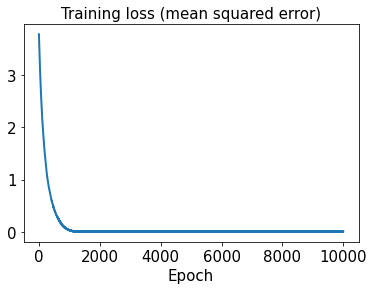

In [105]:
hist3 = history3.history
plt.plot(hist3['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

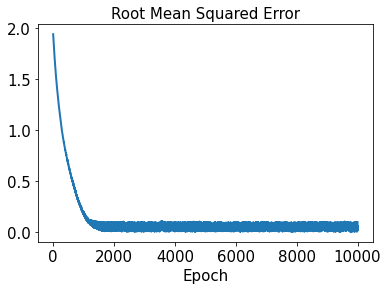

In [106]:
plt.plot(hist3['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [107]:
test_results3 = sd3.evaluate(x_test3)

1/1 [==============================] - 0s 82ms/step - loss: 2.3805e-05 - rmse: 0.0000e+00


In [108]:
decoded_sensor_train3 = sensor_pred3.predict(t_train)

In [109]:
decoded_sensor_test3 = sensor_pred3.predict(t_test)

In [110]:
decoded_train3 = sd3.predict(decoded_sensor_train3)

In [111]:
decoded_test3 = sd3.predict(decoded_sensor_test3)

In [112]:
error_train_abs3 = np.abs(decoded_train3 - y_train3)

In [113]:
error_test_abs3 = np.abs(decoded_test3 - y_test3)

In [114]:
l2_error_train3 = np.sqrt(np.sum((decoded_train3 - y_train3)**2) / np.sum(y_train3**2))
print(l2_error_train3)

0.22706325309835912


In [115]:
l2_error_test3 = np.sqrt(np.sum((decoded_test3 - y_test3)**2) / np.sum(y_test3**2))
print(l2_error_test3)

0.2007422503765494


In [116]:
l2_error_train_list3 = []
for i in range(0, len(x_train3)):
    l2_error_train_data3 = np.sqrt(np.sum((decoded_train3[i] - y_train3[i])**2) / np.sum(y_train3[i]**2))
    l2_error_train_list3.append(l2_error_train_data3)
print(l2_error_train_list3)

[0.24086744898392404, 0.24131423209384362, 0.16331938097341267, 0.14616431224198953, 0.04636217053794113, 0.18856192708024602, 0.09064122001356857, 0.32974002639884087, 0.06938705333481594, 0.3818155387483648, 0.3899227323724613, 0.2931341390656527, 0.1873891513029509, 0.25379766811742815, 0.16163993765064133, 0.28941507664833127, 0.270425011522642, 0.03579634483955883, 0.2829561098415216, 0.3019661193584192, 0.3501217456619524, 0.2745043575236632, 0.3661666780778947, 0.08580128073365076, 0.3588789647660405, 0.17565340953980838, 0.059876804503160214, 0.026264752368476075, 0.013517634976223276, 0.2270232360544529, 0.11056229777346831, 0.21321407962778458, 0.33367075291633974]


In [117]:
l2_error_test_list3 = []
for i in range(0, len(x_test3)):
    l2_error_test_data3 = np.sqrt(np.sum((decoded_test3[i] - y_test3[i])**2) / np.sum(y_test3[i]**2))
    l2_error_test_list3.append(l2_error_test_data3)
print(l2_error_test_list3)

[0.11364435685861338, 0.12916085132298077, 0.20927035800872043, 0.14093314923310954, 0.26480390301917855, 0.2995091814113257, 0.007355520555737178, 0.316803389866686]


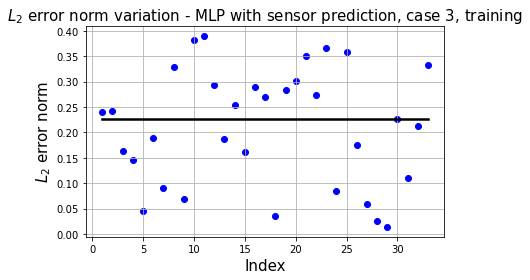

In [118]:
plt.plot(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train3*np.ones(x_train3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

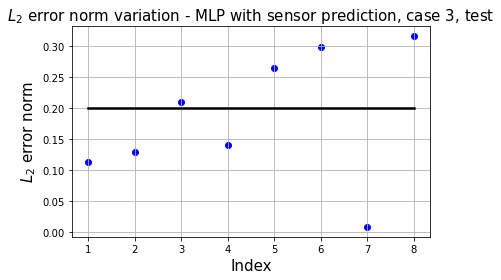

In [119]:
plt.plot(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test3*np.ones(x_test3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

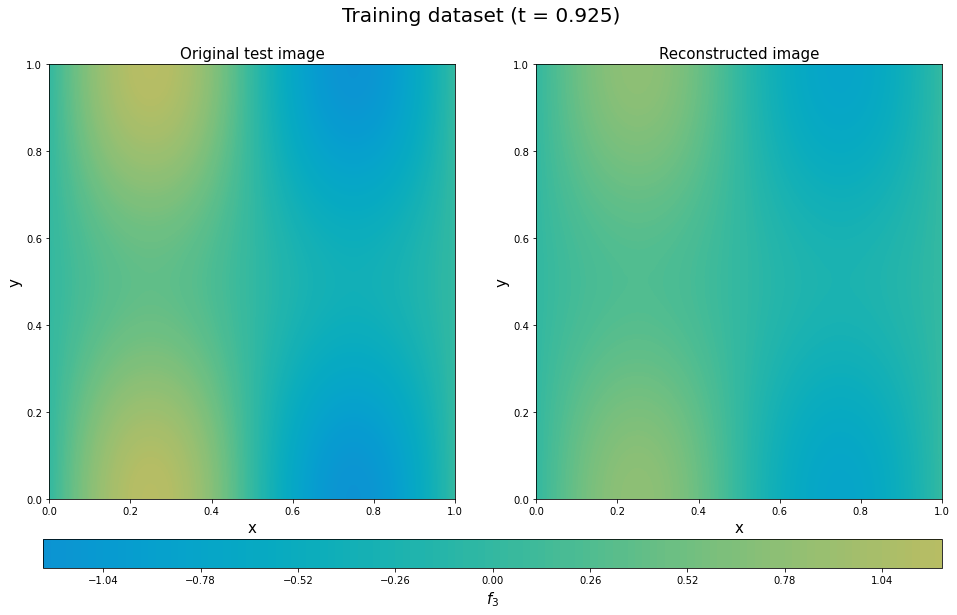

In [120]:
plt.figure(figsize=(16, 8))
y_train3_20_rotate = y_train3[20].T.reshape(101,101)
decoded_rotate3 = decoded_train3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_20_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[37]),fontsize=20)
plt.show()

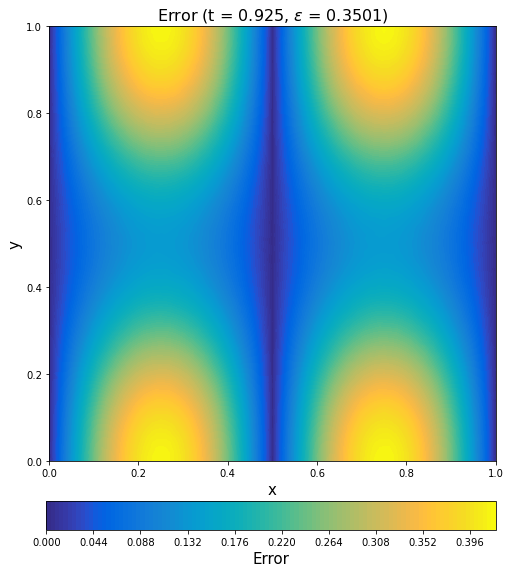

In [121]:
error_train_abs3_rotate20 = error_train_abs3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate20, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.925, $\epsilon$ = %.4f)' %(l2_error_train_list3[20]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

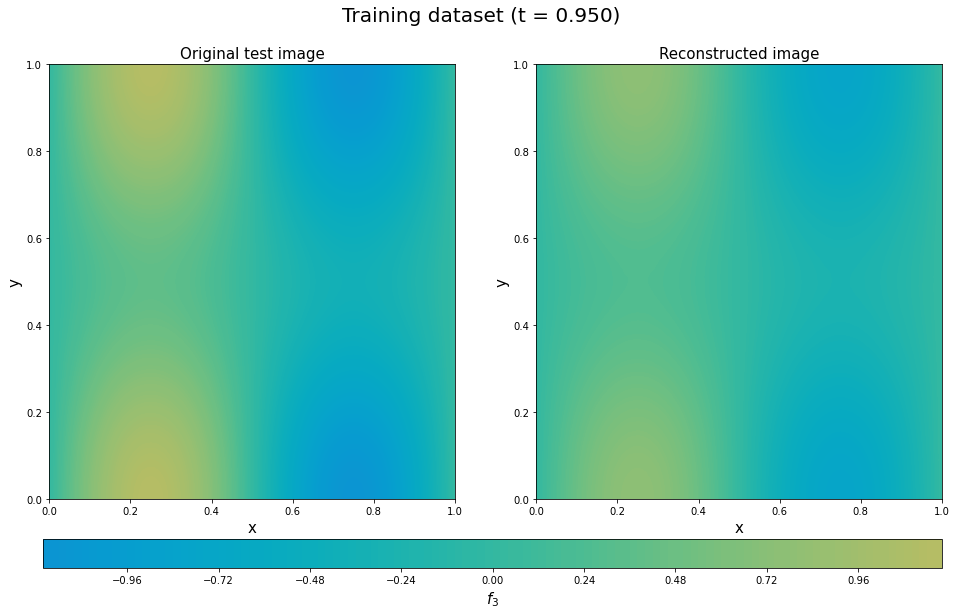

In [122]:
plt.figure(figsize=(16, 8))
y_train3_32_rotate = y_train3[32].T.reshape(101,101)
decoded_rotate3 = decoded_train3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_32_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[38]), fontsize=20)
plt.show()

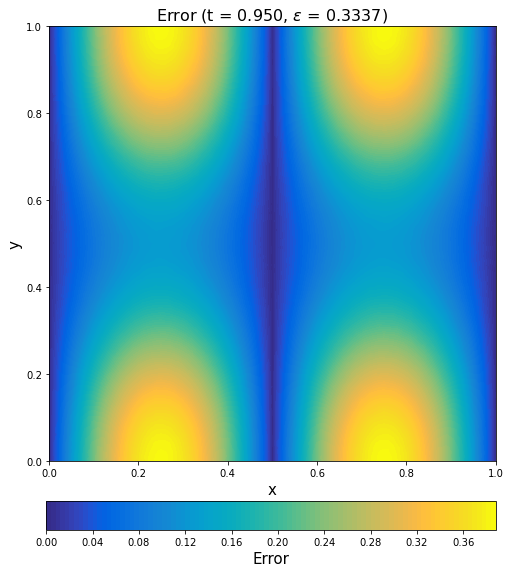

In [123]:
error_train_abs3_rotate32 = error_train_abs3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate32, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.950, $\epsilon$ = %.4f)' %(l2_error_train_list3[32]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

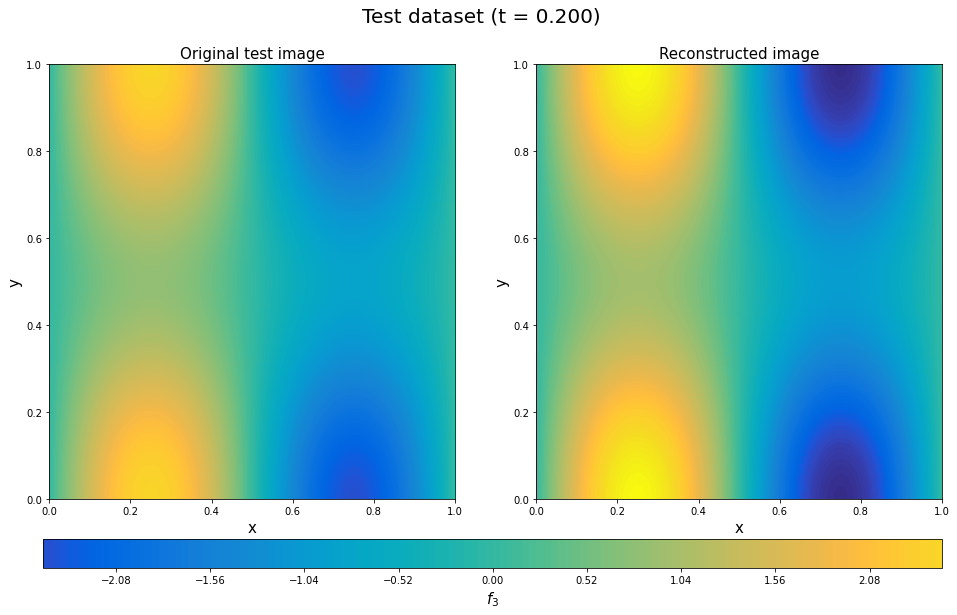

In [124]:
plt.figure(figsize=(16, 8))
y_test3_2_rotate = y_test3[2].T.reshape(101,101)
decoded_rotate3 = decoded_test3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

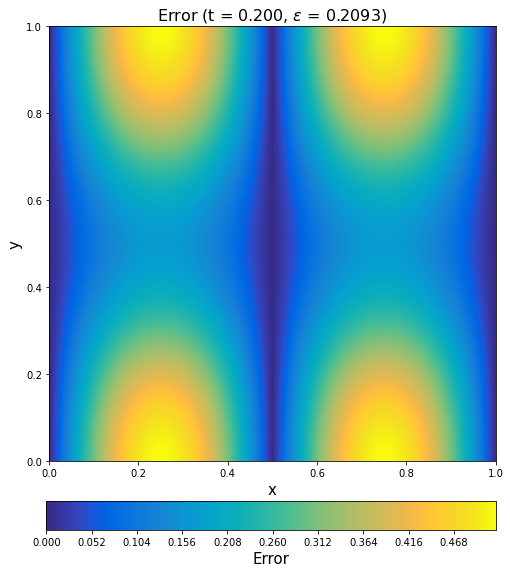

In [125]:
error_test_abs3_rotate2 = error_test_abs3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list3[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

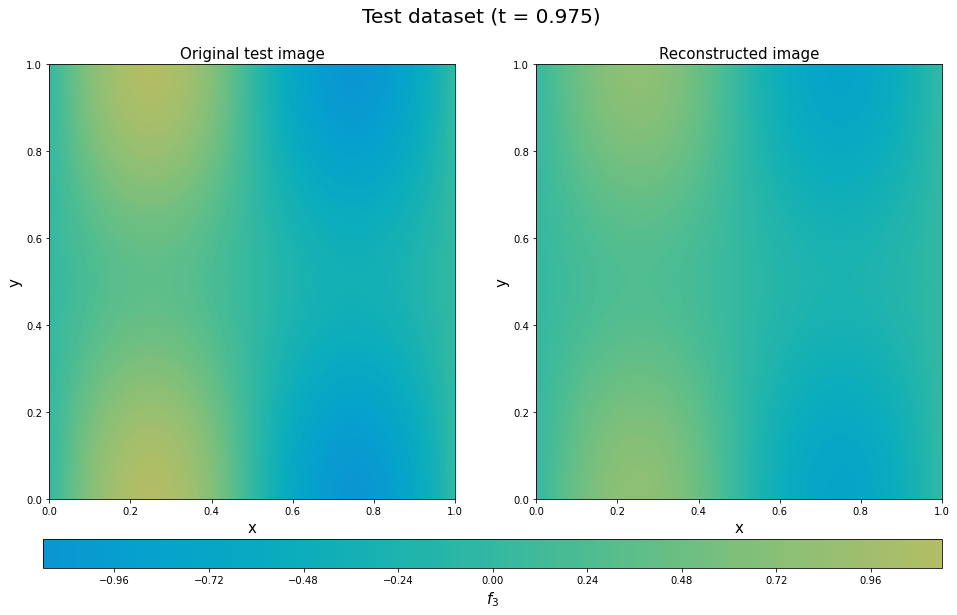

In [126]:
plt.figure(figsize=(16, 8))
y_test3_7_rotate = y_test3[7].T.reshape(101,101)
decoded_rotate3 = decoded_test3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_7_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[39]),fontsize=20)
plt.show()

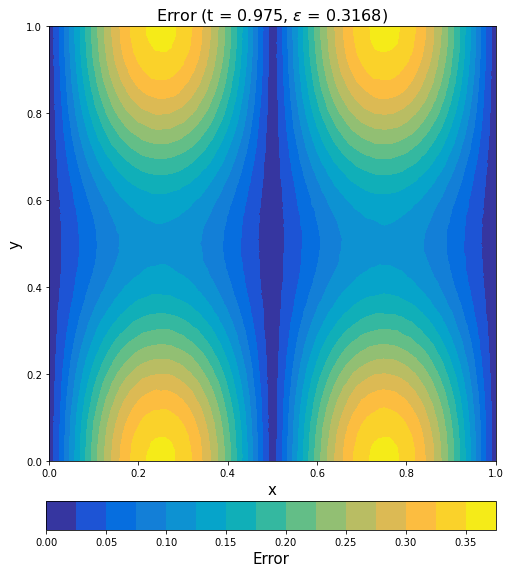

In [127]:
error_test_abs3_rotate7 = error_test_abs3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate7, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.975, $\epsilon$ = %.4f)' %(l2_error_test_list3[7]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()